# **Image Processing: Week 1 – Fondasi Citra Digital: Geometri, Warna, dan Anotasis**

Minggu ini kita akan mempelajari konsep fundamental dalam **pengolahan citra digital** dengan fokus pada representasi citra sebagai data, operasi dasar, transformasi geometris, serta anotasi visual. Teknik-teknik ini merupakan fondasi penting sebelum masuk ke analisis citra tingkat lanjut.

**Tujuan Pembelajaran:**

Di akhir sesi ini kita akan bisa:
- Memahami bagaimana gambar direpresentasikan sebagai data numerik.
- Melakukan operasi dasar citra seperti resize, crop, dan konversi warna.
- Menerapkan transformasi geometris: translasi, rotasi, dan scaling.
- Menambahkan anotasi visual (teks dan bentuk) ke citra.

> *This module is inspired by the development of last semester’s materials.* 

## **Pengantar**

### **Apa itu Gambar?**

Secara sederhana, **gambar digital** adalah matriks berisi nilai piksel.  
- Setiap **piksel** mewakili warna tertentu.  
- Intensitas warna ditentukan oleh nilai numerik pada piksel tersebut.  
- Gambar berwarna umumnya direpresentasikan dalam **3 channel warna**: **Merah (R), Hijau (G), dan Biru (B)**.  

Bayangkan gambar seperti lembar kerja **Microsoft Excel**: ada baris dan kolom. Bedanya, setiap sel tidak hanya berisi angka biasa, melainkan nilai yang menentukan warna. Hasil gabungan ribuan hingga jutaan piksel inilah yang membentuk sebuah citra digital.

*Sebelum lanjut, kita coba import library yang akan kita butuhkan dulu*

In [2]:
# Menyiapkan gambar yang dikirim user agar notebook bisa langsung dijalankan
import os, base64
os.makedirs('data', exist_ok=True)
_img_b64 = '/9j/4AAQSkZJRgABAQAAAQABAAD/4gHYSUNDX1BST0ZJTEUAAQEAAAHIAAAAAAQwAABtbnRyUkdCIFhZWiAH4AABAAEAAAAAAABhY3NwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAA9tYAAQAAAADTLQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAlkZXNjAAAA8AAAACRyWFlaAAABFAAAABRnWFlaAAABKAAAABRiWFlaAAABPAAAABR3dHB0AAABUAAAABRyVFJDAAABZAAAAChnVFJDAAABZAAAAChiVFJDAAABZAAAAChjcHJ0AAABjAAAADxtbHVjAAAAAAAAAAEAAAAMZW5VUwAAAAgAAAAcAHMAUgBHAEJYWVogAAAAAAAAb6IAADj1AAADkFhZWiAAAAAAAABimQAAt4UAABjaWFlaIAAAAAAAACSgAAAPhAAAts9YWVogAAAAAAAA9tYAAQAAAADTLXBhcmEAAAAAAAQAAAACZmYAAPKnAAANWQAAE9AAAApbAAAAAAAAAABtbHVjAAAAAAAAAAEAAAAMZW5VUwAAACAAAAAcAEcAbwBvAGcAbABlACAASQBuAGMALgAgADIAMAAxADb/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCATbBDgDASIAAhEBAxEB/8QAHAAAAgMBAQEBAAAAAAAAAAAAAAIBAwQFBgcI/8QAOhAAAgIBBAIBBAECBQIGAgIDAAECEQMEEiExBUFRBhMiYTIUcQcjQoGRFTMWJFJiodE0Q3KSorHB/8QAGQEBAQEBAQEAAAAAAAAAAAAAAAECAwQF/8QAIREBAQEBAAMBAQEBAQEBAAAAAAERAgMhMRJBEwRRYSL/2gAMAwEAAhEDEQA/APz+AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAHR3NBrVqILHN/5q/8A8jhkpuLTTaa9oD1AHJ03lXFKOdbv/cuzoY9Vgy/wyxf6bpgXACd9AAAAAAAAAAAAAAAAEOSj20v7mfLrtPiXORSfxHkDScjyWtWS8GJ/iv5Ne/0VaryOTOnCC2Q+PbMQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFn2ZfKD7MvlBcqsCz7MvlB9mX6GmVWBZ9qX6I+1L5RNhlIBZ9qXyg+zL9DYZVYFn2ZfoPsS+UNhlVgW/08/wBB9iXyhsMVAWfYn+g+xP8AQ2GVWBZ9mf6D7M/0NhlVgWfZn+g+zP8AQ2GVWBZ9mf6D7M/0NhisCz7Mw+zP9DUVgWfZn+g+zP8AQ2LisCz7M/0H2Z/oamKwH+1In7UhsXKrAf7Uifsy/Q2GVWBZ9mX6D7Mv0NhlVgP9qQfakNhlIA/2pE/Zl+hsMqsCz7Mv0H2ZfobDKrAsWCXygeCS9obDFYDvFJE/Zl+hsMVgWrBN/A8NFlm6jVjYZWcDr4fp3WZusmGC/wDdJr//AIVanw2bS3vz6eX/APGT/wDoamOaA0oOLrv+xG1/BRAGnBoNRqZVjh/ydLH9LeQyK08Mf/5N/wD0T9RccQD0K+jvIv8A/Zpv/wC0v/oy6r6d1ukf5yxP/wDi3/8AQ/UMcgDp4fBavO6i8a/u3/8AQ+o+ntXpq3zwu/hv/wCh+oY5IHQ/6PqKvfi/5f8A9FcvG5oduD/s3/8AQ2IxgWz084d0JsY2BQG2P9EbWXTUANsYbH+hppQG2P8ARG1jTUATtYbWDUANtYbH+hppQG2P9ErHJulRNTSAXf02R/APS5V/pGw2KQLo6XLJ9V/csWgzP3H/AJY2GsoGz/puf5h/y/8A6Il4/NBW9v8A8jYusgDvFKL5Qfbf6GxNhALfsSq7Qji0/RdNhQJoKCoAmgoCAJonY/0DSgNsf6LYaXJNcOI01QBfLSZI97St4pLuibE0gD/ba9oFjlJ0qGmwgFy02R/BDwTXwNhsVAWfZk/gdaXI/wD0jYqgDZDx2abpShf93/8ARM/F6iHe3/l//Q2DEBd/TTuriMtHlfuI2DOA8sUoumH23+hsCANsf6IoumoAmgoCAG2P9E/bfyiamwgD/al8oPtv9DYpAH+1L5Qfal8obAgD/al8oPtS+UNgQB/tyXtEbH+hsCgNsf6DY/0XTSgNsf6DY/0TU0oDbH+g2P8AQ00oDbGGx/oabCgNsf6IcWi6uoAmgoCAJ2/2Db+0DUATt/aDb+0DUATt/aJ2v5QNKA2x/oBpraBO0nac9di0A20ihoiidqaIGSFEbECil2S0FIzekxCS+BlQUMoozoW0HA21WK/0J0YhoUYLRuUKRYzoW0XQbgTsLRNoaAihlXsngaUqRKRNokamI2kOIwPgmmEolJMm0FjTBSFGbQraLFABZKoKV17Dj4H4IdekELSCkSAXEUiaAlV7JRAPgl0F8GQjdsmlXPA3rjsbHjc3zygzhYx56tfJZHT7ukbcGlTSVG/HpIQW5tFGDTeJnlknVI6TjpfH47dOZTqfIrTw2wfP6OJn1cs8m22UbtT5ic244+P7HJzZcuV3OTIb9jY8E8r/AEVKTFjlnmoRs7mi8PDHtnmmq+GGkxxxpRhj3T+To49Fmyc5rin0S1FsNRp8FRxQV/KLMuuzLHcUGLDptNzNptFGt8lijFxxpMxprLk8xqouraMmbyOpzO5Oy7TaXNrcm5xqLNeXSYNNH8qsJrmY9fnxrjgqza3UZ3+TZtqGSVRiUZ1HTyuUbQNZYZMzfCbQ88mVR5ia8WswbbUURPW4ZKtqNJrk5MkpOmimS4N2aUJ8pIyTgyxKqoKGcX8EqD9mmCUFF6igcUwM7QtOzQ4IRpJjV0gDAE0oDUANKNCWx3Vg+SdjCtEdWo/6TVh1+NupRRzNnySl8Ewd37uGatJDLauaOHDLODN2HO5RqyDTl1Ch6RU9XGS5SKsyclZkaaZBbllGTdIyyfPRbbElE1EJvdCS5YzRDVliwgEvsg0oCwFCwwykJYWMMPaLI5pQ4RTYDEaHnkxHNsrtg3wTAxp0soKVSr+5mXIyIjpZtkV+Jnck/RVHJ+O18gpkRYqLFNIp30G5BuNMJyUuHR0dPqoSX28qtP2cvG7aLl+ifFkbtR41Sj9zDyv0YXF43tkqZs0utnp5fMf2b5Y8PkcbcElkromrjzmfHf5WUbTo6rA8MnCSaaMM049jUtxTKJW0WOVis3GNVgS+yDSnGFGMs0y6IaJirAjcqLJRHvokKAGSVCvsiIfYrJlwSqNH1EV8jcEcAiCSKXwTZFgRtXyFfBNolAwtBQwBMI0RRYA0xTtDaW0g2ouqpAt2hsLqKgLdgbBoqBFuwNg0JxQD7QJo07hiKBGNd0it2MK0KRFkphTJSofVAABhAhiEMXEqCKGAYaSiKHa4ILIulpi7GW0FFTVO1kqLLaIAQmuBqRBL6a1FBT+SQJqDn5FoYBoUZCtpDJ8F0DQriMRTLoVKiSdobTSoAGqBKwJpk7RY8Dk1EbQSokAAmrZA+JXIM2mx4tz56OhgwQ4SFxYU1bYuo1MMMGk+SGteSeHTxvcrOVqdfknag6RinLUajJxbR0tL42GxSyzp/BcNcqX3ckrdjQw5Jy2qJ0s6xxltiuPk1aR48Suk2NVl0/ipySlLg2LRxi9trgvlmnl4hH/giGlm3eWe2JEPi1WLRfwx75EajX6rVRuEHEieXBg/ilNmLP5DJykkkRz1dHFKUbz5Nr+GVL+mhk/KSaRzcmfJkf8AJspcpfIw16DL5iODHswJf7HKza/Jllcn2Y7/ANyG7LhrbDWyg+OxNRq5Zl+RlsJMYabdS4F3c9kJoi0XE1Ymxq/YiaZI+IujBVyE1FdFVv5Eak32NMPfINsEmNRUVPcIXsRtLmihFFv0N9uQ6yx/9ISzJ+iBftT+BHFpln330hXJsLiFFsdYm/kRyoaOXaDDPHKiFBrihv6muyVniwJ+zKS4ISnifJMdWoDS1EcpA0c+7hllQaMbVdDKT+QqyUV6KZtIdy47KZu2VmlYrdDCS7LFiH2QAPo0oFAllaQAABKJsUAGAUlETEjpiDWiVKdMmxEybJjOG3cjqRSSpUTFXQk1I2Qkmjn2vktw5PyolnpqXK22vk0aXPLBmjOL6Zge7da6NeGUXRjMb10vKOGqxxyQaUq5Mml8fHWYJY+pfI0abp9FuGawytF1mxwtVo8mkyOEk6XsztOj0erUdRG5HEyxqTSNaxjJJClku+RGbixNj2VDroWJYsiM1ZWmWmKRW+AQ7VgkNT+lbI7BkxiU3S8eyaGlEgNcookACpSsNoRGJrUitxojksf7FY0vovIwAVkAAAAATtIYgCdobRq4gCdobRpiAJ2htGmIAnaAMaVwSG1/BBz10TQrQwG0KBNBQXUBQ8Yr2G1E9KVDUTSJNQxCjfbBquuSQFwwrQUxgJDEKIUiQNLiNpDQwDExXRFFjFJiIoGiQJiaWiBxRiyl2r4JJIbJYoJohDIQqAJYrNIUCdrJ2la1EUWpWhEMZqaGkRZJCafQNDRdiqKtiRg5M0LBBQ3SYZo+9Kf4x4JeHDFb80038GSeeMbjBmaW6cvylZplry6yMfxwxX9yqOTNklzJlSxWvhmnTYZykokNacWP8VbtnQ0fjsmWSlL8Yfs0aTQQwR+5N2/gTV67Jkf28a2R/RDW6ep0uixuEUpTrs5ObUzz3u4XoIY0lbe5/LImscU25ImGs+zkxalctluXWwjajyYsmdzdlxmkbIb+SNwNmsTYLJsVMmwaamDt+gVjf7EC7b7Dai2ONyG+zIgo2pELvhl0sTFWJplRX+THSY8cUmy37LSAq9ADxysPtyLphZCbvlGzBpt7TfRZmwY8a65M6OfH+w3293ospE2xq4SOnss+wlxRCcvkHl55LKFeErlioteRUI8nwUVPEJsr2WOZW3ZZqIaRCbQzQhYpt7BTYJIh9gPub9hZWFsYYssSQWyLsSGAh9Eg+ihSWQS1ZWkATRDVAAAAASiAAYAXQEZMnwSITbJgYhugvkh9gTuBTpigXB1NPnhkx/bfDIwtwy0+rOdCbjJNHSwSWSUX7OfUXW9SXBKlbEytYoWLjyKcGZNWZMkXFpM42XJWRouyZnHLJXwZZ8yZqM2tWPDDNiv2YZx2TcSzHlljfD4EyPc7NQITEgFwaVYi5clMey+PJz6TEdAQ3TBEVDXIyRF8lkUttsUI+mIPLm6ELFgJTIJSCxNoLRG0NoXaGD6QbQphPaAACoAQErsgZKgAmiLtQAAGwAAAUFE2FkRFATYAaqCi/avgNq+COiigov2r4DavgCigov2r4DavgCiiaLtq+A2r4ApphTLwKKKJ2P4LgApcH8EUy8hxsDPTskeURCwAABqUQwokG6KliKIAglrIAAMhaCuRqsmjOLpNpKQ9EUVNK1bCh9pG1l0IA+x/AKDLqkJSG2+kMoU+QK2m+B8eF3ZdGKq2U5tQoJqIZqyeSGKPfJjnnlPi+CicpTl2W44cWXGdEYe2WxjFPoaEFJm3B4/Lma2wbQRVhxLJJJLk72g0KxxU5IfTeNxaSG/LSZk8j5fHGLhhkuPgjKzXam5OMeEjmZNbjwp7mmzlZtbkyN/kzM90uWy41rZn1+TK+JbV+jO8033kKtobTWRD3+wf9xUiSIBl0RRIQDRXIJFi4IQ0YptJo1RxRUVxZVhxSyTSirZ0cWg1FrdDbfySt8//AFldL0GP/MlSRvyaHZFuc0Y8ebFp8juSdArRHROfoleO2u5OkLHzOKMqSsrz+SeZVFUiotyY8OPp2ylyj6KFJvlsdRlJcLkluLySVWWYIR3XJcFuHx+bM7p0ap6OGLHUpIzarHnyprbiX/Bm+zlfMkzdF4cXPbHWqhLhxSMow49DmyP8YkZNBqMbtrg6mPXRwt1FFGbyUsrprgo5/wDS5fgqlpci7R0P6oqyahtFhXPljlHtFb4RqyZN3BTVmtRQ+hebL/tpssjhgzWoyNkGqeGK6M8o7WWVUWQAFAAAAAAAAAAAAABFAyRWFgAAKoAAACV2QC7AYAAjIAAAAAAA06XK45EjMPjtZE+uSUdfXSksUf2JpP4/7HWy6WGo8Gs0eZxXJxdHKsjRzsGbK7yP+5W+S/Ux25X+yiyxj+kfZD6JZDZuNFAAKp4csuUJRd1wyiDqR6LHpIz0cZtGOrjUcmGFy/JmvR6e8rl6GnFRTijRjrDgb9mNVztRjX9TSGyaeSikl2X6TTvVahz7SZ1paeKx210B5txcOGK0jRrq+9+JQoOrASuRq4Jr9A012AoABWgAABFWQ1wMD6CWEJfFAkEis4lOySF0SuyGJoKJAi6AAAAAAAAAA6IAAdQAAAAAAAAAAAAAAAAAAAENWJKJY3Qrdl1VTVEFjQrRdQoE0QW0K7ZFMcDGphKZKXIwAxKDggETFBDaG4Fas1iWDdRKnyLtIoYz8Wb0RvRW7DkvtTb9qJjL22VS/uVyyVxYZ1bl1HFIytuTsOWSVm1C47Nmnwyy0kg0mgnqZJ8pHZUMOixK6sM6r0ughGX59nS/rMGhh2rOLn8n/wCg5mfPPO7k7IN/kfMz1MnGDaiciUnLtk7eCVFFTFVMYZx+ApJcl1SgT7CgiCUFEgAyRFkkZqyMSG6BSZDi2xrTRg1ctO04rlF+bzOpzRSbqvaMcdPOfRfDR1zLgKonqNRk7yMz7JuVuzpPT40uxXCKGjJjxtO2aUlQ1Lb1yLwho0YMTydHR0unlHtr/c5kNUsMOCqXksl/yZmzWnez63Jp4OMUjmPJLPP850jBLXZJ9ysreaT9k/LN6dHLLFiXDspepg18GC2+2wq/Zfyn6a5Zk/ZU8jsp2samMNW/cFeVlTTGSKam77BugIaIqHIVTd9kSYpuIsc2VSdkg1YgQCaINKAAAAAAAAAACLJFCxLZAAVQAAAAAAAAAEokhEkSgAAIAAldgC7JbomkK1RB6Hw+ua0mXBN3Fro5rmseaTivZXpMjg3T9FU8jc3yRFmpy/clZnsluyAAWQwUUIBLQyVl1Sx/kj1eklv8Y17SPLxVSPQ+NyVppRftHPtrlge5yf8Ac3SwzloZT+ECxx5dHT0yhPQZMb7owrD4SoxlfbZp8hl+3hkrMemyLTZnH9lHkNS88mkFYoRebLf7LcmNRLtPBYsNvtlOXInYFD4Ys5WSyuTLEK5chuItfAcGjU2SL0yU7IsqQAAoAi0SEAAAVNhYt/oL/QxDWFi3+gv9DA1hYt/oL/QwNYEADHTAAI6AAAAAAAAAAAAAAAAACRX0CZrlUtEbRrAYK2qFLJcorfREpAACWgACUgsiApjqIUIuEAeiGjSWIonaQmMGS9cEEtUK3wXVQ2hbIb9lcm6GslyZKM9uUuCZJyYJUWenKnUvRr0mkeSalLor0+FN3I2TzrHDbEiVtnq8ejxbYVZyNTq8meTbYkpSyStiSpdEZJbvkluiO2FIrURut9DN0K3XCEci4HchexLLIqy5hUUxkhnBx5ZG74Ms6KBonlglYQtDKL+CyMUPXAFSi7GT2sYIwt9kWLsWp2dosyalTRQ8K+SviL5CrN9PslZkimU1fCBP9FFryOSFcnXJKTfoHib9hdU8ysVYlfJbs2+xfZNSUuxLogexAnQAAKyHIlNshJMsSRK0lRbHWPglSSQPIiKScaE9DTlZVdlxYWStkUNdMhs0hWR0gbIbsqhuyAAoACwAAAAAAAAFGFCwAAFUAAASkQSuiH2EAAC7CmAAIyAAAAAACUyW+BQAeE3FMW7ZALsBwADKAAAAGXQpKBV2KG6aR3tPpZOMYxXLOHpf+9E9r4zEltnJcJGK3y4s19mbhLsiGtWKTXoXzOZPWycHwc23Jd8mVacmX7mdtdFksUdqb7M+KKSsJ6h3tsB8uThRXozS5ZO5ybEk/gL/AAsmI+iWmwopCbQaGoC6xfpCbpEtCtUVQF8AAQDREYJv0VYsAW37RKZnGxYbhX2BcY024NwoDDabcFiguxhpr/QBYEadOwskDGV1RYWSAyiLCyQGUAABpAAAAAAAD6FqhiLClJtkAVRdkNWSAFdBRIGFkAASixQFgBsTVhRPoCMkfBG4mXJHXJWU0JNUh9xVOV8BFUmJJ8DMrk/RI59X2j3Rfi0c5rclwW6HRrLlUp/x9m7VavDp7x4klRplhcXiVMzylbJyahzbbKXK2MZq3ckuCpu2HLBLkMpUSXSQOVIrbsNQSdiVbGHglfJrcCxxORrhGGKNt8md5K4RW5OT5ZPotyZd7pLgu0+JVul0UY8du2X73W0lSjIouVRXBH2W+iOnZDzSiQWLHtXLIc49FMsspdgk2roqGlL4BSaQlP4L8WnyZF+MW0RYq+5Juky2GNyfJsw+PV7pKhs0ccOIhZEYsOHbcuyZ/ZguEVJ2uCubI1hcmVJ0imWWQ0mr6EGpSuUmRf7Gk6RU2zU9s4ZyIsUmymJAN36Ib/QMTYykVkpjDDuRG5kEWTAOTYbmQBVQ3/yQ3YPnkg0oAAAAAAISokAAAAAAAAAIfZJD7CxAABVAAAEphQJDJW6IhBh5woQGgAAIAAAI4JsUCrhgBdAREpWiaBP0SQAABEAAAAWQg5dFZr0qt0SlW6XFWeNnrZaiOm8dfFtHlsb2zb+DTqtXLJgjC+EYWVj1OT7mRsoUmmE5Nf3FsY2t+60hLt2JdjIB0xX2SnwK2ArlTJsVq2NRVDZAPsA536AAlUAjRA/AcDQhKGISLqz2kAAjoh0/ZFMldskqWEAZdsUMyAAANfkAAFYdYAAw7gAAAAAAAAAAAAAAAAH0LZL6FCwARZJVAE0Q1QCsgZi0SxpIEUTRYACaCipqfRDJIZE3EESBuhJSsawhsqlIaZRJ80hGLTWi/T6R5Z7pcIXT4HOVvo15M6xQ2RDOo1Wojgx/bx9/o5cm5cyfI2WTnNtlbfJqM6gZEUCRWasglfJM2vQli3ZMEAAFUAFAAEpckFsY0KGjaRLBdlkYWZCU2uOxsWlnmkXLbFckx1scSpdhG3D4zAknNl/9JpF6TORLyEpPtiPXT9MrTtyWlx/6UUz1mLEvxikcaernNdlLnKXbGI6mfyTkmkzJDLPJL2zPGNvk142oLgB9s64TB48ku0H9S48ErVt+jKxU8E2+iHgml0WvUSXJH9U2uUCs8oNcNFbi/gvll3eiqUixlW7I2ssUl8DqmXRnoC940yuUKLoQAAKm+CAAAAAAh9CjN+hTUUAAAAAAAAAAAAAAAAAQ+ySGFiAACqCUiCUBIABGUuTfbIAAAAAAD0AegFAAK0ZdAC6AiAncyACHXIELokiAAC6IA6uhhH7Tb7OUuzo6bJtxtEoWMqnNPjksa/BtmZv/ADH/AHL8mRR07tkIyZJpy7E3WU3bZMbs3jS9dlhUn7LbMWKCG+AZD57JhoQxCRYkF0ji30hlGjTggpTSQuqwywypqrImMslQrfJY4v4EcbZYYVsLY322Q4fsvpMCdjIRWh06JST2khxpEjNWiOkVgAFE1wI+xuf9goJCAS+yCrekv+IBfABiuqAATK7AAAZQAADKAAAgAAAAAACJdCNWWPoWgsIMiGgRWlqQsiU+BZOyIV9kE9kMqgAAqmfRFMZdk0iMVXLoVPgsk0UyfwSpSznyJKRE3yVSlSLjnUyn6LNPi+7JGV3KSSOhgksUP2XMYX5ZxwY6j2c2c5TlZflk8jKWqCVUR7HmJZYykCLCymJAhPkmm+EBDJ2tdl2LEk90+EhM2RSn+KpALuSVUI+wJXYU0I+y1dix6H2PbZP6JD7m0qlOv7lbbY+i2eZy9lN2AFAABYAPGF8kQhKb4Ru0uhlOX5PgUUxh8DrFKR1/6HDjx25Kzm6jJHG2osyYrliUVyJSRW8spdiOfIVdJqqKXOguxH2JCm+4K5NitOyTWILZKk0QAFiyNA52iqyUxhgAAAAAAAAFdlUMgAKAAAAAhsgLhgFJspiQACIAAAAh9hZBVgAACglEAAwABGQAAAAAAAPoCH0BAABWkp0SKSglSAARASmQADWieGINEgZK2XQk0Upjb6ZmouVSd2Vaie5KKfQksr9FfZZFgJTIA0LIstgzOnyWxdMzYVelYrVMuwx3ISapskqFXZdFKhF0Mv4/7krcadJJLUR/udTyul+7jjkgukcOEtsr9nrvDOGtwfbnzwYaeTyYpRptNIXYj0fk9JDHN40ji5NO8bAyuJXLs0yjRRNUVFRNch2yV0WKkZPgUZKjVIV0R0S+xWZw+1NivsCX0Aj7IJkQVm/QAAVHXIADOu4JIAaJAPRBbQWRaIl2QZS01okQZdAl1JFoH0KGpD2FkLklw47LhhWQAXQVKdEMi+QJbgEDQDLomhaAehCaqbIc2D6K2WVmhy9lbk2SypSpGnO9Cb4Msm3LgtyTKl2bjnauxLm2PKX7Ei+BG7ZE07m2Mv43ZXFORGSTjwP6USasRi7mSnZcTEgAAMot80WY3slb6Nmhxw+1J5OjJnnGWRqHEURBnzb+I9FP7BkFiwDRTboaGNyZrhjhjVsahcWFL8pFebMt1IM2e+EZny+SYqW7ZABZQARbbpGvT4FxKfQvoZ1CT9FsNPzbOlkyadY4whCn8lUWm6RNEYsVdIvc5Y48MrnWJXZmnqXLginy6jJLjcyhxfZMXbsarKYqceOitxSZokuCpkChtsCYvmilRstg8TGcmnwh3NpL8WGVccEpdJsux6DLmdQhJs6mg8lhw4tuTCpGrF5vBpm5YtOlJhXFyeI1OKO6eKUV+zM9O4+jsa3zebWS54i10Yfvx+BrWMbxS+GI4uPaOj/U4VH+Dv5M2ozxy8KNUVKzAS1wQEAESFLigAAoAAAFYABWgAAAEpkFkMbkEqIq3RM0o9DusapdlTdsiFAlsgrQAAAASsCUAUSAEZBO0lLgkmhWqIHfQhYAh9EkPoKgAAqgAABrAUAmGAEBEAJ0AAMnYWhQJgAACgAErG2gKOmKlYO0KNenyU6LMiu2UaWLk+DT26Od9VCQW5DSVf2BWpUbVpt+LcjNrcc/bbOz4TXPS5km+Dj5koTosxSqSaJWo9br0s6WZM4urd0Xx1D+wkYs2TcIKJmbI+S2cjPN2wFvkZcIVdjG4lBYisdCrENFbLRGKtIT6JFMoWRBEuw9G2akAXQBHWAAMO4AAAn0QT6ILQsuyBmrBIjNntFcDA+gDRZEEy7IK0LoncCVg1QEAAAAU/gAsgmmSSuiCdIBBxDKwN8FcmM+SuTNSM9VBmyS2uiyU1Fbn36Ms5bpc9m5HK1Dk2xkQkT0jVc6mwjHdKiL5NnjNP8A1OrUa4A1PQ/Y0kcsv9RycslKbo73ntQseOGmh1FHnSyKAAChk7Ro0+L7k+einFjlkmopHTy41pNKq/kzNSs+pyqEPtwMa+SZNybbBICOyyGNyZMMbcqo1rbjhyRERUcUbZmy5nJ8PgjNl3vh8FTdFkVFOyQXJpwaSeZ8dAZtrk6Rfj08u2joQ0eLTx3yabKZ6mCdImmlwaRznwjXl0koRv0UYdb9p2iM+vnldXwQK4pO2+SHkS6ZQ5uT7IGick5S7fAkYuTpF8Me5cl2PCoO6CxTDDNctDu4rovlm2qqM8pOQVVkkVdsuWNSl+UqRM/t43SVgVxxSl6NeHxssrTckkZXmlVJ0iY58sVxNgdyHjtLginkyJs0zfjJ6dwpb/k8/Dfl5cm2X49HnzNKEWRFeXSbJtwl+NlcoUqO7g8Hq54rknZrxfTWdxucSweTalXQlSR6PW+GeBXtOLlhtk1XRncaY5XQhfKJW41yblZpX0QS+iCpCyIGaFNRQAAAAAAKBNEFaHZNAiVyEEYts0WscKXZCWyP7K5Mymlbt2QAFAQ+ySH2VYgAAKCUQSgJBdgSuyMmAAMoh9Cky7INKAfQB6AUAArQAAAAAAGXQAugIgAACAAAAACUgGXCJSbIRbi/7i+DNRVscXyTKNROlqtOlBTiuKMTVknQt0MknTLVGszv5MeJ7Mq/udSUN6jJE6U+TSv7SyJG7QuMtLKL7IWSP9HsfZg0+WWHI1fDMX61GLXJw1EkWaWDmw8j+Wbcvg1+PivtN+zX8ajQvxxmTN7NOWXNGeauLMqxttsrkuSySpiyQZVocQdG4tA4g5aSgR9jiS7M1agV9jEP5IkVS7D0TLl2R6NspAF0AR1gADDuAAAJ9EE+iC0AN0Q3TFbIqd1jCIcBZdkEyIKplwiG7LEuOSNn7ZbDFZNMdx47Yt0iCKZO1Ebg3ET2YgEyGyVEiA5fsXevZJF1MuEUTfD+Cyc0/Zlzy4pG5HK9M+Se6X6CEbENeHDJY/uPpnSudU1QDZGt3AqdkZQz0XgcccWny6iS5rizzyVzS/Z6HJljpfCbV/KQVxPIah6jVzk3xfBkADSglOiB8UVOaT6A6PjMaTeSXX7F12f7s3T4QZMqxYdkHzRkUZN8mayIxseGP8iUqVDOSirM6LZbcUbMeXM5v9BkyOfBXtZqLBFOT4LVhm+48EQqHPsmeaT4T4Ka04YYsSudNj5NcorbjVGBtvtkEwW5M88jttladsgaMQAZJjJUhlFszqIUS6EPbFVR7Fll+CDQpKJDzX0ZXkI3NssWNDbZW5/7C267FfLLqmc21QnLLseLd2Wxwq+iaqiOK+y/FjxprcrRasD+B4wjBNyrgzqLPuYcULii/SeZjgf8UcjPkUptR6KwPXQ+sdir7SpF0fraCSThweL2t+hHE1B7TN9TaXVKpxRy8+q0GW2krPPKIdO2MVfkac5V1fBVJqgbEkxImJ4FfZAGkBG0kChH2APsCqAAAAV9k2FBQmXYMUskvxi2VQjckjtaeWPR6OTklvkErn5Ft4fZml2Nknum2n2ICQAAAAowoWAAAqgF2ALsBiYrkgaHLJWTNcEDvoQzGYV9kEteyDTQD0AegFAAK0AAAAAAAsmyAAmySESRAAAEA4g65JQDRdOx4QTXJLxkrOujDUQy6Zwk6dGBqmVxlUiztmSKn/3F/c7OGpYOHzRyJL8rN+hyO9jY6ah5ZZRtejPPI3K0aNWlGXDMhhqIyyc6s36KW3HRgasvx5Nioqyr8s/ybsfTyjJSizJKe5k4ZtTRlouRbZtDadR+5FzXFk5lUypy2x4L/UqNQovK3ClH4KUxZTbmMaDqSJYlErosrP8ATR7Jl/EiPZMv4it/xW3yQD7CiIVkDNWRXJWbEAD4YB0k9OsAlsLZlvDgLYWa/If0QK2yLZKYl9isklLsQwqHjyRX7JSphZyJfAq7HUbfJKVMaYYCLIcdyRd1Q5LorbsbZ+yGiFpQslrgQzWbUt8EbuAIfRGbSuXsqcm7SLXjcjRp9NFO5clZYY3XJTmds6evjCM47Ekv0cvJzJmp9c6qxq8iT6N2ozxjjWKHSMS4drsjmT5OiByJQUARZjVzT+DVrtQ5YI4/gr0qTtv0UZ5bsrrokIpDsH2XafH9zIl6NKrcGvXBbBOEWzZqcUVFKLRTjxPJJRXRn9ITFFzlbLskoxVeyzNFadKK7ZklGUpWT6g3lc5NjuFCySvgSCIpN8kuk+CEqAohsTcM0XYdJPLXHBVUJtuki1YMjX8TasGHTK5tOXwRPVRlGopJE01kWJp8ligTuTfRZDkgVQCTUScs1BcPkzKblbYMPJtsRxYKXySm2yIXayYrnkctw4JZXwhqyKtrZfhw7nyaJ6VY4JvsnBjm+kZaw8dPxwacOmhFbpGnBhUIb8v/AAzBrdb+bhjVIi4TVamMPxgjDJzyLvshqUnbTGjPYypghp2+xnhjFcyotjn4M+oludplCSn6RCxzyPiLEi9rtnRxeQxYY/8AbTkUZ46HPV7HRRkxSg/yi0zpS85k21GNI5+bU5M83KT/ANgYqbEZLILGdRTAdUKypqAAVsqofYABVAAAEUSAJWFaNLjTybpdLkjUZnlm+ePgl/hi75ZnDMAAD6CgBbCwuGFJsCiAAAoLcOJ5cigu2VF2nyvFmjP4YBmxSw5HCS5Ihwy3WZ1nzb0JEzWKJMUmXZBIRD6FocKKpA9DUgaVF0VgNRDRV1AAAUAAABKIGXQKAACMgAAAHXAg5KLYTrgtUk0ZRlJ/JlnE+yyPYii63VwSnTJUWbbZZBOHK7Ix/wAR20kRoTm5PkSxXMRu2RrVm5ApJiJNqwXAxZ7XImL2uyIu0LN0MaW5Mm/l8Fcv4Fd2Pf4UMLWf/WWIildgUMSIibCYePZMv4iALV1D7JXAUBEQ0Q0MQ+gEfYEyA03HRAAI6JAAOiIYAwMX6oAAIG+CRV2MhjUMlwTQAXACtkt0LfJPhsSkFEOQu4ymmIaTBO0SkVgv2+SHCi20uxZzVEZpE6GU5VwV7uf0RPLSESqtRNtq2ZJPktyzcmUs3HKlfYvtktiG4kNaJEHXQVq0yuEjNOLWR2atHJbmmJq0t/BEZmrZv02Lbjc/0Yoq5JHST24VH2xRmcpSl3Z0tFpJrG8klROg0ePic2jbrvIYcWJYsdGUcfUQlPK5fA8IxcPy4ZMZpzTb4M+ryre1B8FFGpl/mbYl39LWBZG0ZOnb7LMmqnKGz0VSSkm6QJJumVoaxhjdCGnx49zpyEnr5U4wVL9GOwAeU5Tdt2CVsVNLstx3klUYuyJi3Ficv7DZZLEq9myUVpdNum+X6OTmm8k7LGohyc2F0qJXEQjBthTYoOcjc8UMcE/Y2HHHFj3yKJZHnzKKM6ys0+mnq81Qi2k10dqcMHjsLunJlGnzYvGadyaTkzA8mTyeq5vbZmtcrcTnrct1UTqxxwxQUYrkfFolixqMFTLVhWPmZnW3K1mSdV0jHtj21ydTWvE48U2c2MXOdehqlUVKdFWoxRi+GbcmmUI7tysyvTTyu7YSsMptPgVycjTPRSjKmJLTTib2Ms7CkWPHKPYrVIuoVkLsl9kFVLQg66BqwzYRiuTHYkjUQWyAAqgAAAAAAB4oQsi6ZKU2Z2kUlmR2yspAQ+iSH0BAABWgFAMugIoKJAiahgiSOiiS2CtlRq0+NtWzNSqpLkUuzUplTIiAAAAh9Eg+ihAACqhoKZIBdRRAxDRTUDLoiiQUAAEQAAc/AB2OQkXYsEsl1xXySpSRg5OkrNEdI+5cDwlDB3TZGXVX12RNGZwhi2x7MluyXcnbYJcga9NG4BlVLsMM4xiJlyKTM1YqfYWQ+SH0VpZGaqhXK2Vc2Mhixoxy45InKxIuhmrMrC3yPfAqVE+gqGAEJsKkAAAsYigfBEDYJ2QBQwPoiyCGIfQEN8gaajpAAEdEgAHREMAYGL9UAAEErsZCR5LEhPrUTfJN8gL7NJal9WVt2XVwVuKM1KhdC7U5McjhEZqVSBzoSUhGyJTSlfsVq6EByrtljNp3VUVy6IcyuUy4xaTJRTIeUr5KnyajNQ+hSZdkG4AddCDrolFuCW2ROWW6RUnTJu2RlZjS7L/ucGVSaJ3sg0PVyjHbFmdzcnbdlb5ZZGHAFv3axGeUm3YTdcEFkWC+Q9gAAAAAAuwCnYDKDk6SOn49LS3PJG/gjS44Y8H3JVZRLJl1U3GC4CI8hqpajK64j6SMkV8l08Lxyan2Lt+CasLFNyNeLDt/OXCK8GK3ul0htRmcmoRfAXRn1O+W2PSHw1GG6uTNFc9F7lUKIT6dynqsixpWeo8R4qOHEpzXLOd9P6KMsv3ckbXo9Dqs32obIOn6M10kLncMBxtZrbbSNOoySji3ZHy+jiZMkfuW+jAG3OVuxoxlOW3HHkFnx1VE4NfDBktIsia6GPwWs1MFJtqI/wDS4NDFrJktoz5fqXU7NmN1E5GbV5M83KcrsGtubUYp5Ht6Kp5lXSMu+C9KxZZE+iyInLNNMytlknZVRuBb5Bcstx4rdvouyrFCPFWaY32zCtjSkitsY0GyKIvkYqIcSKYwDQhKQ1folcDU0u0Utk0VvliLEAnQAUS3bIAAAAABWBL7IK0BhRl0EoAAIgIokAA34XWNIwGyFrDuXolVTqLWQrVl2Wpu69FRJ8RD4RNkPohOigbC2QBQ3oUZ9CiAAAAAAAAAAACrAldgRzZq08YP+ZTwCbJqWtjy4IfxgrRTk1Llwko/2KH2LfwDDW32wsWmC4YxTJk2QBETuZFgADJ8E2InQwNwxFEroCNBdliZWh0StRLIslMGiKhqw6AiXQErkmiI9DETQK+xhQsAABVAsm0MJPssQIBQKuuqBO0naZddQBO0Np01CsCWqIMX6oIfBNA0MomC5LRIqhrGNCToUJPghvpkZvsyk0iGwFlxyRNTuQjkVzyUVPKGbVzkK2UvLyLLKxjFq5yFbso+5Yb+C456eUvgrbshysRs1hqQfQoWVnCtEDvoQ1GgOuhBtwokCE7JMoYV9jLoiuQkR7L5f5eNfLGxYlFbpdlOablIfVVN2xl0LtGLVAABEAAAANj/AJri0KatFi+5ld9IC3LJyjHFFd8HodJ4uGh8Y8+St0lxZT4bx0NXr0mk4x5NH1Rq/ttabG6jH4ImPM6jJuyyk/8AYqg05A7muSIRqwq3Lm2w2xK8cXLkR/nKkascKRKuIUaRo0GknrdUoRVopmm2oo9V9PYsGhxSz5qTrgxGpManix+L0avhnPxZ3PNLNPmL6Kdf5B+R1jhC9iZdrZ4tNoYwX8mitMPk9assmk+EcWeVt9jZPuTk6TZdp9FObUsi2x/YkGRuTRCk0zo6z+nx4qhW4xYMa1Equi4zSJ/+qRKjOb/CLZ6jxv09pMkVLNkX+56XTaDwelhT2Noo+aLTZnzKMkQ8Eke98xn8Zii1ijHr0eH1mohLLJwdL0gjO4yI3KIjytlbk2WclXPM2qXBW5N9sXcRuLjKW/QoN2CVukaUFiTa4Q60stu5uiFJw4JQRjzybcWng09xh38nV8evvR/LoxdRzsqjBtR5M7fJp1sVj1ElHoym5CJtkABVAAAAAAAAAAQ0QMQyrEDCjIFR7NukjiljnvaT/ZjJhJxIJyJRm0uhSZPc7IADdji5aOVGE6Xj6ngyxfYRkhCSiJLiR1MWm345SXo5uVNZHZBS+yash9l+CG9SKKAGnHbJoUBn0KP6EJAAAFAAAAAAAA0RSU6AeiLoi2angj/TLJuX9jKM3YvTJfApYsTbIAChwI3BuJiJAjcFjBIWAEDp2iRE6GTslWJJTogApk7GTKyyKszWpRQsuixx4EasH2CPQwJUia4IIIoagLlCAS+xWrCpsRuwfApZDQBKArOuuAAZ12AAA0Q1bIpjARdKTHsgmPZ030s+mIZJKI1SkS6JIaswwI9FeR1ZYuDPnfASs+SfJVuFk25AbxzqbFbth0QVipXYMFwQGU2QAAAAAEPoUl9kGlAAT6AIrkscWlZOJW7Gyv0iISKs0afD9zIorsphwdbxGDfnc3/FGKM2sxf06UbOe0dbyjWo1m2HyZNVpvs44t9liMYABVAANHFLIuE6KFJSDY06odQ4JoUtw5njf49sraos0mP7uohH5ZCPY/TOLJDDPO/g4HnMrzeRm7vk9VOS8d4hVw2jxOXJLPqXJsilaqNFU5UqXZbl7STsplH8kxKLMOP2zQVqSUEW4Y7uzN9tw+nxrJlV+jZrNZKWFYcfCRgc/tZXRdi/zJW0XDWrQQ+3i+7LtGTW6uWozd8IfUan7OLbE5LzOUmxmpa349Tjwvc1bRn1PkJ5ZNW0vgxybZCjb6NyYaZzlJ9luObx8x4E2V6JQqY0rX6iPWSVfAstXlk7+5K/7lDRMMcpukiKnJmyT/lNspcuTRn08sUVZlNRKAACoAIbBW2FxKTbpdmrBh2fnkVUdHxXiHl/zsv4xSvkz+Uyw+59vHVL4Ay5tU5fjHooTsUlOglNGO6SR04ZFpsNe6MGNqLtkZMrn30Z+iM0983L5KiW7INQAAAAAAAAAAADitUNEEMkhhYgYUYpQAARAAAAGvQz25Gr7Mg+KbhNMDvaLIkpxfs5WvxuOVtdM6OPE/srJEza6vtr5MjmLpj4puL7E7fBdp8X3cqiWhcit2VGrUQ+1P7fspnjpWhERFbmkTkxOCTITqmi7PkjLHFLv2BmAAKoAAAAAAAAAAG3uqvgUAJb4IAAAAAAAAAAAAGiSIMnwSiQsAIhlz/cYrHT6JV00S/Gl7KIl8bSM/1TTV9CQjbLIx3dkNbQsTKKoqv0NKTYgVIAQ5JGtElT7H3oWTIEZBLIKkAAAZ/NdgAAw9AB8ADVqgF3oNwjjTApp3yTH5FGXQbhifRCZI6qlAAI5gozQsvEk7QK58sXPQsoUbZIpmiysWMj7ILJrkSuTcrlUATwQEAAAAQ3wSK2VUAAFAT/AKSCfQFuN0hG7dj4/wCLK3/IiLIJzkkj02iaweIyOvy+Tzmn/wC9H+56LWzx4/GRxwf5SRikYPFYpajWOclaXsr8zkX9Q8a6R1/E6f7Hi552uaPN6qby5pTl7ZSs4EvomEHOVJclFul0s9VmjGKtXydrW4cGg0qhFr7jXKM+nf8AQYdzdSZizZMmsy822yauFhjlllcVYTg4cSVM6mHCtDo3Of8AJ9HKz5vvO/ZEVyaaNnhcTy+RxpLizE41E9T9GaL72r3tXXJVb/qqaw6bHiT5ro8Z0rvk9D9X5XLyEop8L0eaVylSIrVpcf3MinL+K7I1WxZ/w6Ncq0+hUf8AU+zlylbbYDTl8MbHmaVFD5Ji6YxNascZZsiS5Z1smJafSW+JUZPFKCyb5eivymu+5klCL46BrBkzOcm2ylO2Q1+x4wcuEbPqYQlNpJG/Ho9sU5Kh9FiWKO+atm37U9RFySqKM6sjK8WN42jBOEYyaXRszS2fiWaLx89dnUYx4M63Iw4dJmztLHBuzr49KtFh3ZI1Kj0y8dg8XoFOaW88p5TWPUSajwhpjm63Ufek66MRa1bIcTcrFVgNtZGyXwaQtW+DveG8FPUv72VbcaV2zD4vRPVapQlwvbZ3/M+UWl00dHpZVtjUmiWtMPlfIvB/5TTtfbX+pezhStu27YXKcnKTtsKDOkJSGqyaGhWxRmgUfkBQJdJkFAAAAAAAALsj2WJCriaBx4LYQbVkSjyY1cZyGWSQj7NypmFpjAAAAAEAAAACYAB3NFnT8fJe0V4Yx1KnGb5Rg02f7dxb4YryuE3KEuzOIjLBY8jRf49J6uFvizLkm5ytk4p7MkZL0y4rpeX0rwzWT5M2JfdxNfBs8tqFn0+GvgXwuFZsk4v4COW01Joh9F+qx/a1M1+yh9BSgAFAAAAAAAAAAAAAAAAAAAAAAAAAAAAASuwGAAMoBo+hV2WRTdIVYuhH2Xwx2GDC32aNu1cHPWpCbaRW0i1xk0V7JfA1cLsTB4uCaaF+40+SwI8b+BJY/lGneqEc0UZ9iIcS2TTEYFTVEUWCexKl9JjECV0BGo6gEWFmddEgFgArE9lj6K32WUphl0KTHsNwy7JsgCL0ABkN0GBVitDJ/oE+SwUyXBXKPBfKv9yudUWMdMk12UstyvllJqON+gAAqAAAAEGb4FNRQAAAErkgldgWRdJi1zYARGrRY3PJ/Y0ajJKWqjC+n0V6Cf222/gbBJZdc5vq7Mj1Oqy49P4KOOL/ACceTxU5XwdLyWtc5bI8I5dWBMYOcqR1tPoo6fEs+SuvZPiND9xSyZFwl7M/kdVKUnii/wAIginUah6jI669Gzx+COO8uT/Y5+DE8jW0158sseP7dkVGv1b1GTanUUY6RKhbLFj+SBXC0e++jIQwaTNllxUGeEO743ycsGhyY03ygrm+Z1D1HkssrtWZtHi35LrhFOpyXncvlmjSZljhJ/KKivV5nPM4p8LgyykkicsvzcvkpfJqQWJ2TYkSRUsaI5ZQhUWUNuUrfYWCVgSovI6R19B4nJkjvrgnxHjJaiSyNfijvf1EMMvsY1+iWtRnx+Nil+VD6rNi0WmcVVtFupzvDjV8Nnn9dneecYNt8mWz+P0c/Jav/wBtnvPF+Lw+OxObS3UcDw329DpvuOtxux+XlqMu27iRYnzMcmqXLqFnlNdHFhuPDZ3PN+X24/tw7PLww59Zkuny+wVkacpcIZQN+XSw0cNr5kZHbfVGtZsJtVDYsTyzqKJUJTdJHUwxx6LTtut7RRhyOWiTUZU2vRinOU23J22WajI8uRyZRJ0hECaTBu2QuTRiwbuys4oRLNM8CijNNVIn0zCgK2CdGsBIgm+SCgAAAAAAI9luGLyT2lZq0a/zoquydX03y6WLQtYNxjywUZtHoUksFfo4meH+azjrpjFOBRNUbpQ4M+WLo3z0z1GcAA6OQAAAAAAAAAA9gAAAWAAXvK5RimujV43Xf0WZy23Zz7DcTBo1mb7+aU6qzM3YWBQAAAAAAAAAAAAAAAb9N4rVavDLJhxuUYq+ENGACzLjlik4yjUl2isAAAAAAAAAAAAErJUeQGJUbJUX7RbGPJi1ZCxx2bNNgt20GPGjVjlHGjNq40wwWuEO8MIRt0Zv65wVIzZNXLK+zLTRPPBNpGaedIqr2LKKZYHeVP2VSlfQbUK2VPqbdEcgmSX6I5IGIbFgRuhG+Rn2K1yIX6LAEgNzHP26YAB53c4ABGwI+wb5oCrEolOhSVyal9Cwhkgc41Skk0QdIn5z6iT9Augath0WJbCyRTOLovbsrm+EVyrHkiUuPNUa5pFRY5VQ1RA8+2IaSIl0KNLoU1FAAAABNE7UNCjgBAAAERphKsdFmme2bZljOuC5OuQK8r3ZGyIRc8kUvkhvll2jr76sI7+oyx0XjIxg1ukjzduWTntnQ8ln3yUE+EZdLjeTOm+kRptwQWmwbmuWZpr7st7Neqmp1BdIqhick16IK4Y7YZPxpD42oTasqzSuRlojfJt0+N/005I58pUzu+PxPL46bS9AefycyZCdKhssHDNJfsRto2ySbsRDSFNQNRJCYXyBJfpME9RnjjgrbZQdn6cnDHrXOdcER6WOCPjdAoviTRz9JHdmlll0mWeX1r1eeMYP8UUZsi0ujq+WZdIp8nrPuydPo4+LJvz2xc2dzlSfAY0lyRXSnlyZqhF8dHa02GOg0ik/5SRxdA1vtvo1ajXbpqLdpGVWx8XLXZnlyfxHyzweOW2PLM78vKOLZB0V6PRZvIapObdN+yCmCy67UuUcbZ2dD9KarWPfOO2P7PUeN0fjPE4t2ZxckijVfUsp/cx6ODUUu0WLXkPK6SHisjgmrR57PqZ5Z1J8G7yutyarVz+63dnMeOU3wrR0jnTNquORHFz9M04dO5cyL/txxq2T9YsjFjxS44N+NbIFbkvRZhwZM8qi2ZvTpOVWablwZvsyfNHodN4W2nkkatVoNPiw0uxOl/DyLxuxZRS7NuaCxydIyTtt8G5dc7yrdeiAA25gAJS/QEEpWTSGjFsmrlTGPwdPxeFPMtyMKi1R6vwHjfvRU3E4+TrI9Hi42rJaeUse6MXRxMsFPUOEe7PZeRjHRaGa/wCDgeM0Es2rWWS/G7OE6teq+L/xy82lnGHKMeTBPb0ez8jpI7XUTjz06cHSN89OPk8Ty+SDTKzbqVtyNUZJLk9PN2PJZhQADTIAAAAAAAAAAAAAAAAAAADRgwxyLkqyR2ZHFeghklDoWTblbAgAAAAAAAAABdnv/oTyenwSemzVtl8ngkqNmjyvBNZIupIl9j0/1t4XFptTLU4K+3Lng8Ud7yHnM+t0n2Mst1KkcSkSBAHpfAKNui6EAvWJex1gVcDTWdRsaOP5LvstdFuPTOXZNGdQS6LceG3dm7FoIy7Zoh41SdJozqyOc8aTHjCFX7Nmp0EsKtcmNRlXTsy1ESyKDI+/aJWGbl+SNOPSrvaRWV43PmmGxp9GycVB0USkFVvoRuwb5ILGaGVPktKmaz+s2pS4GIRIjQElbHFYoSmFMamFMmmEoB2gLqWOjtDaSBxd8APoAATbQDiPsqwDRFCwp7oYrpssj0FhqEfY1is1Du7AKyboVu2NcqWToqlP2WT6szOXIjNE3wVOVEzkVN8nSOVLJiMaXQpqEAABQErsgmIDABDdGUSBG4koCGxkuBWIRKLFPgqTGvglEpbpUXYvwzIph/NFyV5UA+pX+ZfyXYMsMWG/9TKdS/yRmk30TNaXvM3Nv5NK1ahhpdnPTdk2MFqyNybbBzuXZVYXyTFO+Wz2f01p/ueMz/qJ4pP8j1n0/rMmPR5ccPaCPNayO3V5V8SZmk7NOvb/AKvJ/wDyMqi2WISXZBL7INgAAAddF+myPHk49mdNDJ079kR2JZvtQU+2YtRrsmfh9FEtROUab4K7JjUp4vkvg6MylQPI10TF1s+64cxfIn3pTfyzMptux4T2u0T8rrseO0ccv55XR1o67FpU4Y2rPOLWZIxqMqRH3W/yb5M41K9d4/Sy8lm3Zsv4ftnV1s/G+J0co43FzaPE4fJ5sOJ/bk0YNRqc+ok5Tm2ItJrMn39TKaXbL9NmjiwtOKcjG/x/Y0W0rbNX4kjSs7ldRolRlk4ZTBylNI3Y8LtVy2c7XScpw6WD75O/4/BgwxvZyZtDoZ5JJbDvR8f9jHc1So567Tlhm5Tn+KpHN8jnjjxtN8nQ1msw6eLSlyeczLJ5DK1FNosqWOblzOc3RXKMq5O/i8NDFDdkXJy9fGEJ1Ho6y/8AjlY50o0RRY1wFI6a42e1VDpqiaI2l1n2Fy6OhpdOmrkijRaV5Z21+KOrHG3NQgjn31/HXiazR0ryamMEuGz6N4fRx02hUmqpHm/H6COPJHJlS4OrrfLSeNaTS3yqtHn769PX4vHd1z/LamfktUtPi5SfNHb0Gh/ptJG+w8L4aOnh97IryS5s7UsScaOX6eycOLqNM543wch6RqM+Oj1WbHWJo5f2rUiztnvjY+feRw7M8jmSXNM9D5zA4Zm/2cCXZ6vHdj5nlmVS1TIHmuLEO8cKAAhgSBCJAABdjUghQJaSRAAAAAAAAAMn0CXIBtBqhgfKJoQAaoFwyiaYJcl2KMZ8PsWcdsuCamlGjNx4FCiCW7dsglE0ApMSaJSoH0ybHi5ERSbLEkjOrhlL5L8bpdlKhZbHC0iLI0Y5OPNlsNRKDtGW2lSJg5XyNadTHqllVT5NEcOmfLo5Sg+0a9NpsmZpSdIzqjL9r7m3Gi/Jp3j0+7b6NsNBptND7kpJtGDXeTWSH249IK4+Wbt2Z5SrstyS3NszvssiaHyrJIQcmpGLQ+hPQ3IOq6KzpUSC6JJjogCQGCAJAfkQBNATBvAAOTsSrG2kgVdRSIY1E0i4mqwJkuSA1DgHoCY2HP4C7IUfkZL4Rcc6h9C0y3ayGqGM2KZr8WYp8Nm+StGLLGpMsYqi2J7HfCKm+eDrHOiTIADSAAAAJj2QTHsUPJVwK+UTN2RfBEhR10IN6FVZCDkuCuXHHs3aKninZhyfzYSIXYwnscVTQ/miyTqVlS7JbIhskrK+w7AKBrFAEuJvkkUmwsq7Hj3s6ek139GnDtNHLwZdsh8k7ZKhM+T7mec/TY0Ip42yqXLLsf8A2mBjfbAH/JgbAQyQAiyQAKCbZABE2QAASm0NFtkKLkPGLRKsWRXK+TseO8Tk1cl+P4/Jj0OmjlypydJHrsHktNpNOscF+dejlb7dueYwrwUY5Njqji+U08NNl2wpo7ebXZpylJbuTi6jHnz5HJxbJrX5jl2pPotjHfX4s04fHznkqqZ19L4pY5qU+R11/wCNThj0nj8k0pODo9D43xONyUstJFsNThxRUNqSRjz+QyzybMEXX6OF6rtzxHfyZdHoeYSXBx/Jedy6lfbwQb/sVabxer181vTS/Z6XReH0HjsX3M8oOSXsmt48lo/BarXZPuZ01F88nTz4dJ4jBxtcki3zH1TgwReHTf24PH5s+q8nm/1NNm+Zf6xYt1vlcmpm4w4RhlpMuRbpHodB9Ofh9zJ2V+SgtNBwijpP/jjY8vkx/b4Ky3M25tsqOscL9A0IOckkhTfocK37pdEtyLzNroaTB9vBS7Z0dDghibyZKOfl1Kg1GH/wTCWo1TUIp0zz9V6uOHTz6uWfJ9rDzfHB6TwXgvswWbOrk/kT6f8Ap/YoZskU5fs9fDSyjjVo49PZ45jGsCilXQklTN0sTRRkxOuDDuxZo7otGKOHbdnR2tJpmfIvxZEs9PD/AFJjSk2keRkk7PZfUfNo8fJUz1+G+nyvPz7UNeiKLJK+iFE9GvMr2CNV2XuNCNWWVMV0TQyh+wkuC6hCaYJcjBC0yByGhoUAoCgAmmTtAhdjpEJEolSoAs22hXGiaFaI2llENDTSJuJN3yS0QUA0Y30KWYpxi+V2QQ012QWySlyhNhNTCjE7CVEmrAmho9kSi2+ETGM0+mRrGiEklybNPmxt1LowKEmuho43HmnZGo72Px2PUq8bVkZfEajCt1WkcvTanVaeacG0j0ek8654/t5+UyNOTjajOpKizJq3j4hZq12PTZE8mOSTOfgyYoZP8zlEFebPlmuW0jN2dDWZ9NNVjXJzm0ugpZR4KJqmaJSVFE3ydIzSE2TwG0qZqLB8k7QoJmEAl9kGFBPJBNFEWTZAIaJsAqgLOmpy6FBTGAxrtiKI20xiSyaYVKwpjAXDIrasKoYgWY0KIY4qXJzv0lTFWMothBclgXNJtIaLBAzYVrijHnx8s2tFco7nyVzs9uU4Neit42dSWFfAjwJvo6Tpz65c1xZDVHQyaZJcGHLHbOjcusEAAKgAAAAAAAlMglK3QGvTZFCMkZZu5NmrJi+1hjJdsx9kiRK7GFiMKoAlogiBuiFLkiRBcU4Cp0idwwSBG5EhAnTGcrFAig04/wDtMzGzTYZZccq6SFIwP+TAmSqbXwQaAAAAAAAAAAAAABbBGiKXBnjxRdHs59NyNeGMnNbWek8T4Keqlvm6/uef009s0/g7+l8nqoJKLaRw6rtx9ep/6TotPg/PmVfJh+3oMe5JK/2Z46jNqMf5SbZz56HVzzWoyo5/qu2E1OBR1Dlj6NOLHKcDVDx+T7S3IITx4LjKSQ/TU5U4/HTzTp9HTxaLQ6CO6bW79s5eq8vj0sX9uXP6ODn1ep1s298qH1p6fW/UeHTRcNOlZ5jV+U1uuyNW6fojT6CeTIt3+539JoIaepfbt/2LPR9cbR+EzZ2p5Y8fs9HofGYdPG9itGzGpzVRjQ8v8qHPDJalV5pbY1E8x5v/AC4Ny7Z0/I+Sjhi6Z4/yWvyaufL4OnG1y6sYMjdtsRjU2+XwSlR6HnzaIm/ApzilCydBoJ6ia/Hg9No/EQxJVTZy76ejxeK325ej8ZknNSlyj2XhfC24zlHg1eK8Pvpyjweq0miWNKNUkee3Xt44wum0rx0kuEbWlVUX7Ixhx8FMjFrtIoyRXJnnFbWap9MokrRhtzckbbM2WFQfB0ZQ7Zj1El9uSH9S/HhPP8yZ5HLH8meu8/8AzkeYzQXo9PiuPneabWPbzwQ4OnSNMMdlixJRZ2/Ty3lz+a57IcWi6cfyfwEI7mb1mxnjGmS0W5Y7JFXZdYRRA9BtLqYQBmuBQlg7FS5LEr7G2fCLpitIlomqJRNXCDxiNQU0TUxbHE3EV4ZX0a9FKL4kW5FG/wAUZtxqRz3hlH0K4m1xYPApIml5YNoPHwXyx7ZEPg1qSM7jQrT7RfKKZW00WVcEZrpjppldDCpi2NfBbCKvorgWwtySXsxasjXhji43I7mh8XpNXD+XP9zgbZLtDY9Xl0zvG2jOt462q8Rlw5GscN0QxeK1GT+WBpf2G0H1BkxtfdW7+567R/U2izYVHJiimNMeVxeCzaibj0c/W+J1Ghm9649Hvc+u02LC82CKvs8l5Hy+bXOUZQ4RNV59zndWQ1a5LJ/ydoViIr2pCtkyl6Iu0ajMqBJLkcVmoVEUNRCJJ1fbU+Cg6ADO1Vcv5AnRY1aK2qZZWbBbHoWHbHJSRW76CmuSwihqyK3JgO4/oC7F9t9hYqdklb0xL64IJHLatuSfI8XaJA1gUgZiU/kU1KC6YLsmrZzsU0XTHtFSVDroiw9ivsXrgLBpmhaJ3cBVhm+6SmQ0Mw7LOmfyqycY2zk5neQ62VVBnLyxuZ05rj3FIDODIaZ01zQAAAAAAA+Ot6v5EJXDQHS17iscVFnMNGeTnFGckDRGS5IxtKVsaclLJaFSiSpFRoljbhuXRnEWAAAoAAAAlOiBkgJIvknpCEDnb8FBZFOD5dM4a6Ov4LUQwa6Lm+HwSkYdfg+xqZpquTIdz6khFa3dGqZwr5LFSAJgVAAAAAAASk2G1lkWkhk0yaIiui1BSLMWKeR1FNnO10kWYZOMkzrabVJKmV6Tw2fM020ov5Ovj+n8eOnLImzj09EPo9fHFkTfR315zTRxr8Dn4vE6VRrchp+P0uLmU0c67SH1Xmllg44oO2cbJ47W6qTmk0mXajW6fTP/AC4ptfBT/wCJs6jtjGkiSNNOl+mpZVeZf8mzF4TBjdVFHDyfVGtjaVow5PO6+ctyyNG5KWPa4tFptNNSyyikXZPJeOwK1OP+x89y+U1uojtnkbKFHU5FwpMv4Zr2ut+qNPj/AOxTOBrPqPPqLSk0jkrR6iT/AO3L/gth4rVz/jjbv9D8cxixRm1WXNe6TZjdyZ3sX07q5xuUdq/aKM3jHpm1Jpv9HSdSM3muQoTfo36LRfdmrJ+1tVJHZ8PocmaSSXZOu9Xx+La62g0+LHjUIRuR6Xxfhnkmp5FwP4jwqg4ymk2et0+l+2kqpHLqvbxziNJpMeGCUYpGjYk+i5QoJROTqzz6ZRI0zjwzPNGa1FM/ZS+i6SsraMjLne2DOHlyOU5I7GtdY2cVU3JlSvM+exWrPLTi91Hr/ONbGeX+25Tujvw8PlntOPT/AOW5GZvlo62NL7TjRzMkNuR0dZXCxknB2xMSay0bVjvtFUse3InRqVzsU6mFuzNt5OjlVwMW3l/BqViwlIkarY/20VFLjZXRqePjgreN/AlKod+jTplu4kUONOizG3BmtZNlxbXa6KjfFfeVezNPE4TdozphIobaNFUNRLVkJG4OzpYYLNDcnyYftt+i/TZHgmvgmtLMkdsq+Ahya82F5ofchyjJGLUiGLI6T7itGXPpZY27Rux5ZY2WSnHKqkhqY4jTQPHuVm3NpGm3FcGbriqNSmKNgbUmXS5RVRdTMW442WqDTuivHNQas2QnCaMLEQy12rNUcOPNG1SZDhhlClSkUuM8cri+ApsmllBcKymOWePIu0jVDW0qkmWylhzRukmAQ8pJL7e50XuCnic48nMyY0pXE1aLXLE9mRXFkxWLNu+4+ClyZ6XN4zFrMH3sX8mro83nwz0+Vxmmi4il9k2R0TSZvVpW+ewsnaG0rngT5JIqiTHX1ufAAAZADVoiyU7KaWKpjAAARZJFBUWBNADW0B6Io1la1FsLJohxZGk7g3EU/gXbZrTaa7IBRZNC1AlySTQUYb0qHRFEkQPlC0MQ+wuoSLEuCtcstGLCNURRdVCTRmT2linJFtGOWHk6D6KpRt9G9Zs1glj4KpY+ejqPAmrKZYUn0blcry508dFR0cuH8TBOO2R0lc7CgAFQAAAXx/LGUFmOVJorfYB0TfNkAB0oR3aJy/RzToaef3NNLH+jBKNEggAAoAAAIQ6YoAOK+wsgQMuh4TcJpr0VXQyJYNer1D1KTly0jA+y3mit9iLAuySF2SUoAACACaJjG2BHNDwHUOB4Q5MXpuRfp9P950dnRwxaZU6bXycvBKWNfi6ZY8kny3ZxvTtOXc/6jtW2L4K3r8z6fByoZWacVzaRmuvPLfDWZpdSZZDFqdQ+Zuhsej/y1K+TTpsOS+HRyd5Cw8bi/wD2csZ+N0z6ijdj8fkyu3I3YNBCEkpK2GpHEXg8ebiMDdpvo7DLmZ3NkcSW2Jox5Z0XWpy5+H6N0SSuKNcfp7Raf/RE0OeZ9SornmcF+eT/AOR+l/ER/wBJ0TX/AG4/8FOaGk0MW9seDLqfKQx/xkjga7X5dTJq20P1p/nGnyXnoSi8eGNHn44suszOUrps24dE5S3OLZuw6fa1USaf5xzcvj1ijFVy2ez+m/Fx+1GTgcHKt+px46vlH0fw2nWLRw45ourOJGrT6ZQpJGxY+SMdbuS3cjNdEbSGh7VCtoziqmuCjJHvg0tleSqsxWo5+Tgr5ZoyK2VtUrohjleUntw/s5cF/kN+zd5WW6omOX4YP9jXLHXx5bzHMqOfg0ylFujo+V/KdLsjTY9umbaOvLy9ud9ur4MGSF5DvYMX3FM5mfA1mdI6RxsZvtVQuowVDcbIY3JpM1avAlplxzRqMWPPuO6NFGTA4qzZOO2SNGTAp6WzUrnY48IJtcDZ1tSothif3KSNOo0r+ynRYzjHiqUS5Ylu6KscGpJHRePbGMiVHJ1On2ZLKmjtajT/AHcO5Lk5X25Y5NNF1MGnnsyL4OhPSvMrirOc1XKPQeByRyz+3P3wSrI4s8OyW2xoYLV/B0fN6N6fVb4r8SnSpTjRFxm4p/Iso2jVn0zg7XRmp/DJuDpeLyqUJYn0NkwqGVqjn6ecsWeLXB2s8d+OM49l1qME8dcmacqOooJwprk5upxbJWZiVOHNzyNrtH+KzQXFcmVOjqabMs+jeGT/ACNo4cVu4CWHarLHD7WZpr2bo4YZoIWo5DvoaDlB2jpZfHShHclaKYadbqaH6TDYckJqvZOZzhzG6FyaWeJb4J0PptXB/hmXAU+KWOceVyNk02VLdjXAstPHd9zFL8fg1aHXOMvtZl+PyBz1lantnGmPkxXHcjqazQQy43kxO1+jkw1DxT+1kRFdLxXkpaeSxzf4m7yWjx+Qx/cxVZzMODHm5TSZv0uo/pMijJ3FlHmdRjnp8rhNUVxf5Hs/KaDSa3T/AHotKVHlc+KGJqMfRRSAAaQMgkijNgAfQATBCXySSBcEASFEsEAFEpEBQDVYDUstbQFsLLtd8MSJYxdMSFEAX9IkVrkkB+lAAQzAkBeRkABLmgAAguSwSI5qVuGFkuBiH0Zs/qKhoq+SaAazfSaK5Y7HJNayzyx8HM1UNrO01aOVrVzZvmufUYAADo5AAACU6IAAAAADRpcmzJT6YaqG2ba6Zn6NmJPPicfaAxgTKLhJpkAAAAAAAAAAAAWAAMn8iy5YABFBySAUE0wSLIxslplL+hoxdlkcMm+EbtPoMmR8RZi9Y7c+KsaT6osjF+kdSPhc7aqDNuH6fzySuLOV7jvz4a4keB0nZ6CP03m/9JZ/4by/+lnK9x1nhrhQjX9zVibTTfB019OZ1/pZYvp3Uf8Apf8AwS9xueOq8OpqKTZrxayEGrZXHwGpT/i/+C6P07qpLpmdbnDbi8rjiv5Itj5jCnbaMMfpnVP0y+H0vqGuUTW5y1vzOnl/qK5+brjHb/2LdN9JZG/ydHYwfTWHEkpxUmv0Fx53/quryOoxYPT67Vfy3cnsMfh8EOoI1Q0WOPSInt4vF9PZJ8zbs6em+m8cVbjZ6rHgil0WxxxV8BXlM/jMeHG/xSo5U8aUj1Xk0ljkeYS3ZtpoUYcW/wAlj49o+k6THWHGq9I8R4/Bfkla9n0LTY/8uP6QXSrFbZLwtcmhRpktcEVl2tIV8GmStFMkRpnk+SucuOy2UeX8FGRcGasUvsqzTUYMtZj1ktsGkZiuRqZfdyf2ZRrHWnL1D82Zde6wtGub7cuvjzE4yz6t+0ja8ajp5I1eO0X3YzyNC6mCjFpHaPNWLRw2wn8mf+n35ZNrg6OjgnGVjLFFKRpzscmOKKyLj2HkHWJJGmcFGbZm1C+81FFjHUcTNDpmzCt+mcV2Gv07w402ivxmVOdNm442q8WH/NpqjoZsClpuAzYVHLuS4Y8JN43H1QHAcNuRnUx41k01e0jJqsezI2jT42aeTa32NMTpVbeNi+R8bKOPeo8P2NL/ACNf+mz0bxQ1WjUPdE0x4Fw9NdGzxcvtapSv2Xa/RS0+VtqlZTp4XLgqfHU8rmjqIpWro5eL8OvQ2a1LlkRi3G0Ce22FZYc8tC4scJZXGX+xGhleXY/Zo1WinjlvimiVcZtTo9n5RVofTZXLHsl2jRiz3DZkJemiv8yIRmlOUZVRYtP/AFMWkrZMtuV/tEafUvT5k6A4+rxS0+RxoTDOWOamn0d7yWk/rIrNBf8ABwMkHjnT9FiLdVOOdb1wyl5JxilF0TVIUlMbdH5SeNLHm/KP7On/AE2LW4nPB2lbR52VPs1aDyE9DqFOLe32ixGzJmlCLwzVM5OfFUm0enz4cHltP9zE0stHntXpc2nm4ZE6XsqVlx6rJidJ8F39TGSv2zJNctAkzWRmV2dJ5R4Vsf8AEr1axZ574Pk5e5jwy7SYut+nWTG73cG2EJZvfJxv6l3SZr0+slD2Flacks+OThKT2nPzJ77Zuyar7q55ZmyPeuArK79EjNEUUQAAUAAAAAAAEogAB9ggAmB0wFsDFhtbdrDayygovt6MV7WiR2uBdvIxL6QA239ht/YxnUImmCXI9Gviyaroii2iHEn1cVgS4slR+SYZUEFlBt5LTCxQwMglahyGSAvxC0FEkmYX2jaiaADeJhWc7XROkzBrVfRYxY5HQWbMHj82pklCL5/R0H9NaqOO3E6/qOf+VcMizTqNFl08qnFoyvss9sXmxNhZAFE2QAATZdp87xS/uUADF+ae+TlRUF2gIyAAAACaZAAAE7QIAlqiAAAABoofaLEtgr4M243xNIo/o04MTk0qLMeBv0dDSab81wce/Jkenjx7WrQ+N+4k6PS+O8fCFXFFfjcKUVwdfEqlweXry2voceKY1Y9Hipfijbi0sK4ihMPMUzbhtNHK9Wu04iceji1zFF8dFB/6UXY3wWroe1yM8dFj/wDSi1aLG/8ASi1WWxJ7TIzf0WNf6UPHSQXo0AWWmRVHBBeixYYfA6QyaNaEUIrpA4L4HtA2NTFX218EqC9jbkCdj0YlQRGzhjoPTEZcPy6UdPOTPJ6HL93WP9Ho/qXI8fj8jR4zwOZz11X7Nxl67x+P/wA+nXs9zp1WNf2PI6KKWrhR6/D/AAQD1yKy1LgiS4CqWiqcS9iNBqMs1wzPNG2ca5Mk+zFaihx4OZrnzR1puos4mrk5ZOCQZXGlZyPJZVTSOzqX9vC2+6PKZszzZZK+mJ9c+nd8dOGPxsm6s4mfLvnLn2M9Y8elcU+DjT1tOVvs9EebppxazZlcbOhhk5xbPN4nKedy9Hf0WTdCisjPD8GzBpZL+pSl8nRzyqEkcaEq1F37LE6no/1DmhHGkvg81g1MseWLXydfzT+5Hn4PPuSi1RuPL1Pb2emks+BWVT/yptFvhlGejTvlIx+Qcvuuioo1luNpGPBmeLIpI6ulgtRp5J9o4847Msov5JVX59R9zPGR6HxWr3PHG/Z5V8F+k1ktPlTvoix7Hz3jo5NP92HNq2eIhkePNKPwz6FoNRDyXjnF90eG8tpXpfIStUmzVnpKy6vNbot0WZSe1+yrLiUobvZlx5PsZVL4ZmJPTr//AI2oUvR6PT58GpwKEmnZ53Nmx6nTqce6KNPrJYmkn0UtdfyGieKX49emZtLq3Gf2cn/JrxeRx5sKhl5/Zh8hjh9tZMXEkyDZl0U4r7uPlfo50cjjlakuTb43y324/ay8pmnV6COWKzYl3yFWeOyxm/tNdnK8xoXiyuSXBp016fKpe0djW4seq0DycbkrCPEuDUSpo3apwx/jRilJN8AxU+eUIy0WUSxi6v0Ouy6LKpJtx9o9HLXaLyem25ElOjyTdCxm4u0zSa6Gr8csbcoSUkYXGuGi+Gqm1TYslfJUUOKZDgXUVzdFQkY0zR1Eoi7Zf/pJWoWM2mWxyX2Uex4xJhKttMR9jRg2PPBKCtvsuLqlkD0BZDS0yGqHIaLhpLCwasKIosVzY1EbECl3sN7G2INiIhd7vkBtiAYe3VAlEivTqEiH2SFezG6l9lAbag2oYzgj0SQlRJpqAAAKikHAMjkl1NMBHSCxokhBaBtENSFiX+xXKxtNWWSU2TufyWU1aD/RVufyG9/JdNO+uTVoPGf1uXlWjLD88kYr2z2nidCsGnUq5aMWu3j4lRpfHYdJjSUVZdLEn6KNVrseHLUr/uadNqMWeC2zTMfp3/zjz/nfGRy4nOMeTwmowSxZGmj63qcKyY3E8V5zxElc4x5O3Hft5fL4vTyQDTi4yaapoU9DxAAAAAAAlDRq+RCUEsX5IwSuMuSkAIkhkNREINs0RxSfpmbcanFVRhZYsEn0jXp9LJyTa4OpDTR2/wATle3TnxuC9PJeit4mn0ejlpotdGaejTfQ/wBHT/JxHD9C7V8HZ/oL9B/05/A/1jN8VciONt8I2YMDtOjfi0Gx8o1Y9Oovoz15Nb48VhMeLjo2afHTXARgk+EaMUVuPN11r18cuvouInTx/wAjm6VcHSxLk4/17efjpYHwa4Mx4ev9jXjKrXB8I0wlaMkGaMfRBdZZBlS6Hi+SouTsBUxgBEomKHURifVfIUyzb+g28jDGeRMJUXPGQoV6NYiIyse7iyNoPiLLPTNeS+rp7dBNHj/pmnrW/wBnqPrLJ/5VxPKfTTrVt/s1GX0Lxqc9Yeuwuo0eX8FFZNQ5I9Uo0gHWQWU7Epqw2/JVFkNpE1RXNc2SqibtUZMkeejQ2VzVpksajJl4izlZoLdZ18qtHPzRJIOT5R1p3/Y8XKbi8jT9nsvK/wD48jwurn9tzQxz7+FeWTxS5OPmyyTNH9S3jkrMM3unTO0eXqt+my7cTb7Ot4fPvm0zhR4x0dPxEqk0U5drVK4OjgSuOZnfacouzhan8c7LGup6YPJycoM4mGDyZtr9nU8nkfRz8T2y3HTn48nf12dFrpaL8G+DoYckNZJs8zl1H3HZu8Zq/tZUm+Cubr6Waxat4/TMnktPtz/cj0y2c4yz/cixdTnWSG19kVzJd2V7uzVLDeO0ZZKmRXX8V5qehkl/pDzWvx6yUciqzjqO7plU24OhBs08t8Gm+TNqMe2TKseZ45WmWZcqyorNRjytRpPgjdzZT/Fj3aFiNWLUONF71Lcau0c2L+WWwlYxY0xzVO6R2PH+Ul/2p/x6PPSlUh8eo2StExXodTkjvuDuzbo3PPglG/Rw8GZZVTfJ2PFZnHLsZGo42u00m5NejkyuMqPVywueonuX4uzg+Q06xZHVFSscXZEyIyqyJuxntzpJdkKgIZtDJ0x1NlHLHRRfaa7ElBiKQym/kImOKiZulRP3OBeZsqki7ZpjGkhYYa5LPQRZAnNkc3+hUxG7bI0VqiBnyKahQAAERSCkSAwQ0iEhqsKoemuUbUG1EgMbxG1ASAwx0gYEo5V1RXBPomv0HBmRNKA3BElzwbTSsaHQJfPI1US1P6AAhkUj7ZBN0K5GtTAyNxDkI5fBPpPRnOiPuFUptMTc+RjOrt7DdwU7m/YbmDVu4ncync6BSaKurtzI3Mr+4DmQldPw+J6jXwVcI+jLCoYYpfB4b6Tgsmuo+jSwWqOXT2+D28n5fR/dUklyzzWLPqPGanm9iPoWo06cuuji+U8VHNjdrkxHovJ9Br8esxqSav4LddpY6jC1XJ42GXL4vVUm9tnq/H+Rhqsa/Lk05dR4LznjXp8zmlw+zhvhn0n6g0SzYZTS5PneoxvHlaaPV4+t9Pn+bjLsVAAHVwAAAAFgADDQi5SpCRVs36XF+SdGerkJ9aNPpfxW5cnV02gTVtEabHurg7ODFUUeXrrXu45mM8NHGPol6ekzdtoSXHBztdZw50oNMmOK1yjTKPIRiZ2tZFX2UT9r+xdtJUflEumKliQfaX6NMYL4FlBmW5FCxL0X4sfPQQiaYQ6JW404I0dHCujHgizo6fG2ZdZWvEaYNFUYUWqIa3GiEkaIMxwRsxLomIvXQydCroZRssgePRYhEvRbGJrA0SxIVIZOy4iaCiUhki4mlojaWUFFxNJsVCzh+DLCJ/wGJXz7614ws8p4DJsyNnqfrl1iZ5DwXO9/DLmMWvqP0tLdM9gqPH/SH5I9jNbRIfSSjSsUsbTiVjGgJJcDg1wFZmhGuC+a4KiYvxkyppGLMuDq5IpxObqVViRXn/L8YGeB8s9sme88w2sLPnvmMlzaNOXk+OUnyVt/5qHirKZcZUzcjx9NeSe2Bv8ACyvMcnUN/bTR0vAy/wA7llsxrh6aLvJtOd5HT7J7qOh/Ge4o104zxmddrNjyHkVb/sc9SSR1PJKk+Djtnbj3Hk8nPtE3+XHTLMUnGa+SmTJjN7kzpnp5t9upj1MseT8nwPk1KduznObl7J3cGMa10tPql/F+ydTi2Lc1wzmwk4yUl6OxqZw1GhhX8l2Rphiq5QuWO+P7LdHFTyLGyzWY/tTpdEHKmmrBT4LckLVoobo3PbPXozkQp/sS7F9msY1dZZCXJmtjqVkxYvk7ZXdSIUmgRMW1ohklDmLO74HU79ZFZJHnYys0aXK8OeMouqZnCdPYeV1GHTRe18s8jqM0ss5Ns36/P95K3fBy5ukXC1W6slKxL5LYUxjJdi+BXjl6Nf4R7GWpwQfMUyxWL7UvgNvFF+TUKc6iuBWrZSqCUrLVjRZHFREUxx2aIY1FWPCCjyyJ5PRoRKfAlkAXAyZJCRJF/I9iDiFhZgJSsgE6CJ2htJTskjWRCVA1ZIBZ6LtDaMA1dLtAYBprpE0x6QGLG9VkNFhDRlLVdBTHphTKxoUQaoa6XJXJjGtK+yGwborchQSlRU5BN8FUmDT70K5lblw6Et/ITVjkkRvtlTaRG9IJq5MHIp+5wH3DWJq1y4DcU72G/wDZcTVzkRZVvYOaM2Nc17T6Fgp61uj6VlxbeaPnH+H35ayX9z6llinCqOPkfS/5Y5UsSnyZdVpl9tnYhpZTnwZPIYnCEkznr12Pn/lNBHNKVLk8/izajxerT52We1njTytSMnkPEw1GF1Hk1zXHuLtPqsXlNHw1uaPF+d8VLBllNLgvxZtR4bV072WehySw+Y0Dapyo7cXHj8vOx81ap0QbfJaV6bUyi0Yj0y7HhswAAFQAAAPjTckjtaPF1wc3Sw/JOj0Wjw2k2jj5K1xzt1r0mHlM6sI1FGbTwo3RXB5q+hxPRWUT/kaZpKNmST/IxXWIcbZKiSNFERG3keMCRo9BcK6RD5GkKSrExXJrxRsyxjbNmJdExqVswwR0MNRRixySRcsyiTFnTcpt9FqlRzo6qC9li1aGNft1sTT5ZphOKOTi1SNmPNFtFxdb1O30Wx5ozQmnXJqg+BIatSHj8CJ8FkWmiyH6PwlQRXJC59jLg1IlpxhY9DpWE1KjZOwZIeikU7RcirGy9xKczqNBLcfPPrjHellI8Z4F8ZD3H1ut2hnR4HwmaMJyi+2ysWvrP0Z/Bf7nsMzPE/R2Tnae2zLiw1FLfFkKVlUp+hsfZK0sJfALsjJIn8CSVoRQ9jwe7gvWP8Q0w5VVmDNG0zpahVZilG0yjzvlMKlp536Plfl5L+pkk+mfWvLLbpsh8o1+Hfrpr5YY7m+mLDH8bMmdVO/R1ZYftQo52qg0t1cHTl5uuUyW/B/sXeGybNUl+yjBNSg4+xNLJ4tRw6dmr8Ynp7rJX2bXwc1N5bT9GrSb82md88E6bDGOVxfs83V9vRPjkeR0iencq5PJZYuE2j6J5PT/AOQ4pHhNfhePI7R6PD1/HDzcsTdhERtgnR6sfPv1fGV8DopT9osi9zoxY19WI04p/jVmfa4jxuznW4txZHDOmdHW7cuCM13Ry2rNeLJvgovoislPaZcsaZ08uBrmPRizY+DfKdRlD0Q+CTo5gE6Dsj0BYpfJKZUmOn7JYzun6Lcb3NUU9o3+P0c9RukqSRik9K5TfTZXkkRqbhm22UykWQtDlySsjRU5BubNYaulmbFUr7KwStjGlqlzwW45NsqhBt0aoYmkZFkOixMhKkSRSyfoTbfI77IfRdTCUSo8gMhKQPoglhQbQLTHogup9IA4F0/KIokAIsSqDggCBgFCwGAiwLg6oUTRJjWi0AwDQgEsRsaxYn0VSZM5UjPOf7KsEpWI5IRzsRzGFp5TKZTsSc/gRyLjOnckI5NqhW0kI5DE07sSwchWxIn6NuDc7K3IjczWM/pbu47IUiuyN3IwW7kwTKlMbehi8vc/4f6hY9e4v2z65L8op/KPhn0hqFh8pDmuT7hp5/c08Webzeq+x/yX016SKvo5nmY0pP8AR1NNxI53m1+Eji9deKnzmaOjpcSlH8kc+P5apr9nf0mKoJ16LGbNec874OOpwynGPKR4zS6nN4nUOLvb07PrssSnGUWuGeO+o/p5Tg8uKJudY83k4eD83qVqZ/cSXPwcdI6urxLDuxzXKOY1TPZxfT5flmUrIJqwo25oGSIofFG5JEo6WhxXR6TTYtkEcfx2PlOjvY1Z4/J1tenxctGDs2VUTNhjT5NUn+Jye7melGSTooatls1wVkVKQ6Qse6HLCGXQspUSn6KsjJYluBybCL5K2/kR5ow9lxn9NsZJIb+pUfZy8mtSXZiya/nss5ZvkejWvS9hLX7uEzzS1Ta7L8OaTkma/LF8jvwyzb7NWPJK+WcrDmlRtxZn7J+VnkdTHmdKjTjyzOZDN8GrHqGl0Py6TyOxp87T/JnTx6iO3s8utRKzRDXbVyxjf7eljqE3RYsx57Fr032av679kw/TtxzqyxZ0cFa5X/Itjr4L/UMX9O9HKh1lRwY+Uxp1uRpx+RxS/wBSB+3cjkTLFKjkQ1kW+JI1w1KruxizrW1v2ZdRz0Ec8WLmlcbTKteJ+r47tDNUfMPHNrX7f2fZvM6SGo0uRNW6PjurxvReXkkqW4sYv19P+lMv2tUot9o+hZZ3iX9j5T9Nam8+KbffB9O+5u08X+iNxlk7maYdGW7masfQrSxdFOWXJe2lEy5XdkWLML/I17qic/G+Ubo8xQFGSO98lGTGoo2yhfRl1CpCDzPmo3p8h8/fi55c8stez6H5KDyYpRXYuj8RGWmTceQlj5xrPHSS6OXq8Cjg2tc2fTPI+KST/E8f5PxrjbUeDUrn1y8Xii8eocSMj+1qN37NGox/a1VtcWVa1RlUoqjrPby9+q9l4fPGeii0ixtR1Cdezj/TmdyxPH8HdeO3dHl8kyvV4/casmNZsV/o8T57SbJtpHtsEqxuLOT5jRfdwt0b8dw8vOx84kqbTIVM16zTvFlaMiTs90ux8rvnKdRaX6HhKsiQ0ckVjp9lSf5WGXWyYrwKaRTCNxNWlmsumkn6J0eH7k5KvZxv105ZUueSyEtnfRbqMDxZCXh3Y7RNdJF+JrJGjJqcNN0icOR4p0zoOOPPiv2xKXl5rJGmxEqN2rwbJMxNUdZdjh1MoAANIWmSm0SKGbMMpGvTeRyaaLjHpmIBiLcmV5ZOTRW2QK3bEiGJQqQ6QrUCVlkI2+iYYmzTDHRlRig1KzRYqVIZK3RGoZRtCstXRXNUxi4UAABaBUrGoCSJgAAKoAAAigSJAAFGFCxEhbHE9mosNY1WRaJT44LkEUBIF/MTXa2/oHAayTj6bVONEPodsRhkknUWU2PkZRLJQBkfBmmyyc7RTN8FS0kpVwVSkE5clLkWMdU0pekI2LvFci456Zv9kWRYFTRYMCGyiCG6JIrmyqh2QlY4DVRXBHvkYhoErb4zM8GrxyuvyPvf07qI6nQY6d8H55xycZJn2H/Dzyn3tPDE3ykcPLz/AF9D/l79voMI7JnH8/krE38nbmuU0eb+op1jo8z6jzmhxvJqrfyepwYq9cI43idPukpno4RSiExRKCSbOdracZRatM6mTizl6yqKx1PT5h9U6D7OoeSK/Fnk8keeOT6J9TyjPE40fP8AIqk0enw31j5fn5/qlJgS7sKO7yINGmjciiuToaHDukjPVyLzNrt+PxVBcHXxJJoyaTHUUdDHE8mvf4eV8FyTJ80KnRDlbOdegrK2qZY+wq/QFadMdSsSSoiMvaILG6KpPuwnL2yqUiufVV5p7YnJ1OqabSZt1ORtNJHIzQlKXRuRytLLPKQqbb5JjilfRdHEqNzHG6WE0jZjzKCTMc4JeylykuLNRn29Dh8ljikn2ao6+OT+J5NSlI1YMkoPtkxuWvVQz5H/ABH/AKrNF9cHBw+SljaT5R19N5DDlit6omNSta8nsj+SMuXy8HaTH1GLT5YNxypfo4mbTKMnU7EjX6dTF5nZK7L39Q/s8rmk8bdFCz32Wxj92PWZPqCXqQv/AIgm1/M8lPP8MRZpfsn5P9K9a/OZW7UyzF57One48nDUNF8NTzyTFnde1wfUmZf6mdnx/wBTXNLJLhnz/T5lJnTx426aZHbjp9Pw+RjlScZdm6OaUo9nz/xutnhpSfR6rS66OSCV8mXeVq1e6WNpHzj6s8coZVniub5PozybkcDzmiWpwzVegrzn09q0vt0+Uz6rpM7y6WFP0fEtDkeg1zhPiO4+qfTuujlwxjdkWO5HjKbIMytf5ll6fA1o85eijLKkNJmXUZfx/sTVkXYZWzoQlSRx9Lm3M6cJXFAaTLqlwy1SZRqp1FsquVDB93I7Xs6eDDHHjoo0rjbbLsmeMeBqMuv06nibS5PL6zx6y4pqr4Z62WRTj6ORm2rK66GsdPkXm9BLDllcWlZwsjuG34Pq3nvFQ1WOUopX/Y+Za7SS02eUGvZvmuHU9tX05mWPVxUnw2e/x4Izx3Spny/SZXptZGV8WfTvFaqGp0MafKJ3zt1rx9YV4dkqSFz4FLHzzZunFexOHwzGY7br5/57xuxucUeUnHbJo+qeV0SzYpKvR858lpXg1ElVHo8XX8eD/o5/sYfRAwrR3eRt0OZwybb4Z1/H7Y6m2+GzzsJbZJnR02oakmc+43zXb8vg/BTiuPkxaT800zsYmtXotr54ORig8GqlBr2cXblZk0sXzXJRLfi4XR1XD8b9GXLjTsy3Y5Gobl2Y5o6WfD7MOSO07cV5+57Zq5Al9i2dnOJFJsh9BmgBeSU7LiJCiVFsdY2TQqiaMWLc+SIYnfJrxwUTNrUgjiSQ+2hlyyaI0WhoLmyaZKVegsSRJJokhl2KrYLtDNAlz0SMWexRDXI9BtNaslQo+hJKmW1Qk17C4QAAyAAB8FwD6FB8gRYCGkiSGrKI4GVJC7SCxNqW+QIArLujR6YziQ1UWcY6YR9Cvob0VzdIIpyvhmWfZfkZmm+TSFkyrI+BskqM8pfJqM0s3wUSGk7YjfJWKH0KAFQEWSK+ihiLoEqJqwIbI3E7Q2hRdkhRNEEATtYVyDEJM9f9C+Sel8pHG3SbPJGvxmoel12PInX5InXuPR4esr9L6ef3MMWeV+pJ1kUflnb+n9UtT4vHku7iee+o5N6yK/8AceLqZX2fHdjd4nBWnjKjq1UTN42H/kocejXOLUWZdWLNLg5GtycHRztp0cXXSdljn1HjvqJuV0eJyqps9/5fEpxZ4bWw2ZXSPR4r7fO88ZaCmiYjqKZ2147EYobpHa0ODowabHcju6XGoxOfV1rie3Q08OFRsiqM+BUzVXBwe7xj0KSvgNrMOqZII9jRjY/2zOrIonEqqjU4/Ijx2WJYzTVoplE2PG0uimcDUrl1GSeNPsplhh7NUkymWGUlwaY/LNPHBLgxZlJP8UdL+lm3yjRi0ClW5FlT8PPqGWXpmrTaGWXuJ6bF43DXKRqx6KEekXSeN56Ph38GjH4OUzv/ANNK+Ea8GCUfRP03PE8xP6emukQvCZUuLPcY9OpLku/o4+oofpqeJ4JeL1GNdNmbNpNQ+FCR9P0/jYZOJRNX/RNMlf21Y/S3wvjGbx2okuYMxZPH54/6H/wfa8vhdO//ANaMeX6f08k/wQ/bH+T4zLSZovmLI+xP3Fn1fP8ATunV1BHK1P07DnbFF/0S+B4KGlk2W/0kz0mXws8b4RlyaTJj4pj9Mf5Y5mGEsTVnb0eqhtSZienk1yiv7U4SMWunPOPRY3GT/FnT0meeCap/8nndDKVpNnbxPozrrI9Ng1DyJWWZ4b8bXyczS5kl3ybFmk/ZL1jcmvCfUWgeDI8sV7s7H0b5aPGOcqkuDb5nSLV6aXHKR4fTZJ+N8hatJSEpj7piyRnBSs0rlHnvp/yEdZo4vdzR6CDdDWoGjn657Is6E3Ss5Pkp/gRqE0OVfco7kJLajymlzbMlne0+o3R5YK6G9VwzLqZ3wRLOlG7OZq9ck+y6jUsiinTMGq1jhbsx5fJKK7OH5DyjadMrNuOrl824cWYsnn8afMuTymfX5Jza5OXq881LduZZNcOvJj3uPzGLLab4Z5nz+khnbyY0cXH5KUK5NGTzG/G4t3wbkcr5HAz4pY5NPtHo/pvyf2ZrHOXDOBqs/wBybkg0jkppxdM3/GP9Mr6k9RjcVTKZZ1Hk8xofIZXFQnO2v2dH7uSceHZix158srpzzqcK4PHfUWmhOW+K5Oq9bKGTYzDrkssZNsT0x3djxk47XQrNupwfk2vkxSTTPTzdeG+qiuS3HOimyU2jVmtR6HxHkPtTUJvhnS1GGGWaywaPIQySi00+TraPyE1UZvg5dcu3Nd7ZJ4eTJkTT5NkNRCWBO0Y9Tli12crG9Zc1NM5ephyzoN37M2ojcTXPpy6uuXKNCF01/wDBU+jvK5VAP0Q+ifRpiI6JjFtglZ0tFovvctcGeusjrzxelen0kslOuC/Jp/ttJnc0ejSqKKPK6Z4prg5XyOn+WT25qgq4G2odLgguslUUOlYJEjdZwASRQsAQyQJFKSgJR0Y/ooCSGGkA6AhpMKKTEcHYyVDEgqCrLasXakb0xG1V0hXGhyGhFpaIpEgVlFC7EOBnAjXHADNAPZkd+iH0Wyj2Vs5NKWU5C+XZny9lZZcj5KG+SzIymXRRRllyUTkW5OyifZpiq5MRuhn2LXJuM1IEEkQAAAFE0SkOoktPpNpO1Fuz9EqA1qK1F/BOxlqj+htpFxRtYriaHEVxJpiigjxJP4Zc48dCOD9F1rn6+3f4e6t5PFQi3fA31BBvWRbXG481/hvrJKP2Wz1/1FDmM647PL5Pr7P/AD3/APLreKgpaKFfBszQpNGT6fe/SL9I6mbHaMPS85qY/kcXyEaPSarHy6OZn0jnF2hGa8V5KDcXweK8hif3XaPqeo8VPI3+Lo8d9Q+Ojp7aXJ149PF556eNcdpZjVjSXI2KPJ2t9Pn1r00PyR2dOuEc3BDo6mnXBzrXE9t+GPRpfRVi6LkrOde3ieiRVstUW0TGKstrijnXaQkVRYRtY8YP2Y1rGeZWsiujXPDa4M8tO93RZUsMqkgem3jwxtei/Hwa1j86wy0T+BoaZfB0uJIqlHkaflklp18CLE0+jfGFliwr2XT8skMbNmCDvklQimaI7YrtC1ZMXwxqlwaIYk+kZ8efEv5SRojq8C53ILsaIaeV8G7Bp2+0YIeSwRfM0Wrzmmhx9yP/ACVP3HXhi2FyXpnGh53SyfOWP/Jpj5nRyqs0f+S5U/0jpfZi10U5NOjJPzmix/yzR/5Kn9Q6F9Zo/wDJPzU/cNmwJqjDlwJeg1HmdM7cMsW/7mGfl8cv9a/5JmNTpGbTp9ow5dBGd8I1/wBfiyP+SLI5Yz6pmbV/Mrh5PFpdIx5vH0v4nqnGMl0Z8unUl0TV/LysMX25G7FJ0bM+hT5SKo6Zx9F1JF2mm9yOnCV9HOxY2mbcVoy3Ivl+UafNnA1/gFqNRuhHhnoYxv0asWG2Fsc3wenz+OkoV+B7PTamEoJN8nLxafg0QwOHKKY6OaUXHhnH18oyi+R8uaabVs42tzZFfwGkKX58fJ1dJkqHLODpcm6XLOks+2NIJW/UZ2oWjz2s1E5TfJtz6n/KfJ57V6lpvkrFpdTqGk/yObmzqSfJVqMs5Xyc/JLIbjhaM2dRbZz8+b7hbOEpO3Yv2a9HSOHfNYmiuUndGueNr0Z5wfwa1ysqh2xVKUHaZbt/REoKuiys/mr9PrXGatnd0vloxSi2eW20+C7FNxaFxZsepyuOZ/cj2UZYNwaOfh10oxo0LWtozcW1gyadqTs5+owU7R182p3Wtpz8s9xrmuXUcuS2sOzTkxbla7M9Vwd9c56TFWXpNVRTBfkb8ONSijHVdJRi1WSK2tuiZZ5P2Wf0vsqniqXJza30j77XyRLK5FuLTKfs1R0EasJjlTxOSbSM0lV36O7mxQxY2vZw8r/N0dOWLFTfBMeRfZt0Gmepzxgl7Ol9ROOdq3RaOWV3XB6zTeOjj06aXNGvx/hVDT3t5Nv2HjjtaPF5vJtx9XweDJrn+OwOWsUUrI+pdP8AbUeKdHc8Jo//ADO9r2c76unF5lFekZ46a83MkePoEizoXk9PM2Pm9X2iiQA1jA5AYKszLQgEtURRMoCSKJNbQAAGglCK93stZAUAAUBNEUMRYEENJjUQ1QEUvgmgFk2uiiaSDj9Cb2LY1NW0gKwKPRsrfRYVyVHKtVTLsyZn2a58GLM+SozT5RVLoua4ZVLpg/rJPspn2XzKpLg051QyCxoVpGtSwoDVZKgNTKhRsdYyYQfwXxgZtWcq4wLI4y1QotjC/RjW5wo+2PHGXxgOoDW5yz/aD7ZrULIljJq/licBXA2PH+iqWOhrOM20WjQ4lco0Ex6b6J1a0/k4wurZ9U8nj+/olL9HxXwuX+n8nimn7Pt+lf8AVeIUu/xOHk+vq/8AN16H0xmWx4z0eVLa/wCx47w+R6fXuHSs9fke7Hd+jD2ORqFyTjxRm+RNQ6bKseenwWM2tOtx4MOmk+Lo+SfVWp35ppdH0fyeSc8L5PmH1Fjf3JNo68vH5/jyu2xocSGihJOpG3zq6mmp0dPEqORoW3R2cRlvhuwvg0RVozYPk0wMPbwsjGi6MRIouiqOPTtDRgPtBPgdKzONFirH+0n6JUaHToSlir7SD7KL6sZRLpIz/bpEVH2XTVGHNNoupiyeaGMxajykcadMy6nJJ9M5GojKTd2VK15/PuL4Zml5/K3/ACdGF6SU/TJ/6TlkrSZuYxWiXn8r4TYi8trMj/DcTg8LJzW5HqvFeGxLbugma9MXXmfveTyRv8kjm6jVa7HJ7pyR9ih4LBk0z2wV0fP/AKl8S9PmbUaRqRx615b/AKjq1/8Atl/yatH5HLLKlkzyUf7mTJgqJiljlFurNySuW10fJeQyzzbcWabj/cyR1erj1ml/yUJO/ZfGLkujVyJtaMOu1v3Ftyybfo68NTrMaj93cr9tFv0t4SWr1+OU1cT6T5T6a0+TRxUYRTUTl3NdOO7HhtNkc1e/k6OLU5cFN20crWaPN4zUOMk3Bm/QauGVfbye+rOWPdzdkdzTapZUnfJti1JHF/p5YH9yHMTbgz3FejFabZY4yXRU9Oh45Ux7MRVKwKy+OJfBCLoOyqIQpm7TwKseOzdhglRYL8UaRY5KKY0I2v0E4fiykYsiTtnM1mOM4ujo55bYtHPnKyK40ccseRmlSbStlmRLcVSdDUqrM3taOPqMTk2zqzludCxwb30Vix5+enk/QsfHyl/pPV4vH45do2Q8djiukWVn8vGLxUmv4jx8M5ej2f8ARQS6RK0kF6RuU/GvIL6dUv8ASD+mFJ/xPaw06XpF0cMfgus3xR8/n9J27USif0nKv4n0n7Ma6K54o/BNrP8Ak+XZPpecX/EyZvA5MfUWfU56aMn/ABM2bRY3F3Efqs3xPlb0OTF2mRHHK+me71njIyuof/ByMnimm+KNSuV8Tz70znHoyZ9HKCs7mo0uXG3SOZlWRP8ALo1K5XxuRK4umVTim7N2aKcujO8a9HSdOV5xmrk6GmdGSa+DZpI7mh1fTMjoY4qSKc+CrZrxRpEZYbujLcjlxcoSL/6iaRGWG1iR+CmKdTllKLtnKk6bZ0NZcUc6f8TtzHPpCfNnqfpLRrPrk64s8qlwfR/8P9D928vwzPlucu//AD871Hr4aZYIba4oxZ8W+f4nb1SW3bRlwab83Jnz6+7zk5To4LT4HOSqkeB8/q/6jWSrqz2PnvIR0uklji6Z8+yyeXI5vnk68R8//p7UUCVuiZJ3wEemen+Pl/aHFfBG1fBYQxK0TaFDAawwjjwLTLCKIWKwHcSNpdQpKXyFMdIWhGhaLGhBKI67JACgoiiQAAI5Dn4CBogmrCg0RwTI20PQDAqpegG2gVfTuIWQ/sSRz1pVPoxZVybZ9MyZVyVGWS5KZezRJFM1yGayTVlTRpkuSqUbLrOKWiNqLtnIyx36Jq4pUCyOOy6OIujiJrUimOP4Lo4uC6GLnovjh4Ja1OWeOL9F0cJojiLVjoxrc5Zlh5H+1x0aNhKgyfpqcqFjQSxL4NG2vQOJP01eWOWO30UZIUbpR5KckTcrnY501TKmassTPJBzxGGezNCXwz7X9IaxanxcYt3wfEemfRvoHyFJYXIz3Hs/5+nqdbiel16yLhWei0+p+7p0/wBHN8xh3YFNK2ZvEa219mXDRxfQ3Y26qVPkwb4p8M265OmzgZcsoSfJYy6c5Ryw2tni/qrRxhickjvvV7f9RwPqTWRnp3bOkebzfHgHw2imX8yyUk5P+5TJ82dXzunV0DXB2cS5RwNDP8kegwNbURrxtuJcGmPBnxvgvizj19e3lfHtF8TPB9GiJzrvDpFiXoWKL4xpGK3EJEqNjKJdCBlrCRi/gHu+DZDF+iXgb9FTHOy3tOZqFNvhHoZaVv0US0NvlGkseaennN/xZEtCmuUem/o0v9Is9NGK5iNZvLzuLRpOtp0cWkjt6NbxJPosji+C6fjWZaGK5RqwReJotjhm/RasW3tcm5T/ADdXxupV7Z+yrz3g8flNO9qTZii5Q5s3afyv2uJ8o3K59+LXzDyXgc+k1EovG3H+xyMujalW1/8AB9vyQ0WujulBX/YxS+mPH55OSgjcry3xvjP9H/7f/g3aLxOTNOMY427dcI+pz+kNC/hGvTeG0mgivtwTfyNJ42L6c8LHxmFTyRW6jpa3UJRdMXU6mVbYqjmZ/u5FVGbXbjxf+ud5CGHVpqaX9zzubRT0+ZThF7F7R6b+kySdtHe0vjdHqNBLHkS3UYeic44Hh54tXh2Sdui3WaKWF3jX4maGhl43yX4Xss9PHFHPgTftHOtY8qsko8F2PUO6Zv1Wjhjt0cyUUpcGcG2M1JWX4n+RhxNpmvFLlE3Fx0sHZvxxtpHP07OphXRYVrxY/wAeSMsaTNWKK2FOdcM2OJrIumc6XTOprOjmZOLMoyy5f7KckX6ZOSTRWpNvkiq1D8uTZijUSmEU59mhJ+kWIshPaP8Afr2Z8jUI2zk6zWSjxBljPx3JapL/AFBHWQ9zR5F6nU5Hw2Zs2o1WO7bNyM3vHvcetw3zkRqhnxyXE0fKJ+aywlW58GjB9TZYUnN/8msrnfNI+qxlGXFjfbs8JpPqScYqeRtR+TtaX6s0sqi8kf8AkfmtzyyvQSx/opliXsqxeZ0maqyJmh6jFNWpIyfply4YNfxRz9RpIu6VHSyZfgzye5EPTganRKuYnF1nj4U2keyywUo9HL1GnjzwWVm8x4bU+Pq3RysuGUJPg9vqtNHng5OfRRcujc6efyeOPOLBudm7S4kqNWTR0nSKoQlGRrXCce2vakuBKseCbJnHga3OWHPi3MTDg5tmpxbY8cToupeXG8pCkjjyR3PLL8eThSlydvHdjz9fU0fYfoHSuHi1NLs+RYIPJlhH5Z9++j9H/TeDgpLlox5r6x6/+Xn/APWnyQbk20U5ssdNglkm0lR0tSo47b6R4L6l8z9zdp8cuOuDzSa+n5fJJHJ8z5D+r1ElGVqzl0hbtjdnXnnHyfJ3+qR8CMtkitrk6OAToLYUFFxUATQbS6IsCdoUyaIAmiKGgAAASQhbQm0MhImkSuESiojYDjQ6aJlTRcTVdcEUiQIqNqFkmhwKK7C2M4pkbXZdZ9gAANu2LLoYh9M4uiiXsomrL5eymXZYYzyj2iicTTLsqkjUZZJREcTS48i7BSRn2Ky2MB1jLo4zNrUhYYy+GLoeGMvhjM2uk5JDHyXRxjxgWRgS1uckUP0OoFqgOoP4MXpqcqVD9E7C9Q/ZOxEtbnKhQFnFWaHHgqmSJ1GWUaKZxNMuyjL7OkcrGLPHgxSXJvzcowzOrl1FUuDt/TOvel10FdWzhzH0uV4dRGa9Ml9t+LrK/QmlnHXaCPu0ee1MMmg1jmlUbD6Q8os2khG74PReQ0UNXgfzR576r6fj62MOPX4tTg5fNHD8jW57GZ9Qsnj8klzQYcy1L5JrVczPmyQVtnnvNZnkw8nuMvj4zi7R5TzWh27klwdOa8/llseLuuBZ+izLBwyNMrfKO8fN7jVon+aPQaeTSR5zST25Eeg0800jNXxuphlwaI9mLHOkaYZLOXT3cNcTTDkyQfBpxvg5V35acZoM2N0zSvRitxZCPBpxw6KcaNeNezLa+EUPsFgy+KtF/qVU4CuJocaEcbNIopfBVngnE0OLFljvtEHJyRaZdp4uTRslp4S7TJjhUekMF+KENtJcln9OnyJjVGmDujcXVMtBvjwZZ+JyOXB28UvxovjTVujWs/Xm8mDNplSui/T6qcYU7s7mTHHIqaRRHSY4J/ihrH5cyetydUycOpllbTNM8EXLpFP2ljlwqLqyFywvkSLSfKLZTVclEpc9BqRZKEJLojDjnhbknwJGbs0Qm3wGmfUYHnndcmzBFwxKLGgvkmc1GLOViOXr3SZyKTZ09bNTbowbaIIjHk04YtsoXZswGb9WfG7TqjqYPRzcEWdLAuUXkdXF/BFWpVItxcQM2pycG6ORrDl5nSOlq52cjUS4ZlGKcuWRF7nwJO27LNOm8qVAbdPpHJrg7eLRYseHdOug0mFLCpUczy3k3hg4Rs1IMHls2P7jhA5+DR/1EuSrEsuqyuTTZuwvJpsiTjwajl06Gl8BuV7TJ5nwTxabJNR6j8Hq/F6hTxJs163BHVaaUGk7R14jh3X5/wA+l/zZqvZhenePUwcn+NnsvPeLlofITqL2O2uDzeqxvI+EdPy4Wu5rtX42H06seN/+YZ4t5Z7rU5L+zNGXFO+bYQ0jkrDO02n8tq9PJNZW0vR6Tx/1blVLI2edweOyZcqjGLZ6BfTOVaX7ihT/ALEvMrc7seo0f1BjzxVy5OlHX4pr+SPl+X+o0M+2kjTg8xPbTk0zlecdefI+kvNGa4Zlzco8ro/OThSk20d7Ta6Gqhw+aMOk61VnhbMGTFydicN/JkyYqfRZU6jl5cS29HPnFLJ0dvLjtHPnh/I1rl+SY8drgZ4bfBoxQouWMWmMK0hE8Sh6Omo0ujLnjwyM2PJ+ZdSaOA/5Wd7zqrIcJo9fi+PL3Pbo+GwvN5DDD/3I/RPiorD43FGqqKPhn0dpPv8Al8PHUj7X5TWQ8Z4m7W7bwc/L9ez/AJ7+Y8/9V+cjp4yw45fkz51lySy5HOTts0eR1s9ZqZTk7VmVLg5+NPL5dLXNDxtIhIejrHjl1BFJkglyaaQ4/BG1lhFmf0mF2sja/geyS6mK9rI2stIfQMVURQ7VkNUSxJSbQqhhJWIup2g42RFj/os1LVbjRBY0K1ZrGdKTYUBYAAAoAAAIpMjaMAwLtAYBhrrkSdIlukVSlZzx2JL2UyLpdFMiT6fxXJFbRbIUM36qcQ2X6LKQyjZK3IrjjLoY+hoxRfGPBi1uQsYV0i6ECYw+S6MaMWusiFAtjD/YaMaHomtyYVRSGolUmM+iKSqRAz6FKRDXBRMvZVkJPp18UTM2T2apdGbIblcax5v4swz6N+dcGHIuTprj0qfRS3Ui1lUuWyxmXHs/onyf2dT9qUj63pNQsmJNv0fnzxmqel1uOa45PsvhPJR1Gmg1K+Dn3y93h69N3mNFjz43KlZ5DHem1bXqz3jSywaZ5Xy2ilDUb4x4s4165ddLT4lqMSo4/l/GSjGX42dnxEvwVnU1OGGbF+STLKz1Hwny+inhzye2lZy+j6j9QeDWSM5RR831emlp87hJdM9HPWvn+bjPbPj4kmd7Ru4pnEUTs6F/5SLXDj66cOjRifJjUkXY5VRz6e3h04NVRfCRixztI1Qkca9Mbcbvk1R/ijFh7Nsf4mK3GnF2jXj6MeP0bMfRltdH0acaszwVmrEiofbYPGqHonay+xQ4fBH2y/bz0TsfwBn+3YfZNKxu+hljKjKsVDxVUaFjJ2fosS1XFtFimweORChJGg33GiJZ3Qri+hJYmBDyclM5Wy54nQn2+SjNKDbsj7VmuUFRCSQ03FEMVGiEEvQV8IaN8kqTpN0jDqcr9GnK2kYMqcjnb7ajLNObKZKmaJrayibuRNaJRu00eEY4q2bsCMrI341SOhp/Rgh1RvwOqLEdOKrHRz9Te42xn+Bj1Hs0jk6ro42qO1qXVnG1SMjGuzVpa3psyofFJqaNSFepw5LxJL4OdqvHLPNuSLtJNqCs1KTcujcZrHpPHQwP+KLtVooTjajyb/uQUehPvRr0ajOObijmwqoro3YPIyxNQyQtP2OskG/QmSEJO/Zv9YzfHrP5Px2n8oqaVtcM8/k/w/ck5Rlf6s9E5uD/AEasWueOK5f/ACb573643wvm3lPpDPo27hf9jl4vC55y2xxs+p+Q8hjnD842c/HqNLD8lBWXWf8AFyvB/S326y5Er/Z39RgxY8Lx7V0UPym3+LMeo1k8rvkaf4vOec8dhnGUopWeHz6XJiyOouj6VqMSyp37OVqvEpxcqRi1f8njMOZwe1o7/j82xKn2YtV4/Zk/FFmlhPHNJsxVnOPV6fLuirLppSRi0r/BG2HMTP8AW/4zZMVoxzwfl0dWUSieNFZxihio0LFwOo89Fqj+IZxlca4MmaHL4N01UjNmf4yfwjUms14vz3/faOE0rSOt5ef3dXOukzBiwvLlUUrPVxcjy9Ta+gf4d6KL1CzzXEeTpfWHlvv5pYYS/FcUR9PL/pfhnN8SkjzXkM39TqpT/ZizXT5GNJslIdL2SScyOHXsqSGACkgAAAgAAwAkgkvICH0SQ+jQUAA05oa+BXFPschjFlLtrokBG+Slpm0KFgVmoYr6JIfRYFAANMAAAAAAAZPgA2gRf06k5WVkt2yDja9KJdFMnbGnLmrEM6IkJaJmxDUKe+CyLVFZZEzW4sgXQ5oph0XYzFbjRBF0Y+yqHRdExXWHSJITJItSlYzdCJk7kRqCSQjJcrFbovwBTN8jOTZXJ8iRjqlkZshfIz5H2dJHKsmXkxzXLNuTpmTIvZty6Zn0Uy7NElyyiS5NMKrammj330f5JvbjlI8DJHc+nNV9jVxV+x1Nj0eLrK+26aUpwVFuo0Kz4+ezN4fJ93DCXyjuRS2rg81nt7ua8u9Pk0c+F+P9jXHV78e1nYz4YZYNNcnE1Gklgna6I6Rz9dNSg12fM/qLHFapvafStTBuLPB/UmCskpG+Hl83Pp5eCto6WmW2KRgxx/JHQxKkda8UntqjIvxsyJ8l8GYr083HQxSpI145HOxzNUJ8nKu/PTqYZI3Y2mjl4JWzoYXTOdejmt2JcmvH0ZMT5NePojTRj7NePoy4+jVj4QRoiuB1ERdItXRqCKQUSBcRCHUbBRseKLIlqFGiVBv0PGPyOkWMq9rQji36NG0ijUis+2vQNF9L4ElEJqiXVFe2yySFSZIkpHCxVj5L1Gx442FUrG0Q4NcmhxaRTN0jNrUjHn5VGN/s15pdmOT5OdakZ8vJncHZpn7K1EjSIRNmJcFEY0asa6IrViTbR0MSpIw4nTN+PlFhWqLSRl1Lstp0Z8t8lZjmah3ZytSdXU8HH1D5GLWZdkxtTTBLkaK/JFYdjRNySTOi1UTmaKVUdTtGkUtszzlJPs2OKZnyY+SyophllF8D/wBRK+Rft0yHA0024pRyLkMulcl+CMcJODtHQ0+rSqyxK5uo0ORqmjG/HNJ8M9LkywyFdQaFqY8ytBOM/Y8tLJLlHdlGN+jPlSpk/Rjj/wBOmuUzPqMVRaXR0p1yZMkbY/SOBm0qk3wZHpKndHopadP1wUZNMr6M2s2MWng4o3wX4oWGBr0XxxOjNpITaVzirNLg6M+RNMSrZFSiWKNIEhn0bjnYxZH/AJjRlzusM/7GnK/8w5vkc/2cMv2jry5dT28Rq3epn/c9B9K+Elrc6ySj+KOXptHLXa2oK7kfUPE6XH4jxe5xW6rN2/xz/LieczrT41p4OklXB5qXLOh5XVf1Gqm/2c5Jmo490PoLQOLZG1lcdumAEqAjQAAAAoAGAACLIJAiwsbANfBFMmwsv6TIimQ+BrIasTpLyRiuI7RBuJhHHgBpdCktZoIaskBLQu0jahyKN6hXH4FLOg2oupYrAfag2oaYi0AOID0mOgLOVIYplyzzvUUG6ASRYlLJ2xQYGaHseLKbHiyOsaIMtg6ZnUkWxZK1GyEv+C1SMkJVwXKVGK3K07kG4o3huQyt6vckmG5UUbkG4GrnNFcpW7Yu9EOQw01iPsi/2K3wGbSyZnmXSdlM6NxzqifszTRqmrKJI1rFjJNFMlfBqlEpcbZqMYocOC7RSli1MJL5DYTGNSv4K1z6r7T9L6yM9Fit3SPUwnu/sfMPo3ycXBYW+T6NgncFRw6+voeO7GuSM2ojGcaZbubRXNWYd44eqxpWeH+p8SUJOj32sxu3R4n6lxyeGXBeb7cvLPTwcF+Rtx9GRKptfs2wX4nd4M9niXx6KoqkPFpGa3GvH0acb5MWOfBpxy5OddeXT0/Z0sZzNN2dDG6Zzr08V0ML6NuLo5+Jm/FIw6tWM1w6Rkxs043wBpj0iyPRTF+ixOiyosQ6Qi7LEaX+GSHUSEOajNCQ6gRFj3aLjnqUuBGqGBmoaqYrVoscRWqFPqlwBYy5Kx1CyLFMcdDVRa1SKpOhVJkqjDll+y/NOjBlydnO1qKcsuTNIec7ZW+jDUVyCK9jVySguCPZoh2UR4Zox8sitONW0dPAujn4uGdLT/kipVk/xRjyNOzbmg9hzsiqwkYNUuGcbMrkdjVS4Zycn8mVVShTsZLkmKsfa0Gca9JwdeP8UcbA6kkdjA7iVMS0K1ZftBQLBn+2hHg5Ne1WTSKMMsPAjxuJ0HFMRwTLKmMqlJIeORl32kxXir0ZtXFUslmfLPg0SxOynJidE0ZOytw5Naw0K8XITGNworeO2b3jE+ymRMZo4k/RasSSL1iDYBmlj4MmXEdOcaRlypElKwKKQkuLNLSuzNllVnSVyrm53U2cbyv54WvbOtqJVJmHFhlrdTGFcWdJXOtf0t4lRis04ne+o9VHDoFjj7R0NDpI6XRpdUjx/wBSa1ZMzxp9GozfUefySuTfyRF/IrHR1keHq70OQtk2FmsQoEt2QZUAAAAAAEUBIEsEASBPyIAkB+RAEkN0WQTVlT7LL/QjXJuM2ll0KO1aFrkVmoAbZ+w2fsiFAehWjemIAAKgAAAAAANU36K2S2Ked6AVzY0nRU2aSlbFc0ExPZA6kWJlI0H6I6RoTsshKnRQnTLEZalaoyHUiiL4stTJW4uthbKlJ2S5My16O5c9iufIhFlxLVm9kObE3E2MJU77JQiJGFTLoqki18iNWWMKWrKpR9GhxEcfRWayygVuBqcGiNl+jWs4zbA+1as07P0NGJNM9rvEZ5aLVRyRfFn1zw/kI6nTQkn2j4/FUzv+D81k0OWMJSf2zH16vF3j6xvvoZO2cvReRw6jFGUZJ3+zfGaa4Zm+nsl1VqMW5M8f9Q6b/Jme0m7OD53FH+lnLgxzPbPkvp8hyQ26lr9mzFH8SnWKtZP+5di/iem/HzrfZ9vBKjRKXslmNb5TjNOJ8mbH2X43yZrpHV00joQ9HL0z5SOni6Rix6Oa2Ymb8UuEc7G6NmKRzd2+EjTCVGLHLg0QYGxMsjL5M0ZFqZRpi6LIyM8ZXwWKRYjTFlikZ4yLYs3Eq1DJlaY5v6504AmAZwFcux2xQ6ZkCQ/RCXAN0CQSfBTPodzsqnLgxVjHnfBzssuTbqJdnMyS/I52tQrfItg3ZBNaxKJ9EWFl0SaMXaM6NOFcgjXjVtHU0nRzsSOjp+CM1pzf9tnKz9s62RXA5Woi02COTqWc6a5Ohqe2c+f8g6CCocRcDJ2IzVuH+SOxpl+Jx8X8jraWX4lZbkkD6CLtIZRsClumSuhpY+SKNIgih1EnaUJRDXyOBmxNUSRXJWjS4lcokWM+3joRw5NOwRxp9FVnlDjohY/0aa/Qbf0EZtlCyjRrcUVTVIiMeTox5XZryvswZmJEqqcjn6nI4s1ZJGDUNs3I5VkyPf8Aj7Z3PC+M2JZZR5ZydBgeo1cY1avk9thisOBKqpG451h8vqlpNG+a4Pmmszff1Epv5PT/AFT5DdN4kzyL/fs7cx5/N3kwLmQz7IS28knWR5YAACqgBl2DRnDSgAExQAAQAAFFwABQUMoACgoZQAFBQygEHoKGJZpH0KM+yKKzEWybJoAaUBqCjUhqtp2G1llchRWbFe1htZZQUEyk2gWUBTKiToPVkuNg+Innd9Uzdsrch59spl2BDdkIRsEyix8kx4Yljwa9ma1KtXQ8eitPksT4JWpVkXRbGRQmWRM1uVdYu8VkBrTb2RZAE0TbDcQA0OpfI1orGiKaf0KMQ0WM2IFcbJAz+qYrJSb6GpE0anSYraBRsYddFwwm2gTpjtCtBqOnofL5tI0lN0j1fjfqiE0o5HyfP26REc0oPh0Mbndj65Hy2LJC1OP/ACczy+uxz0ck5x6+T5vPymohxHI0ZdR5HU5sbjPK2ifk683o2ryRnrJNO1fovxSTRx4NuZ1tMm4o3Xnl2ta6CSHguCJrgxXeQkFUjRBFMOy+JK1GvTyqrOrglaOLilTOnp5cIxXfh0cZqxPox45GmEuTnXo5+N+NmiDMeKSNEZURrGpSLosyxlZfB8DTGiJYmUxZZFlRfB2XRfJng+S+LNc1MWoddFaZYmb1imTpk7hb4Fb5NMwzaIsX2DZNb0+8Vuypz5J3jWUvsqyTpMlzKcjsx1W4x6iXZzMj5OhmMGSNs5/1oqdjURFUM3QXUPgTdzQSlYqVugaujya8SMuNcm3EuCK2Ylwjfg4MOJco34PRqRnGqX8Tman2dGb/ABOdqObGEcbUo50+zqamPDOXl/kRtKomuLEiWJ0Gasxdo6enfCOVj/kdPT9BHRg7RdxXBnxdGj0aiUPoraXsdBXJtCr9E0MACOHwRtLfRBExW4/oRxsvFkZsPilxoRxLZCGVhXHgVx+CwR9hVUuCjI+y/J/Iyz6ZYlZczOflfZtzyuzn5HRY51nyPk5urm1wjfkfJzsn551H9m2K7X07pnf3HH/c7PkMyw4J81SLfDaVYtCnXLON9VZJ4tFPa6NRz7uR4fyeoefVzd3yYUm+yW3Jtvtkt8Hfm+nh8l2ol8ErohL2SdWIAAABDWKBBLIACgAAIoAAEAAAVAAAAAAegAAACOPYcXRD7I9jGf6akmDS9EXyS2MMRRFDLoCs6UixxGhqWpsBOib4JpKb/wD0BCYFZ/VMQ+USQ+jzvSoydlEy6f8AJlclZYKJdCqyxoihp/8AUoaJCj0WKIxYaI4qQyTJW4dDxbFRMezFbi2PLos2oqToe+Ca3IbahJRr+xIE/S/kgDgNh+Qo2NSISGLfaYENQKPFjKLZBXtQbS3YQ4jWcVOJBY1QriWJip9jJg4i9GlPZD6Icq/uK22VnUSZRJ8stlL0Z5v9lS9Kpv8AJlOSXFDSkyqQctoxP8zr6bpHGxO5nZ0v8ExV5+t0eiWrTGxxuNsmUaMPTiiK5LoiKNSstjEi8/TRdHQ00nSMEYm7TR9GK78uljfBog+EyjFEuiqMV35rZjZpi7RjxGnHKnRl0lasbNEHyZIMvjIg1RZdFezNCVmmD4KLYlidMSHRJYi6LLEymLLEzcrNiyxWybIfZuMwIGrBEgI4CSVFxXMiKyqZe/4lU1wZrUYc0eGYMi5OnmVnNztKzGNxS5CuaKpZCtTsYjRZZjRRjdmvHElaiyETbhRTix3yzXjgFX449G3CqKMcOjZihwaiDJ/E5+Z9nSyxpM5ubhsK52oVpnLzR/JnXyo5uohyzJayp/BYq9lXTLIOxGVkF+R0tPwjFijbN2FUEbsXRoXRlg6L1I1AyJFu2F0aQwEKQJ2NDeiAJAR2DTGFkydJIrkIPPoS6MNARv2S2Vyl6Arm/ZmyMuySMuWXDKlY80uzFkfZqyvgxZXwzUc6yZpVZTosLz66Cr2Nml2dL6a07y6rfJcJm45vW6bF9vTxgvg8r9Y1HSSXye1UFGKPnf1rqv8AM+0nwdOZ6c/J8eKfYJUQSb5eLr3UgAHWMgAAqJQUC7JsiIoKCyAopgBNgQAwoAAEX+impAEAAHoA9AAAACvsgdRt8gkr5Kx/SVYzQzoi/RGvWIXQEWSVzQ2KNQthn2GrFGIM5QJASougNGGIfQ8+xH0eZ6VE1yxGXSRW1yWVcUyXJCXI8kQFkNFDJCrosSLViUuBkiEhqM1qAZJkqPyOlZmtxCXI1DKNEqDZmtwoDrGNsRGlVDKJYojKPwi+kIosZR5LFj+R1GgYrUSaLEqJoGK6BosFkhqYpkhCyXRW+AmFkKS3bFbSRqMEl2VylXA0nwUTkajFqJS+CicxpzVGaUjcjnaaUrKZysJTKpSGMatwfzOzpX/l0cTTv8jt6VfiTp08d2urh5gS1wGBfgh5Ro5vXPjOWr0I4/kWQXKM1IsilZt05liuTRhfJmu3LqYnwWx7M+F/iaIsw7StGN8FyZngyy+bMukrVCVouhLkyQkXojbXCXJrxyMGNmuDdBGpP2MpFKlwOnZqJi5OiyMiiL9FkX6NRFyZIsRjpGR7G9ilgpfhSGkx2KRkriqKMrSRobRk1EkosY1GTPlUYtnD1WoTk6Zp1+ppNJnFcnORnGlzk2NFciQgy+MaVEF+CNs34oMz6eHR0cUDKxZjhRpxK2VpUXYV+QVsxQ6NUXtZXgi3JGt4b9G+Yx1WfK9yOdmjyzp5IbTnZl+THUw5rDljwc/UQOnkVowZ1bZzacvJGmGN80WZ12Z4OpFiOrp42bscK5MujVxR0Yx+BQLhDRdMhprsj2ILr4IIi7RJaqLJTIpEkDKXyTuQqXBBdRLkK5ElbZFQ5c8lbkiX7K2yAcn7K5SpA37KZy4YSq8kzNkmPkkZZyLGapyyMeV8GjJIxZpG+XO1kzS/Z7D6Z06jp99cnkFj+7mhH5Z7fx+SOi0P5NLjs3jn+o1+S1kdJp5uTqkfJPM6yWs1s53avg7/ANSefeplLBCVpdtHkpO22dZPTzebyT4rSGoKJOkjy6ikDJIaNIgAphTKqV2QSkS1ZAjdIWyxoXayxKhNjEKI1CkCIGAhpQGAGlAYiguoAmhWmUMiRFdExsIbhsUn/UQa1iofQoxFEIgABKwqbFoaiAgAACmXQAugDJpLgQaT5CFdHmd/6qa5oSvyZbJc8C0RVMoi1ZbJUhEalTQoseiYqxttEdIhLgsihaHXRa1DJWOlREVwXQiYrcKojqP6HUfYyVGXSEUBtiHSsZQI1itRSGUR1FIZIaYVRG2DAII2oVwHAqKRZdDvormM9sq5OiqXyPN8lcn6LjOq5CNk5HRVJ0izli1E5macxskjNKXo6SONqJSKJyY0pclMnbN452ochHLjgWT5INyMNWmdtHf0kbief0f8z0mkX4I59uvi+ungj+JZKPHIadfgWyRwte6T0yNDQRY4qyVEzaiY9FmP+QqRZBU7Mukb8ErRpj0c/DPk343aJXWL4vgdCpUhkZx0lWwo0xZlgaIPkmOkaIdmqD4Mcf5GnG+BhF6ZbF8FUfRZEsFiZZF+ypKkWLosZq+LHKoPgeJuVKdJ9jAq9A+i7pfgbEk6GIasMxU7o5+vyuGN8nSnSi2ec8tqbntTKOVqJvLNoMWEbHjbds2xx8cIy1FMcaSDbyX/AG2NHHzyZVbp1wjfjRlxxqjbi7CxcosvwxqQiRq08bkhIW46OmxXTN8cVonR4FsizcsNI788vP33NcbUQ5fByc8KZ6HWRijiZ+WzHcb4uuZlj2YMyOnlRzs67OOOjl5+EzHF/nRuzqzLs56KOz4/mKOolSOP43LVRZ24cxQwK1aKmqNO0SUaJgSJNohqmQ+BWpDbkFor3cjLkhixMG7FTCy4mIk36K5MdsrbBhZFUmPN8GecnZCib4oomxpToy5MhUpckjLOQ052UzbLjnapyc9GPKzROT5MWWXLOnM9uXfXoi1MNPljOXadlfkvqTJmxPFjlXFcHK12Rubo51N2dZHk78mQ7k5ybbtv5IfIVQG56eW+/qV0AJcEs1KiAACqmiKJQMIgBl0Saw0gEy4K23djDTgAEUE7SV0SWRC0yKfwOAw0lAMyBggCQYwQHZNjCGoSoiS4YwsipmqwJkqFTsJgQLslAEAtjFYhuJsLIApp10ALoCCZJ2QWlT4PNr0YCKBcktGaEaFcEywiuSyaISoZEBHstiwwwpKYdJVkX6LoPkzrstizNbjQmMVKXBYmqMukp49jiR4Y5mtwDroVdjGolAAAQIhsl9CN8MFpW+SqTHkymb4EYpJPkqk6GkymcqNRikmymb4HlIzzkbntz6uK8j7M8nSLJsok7Z0jlSSdIqboeTtlMnyac7SyfIXwLJ8g3wbxls0XM0en0i/FI8zoP5o9Ppl+Ko49u/h+urg6LZLgTT/xRfJcWcK9zPXIyQ222TtZjCQpYuIipDXwK1IISqR0ME7OabNPLozXSOnF3FErsrxyLA6SrYF8OzPDsvx9oy6Roj2i/G+TPF8l8WFaYssiymLLYsFXLoaL9CLpDLsv9ZXQ6LEiuHQ9moh0xrsrTseBUpqCiQKuMmsyrHgk/Z5HPJ5tQ33yeh8tOoSieewU8tsI148aUUaIY+CccLSL4x5JViv7QbEmaa46Ksi5IqIdmrE+TInTNGN9MWK3w5N2lS3o5uOZsxTppl5jPT0+llFRRrllil2edxatxVWXf1ba7Os6ebrjbq7V5FJvk5OXs0Sy7pMy5ZXJnPqu3j5xjy9MwZ0bsrMOZ8Mw6ObnXJnNOd3JFNGbQ2nk45Uej0k90EebS2uztePyXGiwdMrkh91isq34qaEkWS7EZmrFI8XyJIhMC8huhNwrlYEylZXKVBKVIqlICZS4M05cjylaMuSfJGROZlyyQ0plEnbNRm0v7KpO2NKXoonM3I52qc0qMOonUWzTllZztdk2wOnMcPJXKzvdN8lFDzlbISs7cPD5L7KkSo2NtG2mqwr6DstpCSikuCaYSkkQMRRYiAJoKKIGsiuQTtAE+UIuywRqpDUqQACNGiSLEY2zQAAAEUSQTQUSQSNEUiQAoBZdjCPlkqxEuROmM+yH2hFs9AAArmCssKxEoAAKh0+AFQEbkWWK1ZZSCkeTHpVpUSPSIa5GELRAz6FNRmooEmmSTRSIAmiCOiUWRZUMmStRdGRamZostjIxW5WiLLIu+DPF0y1P2R0lWrsZOyqLHHxo4C2K5ehqGbYkmTZXKQ+sIkymbtjSZVJ8GoxaRvtlE2WyZRNljN+KpyM05FuRmabs6RxtJJlMpUWTZRJ2zpHOlk6RUx5MRmoz/VcnyQ3YS7IOjDoaD+aPU6b+CR5fx380ep0y/BHDt6fC6um6RqatGbTLo1+jz17VO1qRNDtAkTIsJREi5RQk48cE9NKjRh4ozl+PhJkrUdHHK0Xp2Y8LNcTLcqyDNGN8mVOi/GzLpK1RLYspg74LYkaXRlyXp8GeKLoP0DV8Jcli7KYssi7RUXxdEuRWpUClbLBdB2XxozwLUzQtBCKRLlxwVNcPzc6i2cPSu5Wek8np/uYZOr4PIrN/T5nGTrn2VHoMUuDRDs4kNdVU0aYa9JW2QdVysrmjk5vO4cSdtGGf1Tp0+ZIuM677dMeGoSPOr6j02X/UizH5THkfEhizp6bFnV9muGdI81h1d+zbj1N+wuu/DPfstjl+HZxseo/Zpx6j9jcR0XlpcmeedVyzPPPaM08tLsn2tRflzx55OflzW+CvLlXyUKSfNk6ipk9zJoaKTG2cEwVSXBt8dOpUZJrgu0LrIIO9FktexY8xQ66KsJJcFTLJO2I+yLFM1yJ0XSRUyQRZEpUiSmTAJSsqmxm6KJypEKic6RlyTsMuTnspsT2xaiXRTJpIskzPklyaxztQ1ZnzcI0KXHJkzyuR05YtUSZyfIZL4Ollnti2cLUZN82dJHl8vWRSuXQ6FXdjo68z08O7QFkgX20gCXwRZMEURsQ1hYxS7EG0awsuUI4CuLstT5C/0WJil2iHyW7UxXChiEAakFIuGlsLaGpBSGGo3MLJpBSL7ErlACVAMQABDdDBEnySmDSYJUT+mh9CjiNUKsL7oirG79BQXdLSQUiQC5EUg2/skAZC7SGqHAamQu1gMA0xO79hu/YtEHna0+4lOyuwT/YxdWNC1QWTZfSWlvghEsErIRIozRW/YjpqNxKZX0SnTJfbWrkyyLKU+B4sxY3K0xdosgzPF8Fqdkb5q4m3QifyPS+St6nc2wIS/YN0RLUyfyVNkuViSdIsjFpJO2VyY0nRVJ8UWRi0kmZ5urLJzoz5J3ZqRm1VklfRQ37Hmyqb4OsjjVc3wyllmR0USdm3O1DFfYzFTRpIrl2QNPuxTcZdLxy/NHqcCqKPLeOf5o9TpmnFHDyPV4XV0/Rr9GXT9I1Wee16xVjKJC7HJI1yihZLgcV9laipxV9DxRKVk0Za1fif5GxejDDhmyD4Mqe+aLsb6MzfNl+LkxjpK1wdF8DPB9F6dE/rbREdOmUxmWJ2Cr0/Y6fwUKdcDLIBepc8lkeWZ4sug+Ci+PAykVromzUNXJklSkMp8l1PQyQ3xaPMeY8FkzXkxLk9UiHVOyj5osGp0z2zi3RZFZcvET3WXR4ciblBc/owS8bhhJuK5Ky8wvByzr8m/wDkryfR6ydSf/J6yOBxNEVtVFZx8/y/RuohzCUjl5/H+T8XNv8AKUUfWIqyM3j8OqhtnFf8BHzLQebk2oZeJL5PRafW7op2V+a+jmpPLplT74OJh/qdFP7eeMkl7oYv6exx6tccl8dbH5PMf1i/0ytUR/XV7ZF16mWujtdM5Or8xHEmnPk4s/IZZtwxxbbNWh8JLVz36iT59BWfJ53I3+CbIj5nVOSrFKv7HqcXgNLjintX/BpjoNLCL/y43/YhHE0nl99RmqZ1cerhJHO1mhxRnuitr/Rm3Sx8ejNsadmeSL4s1aGLcrqzh6aOXPlSimen0eF4sa3dmdVtTpE3+xVyiS6oFBsgmrIibKmWTK2+CaEk+CplkiqS4LDVU5GfNL0i3I9qMc5WEtVu2xZdDMqk+TUcrSyfBRLstk6VlDlcjbnaWbpGXI7NOV0jHN8moxay6ye3E0cKTts6muyejmJW7OkePy3+CPQ6BKgs6z48+e0gRYWVcDZAAVQAAAAAAAUAF9AD0BNEC7SNowAwu0NowDTIXawpjANTC0yCy0+xdq+SphQcRnH4ZHQ1LC0FMl8guCsZU7f2Q0TZBGkUg2kgMUlfoKHAmLpCNv7LKRG0YaqakiLaLXEKKEXPIDUBMqksGxKYyRwagqw2jJFkYERVtGUX8GiOOy1YkBi2v4CnXRsliK5Y2hixmadlbNMolMo8ljWqZdkIsaIaomLqE64HTKrsZMljcaYssT55M8XwWRdkx0jRGV9jWUpjKbIq5PkVuyE7IbJSJboRuwbFk+DcZtI2VS7Y0nRTN8UIxVWRmaTovm+zNkdG451W+yqT5Hk+Cmb4OnLn0rm+yoaTFNRhD6EXZY+is1ED5EaochliNmhlU0eo0ruKPIaabjNHqvHz3QTOXkjv4q72mf4mlsy6biJoZ5q9h4v5Ll0Zoy5L4u0SOnPw4rRIFaTBMlxJh0PRlSJNcmrG7iZ6LcbpEaixl+Hozp2zThMukaYdmj/SZ4L2aF/HszWoldE/cr2Vt0irc2yVpqWQti7M0OTRDoQaYF0OjPDodSLg0J0MnZSp8DKZYi6+ATEUrDcaxMWqVA5X2yu18kOdD2mHbspklZLmI5GgbF8CyikyFN2TdvksZp4Lg1YkZ4LlGvGuAz0d41KPKTObrPDabVRalBX/AGOulwJLsrLyP/hSEZNJ8A/paKVnrKsrnFkV5T/pGLC628/JqwYli6R08+NORneJErUI8kmhG5dF20thiUvRnWnMyaaeWXRZi8PGSuZ144YrkspGbNbkZdPo8WnX4pWaBqQGPjX5RdIhz+Am/RVIC1SvsYzlkZfIU0ipssk16KpcD+lpGVT9FrKMr9Fn1hlzO7Rmm/Rdk7M7fLNslboSQ37K8kqRqTHO1TklRTfI75ENOVLkdoy5XUGzTMw62e2DX6NT659XI4+qnvmylKkEnc2yUjrHj7u0IjaMB2k9MFpkDgMhpAHIpDF0tkoNpKVEygAAIgAAAAfQA+gFAAKoAAAAAAAAAAFkqYxLjfsT6lVgNtJpGsY0gDuhBVAABAAAAAAAAAAAr7AloCqrS/Qyg2aVp+ei6Gn/AEebF1ljiZfDCzXDB+jRDCjUgxxwuy1Yq9GyOFD/AGl8F/I57xfoqliOnLEvSKZY/wBF/JK5c8ZTKH6OlPGUTx16JYuudLGVNUb5wpdGWcKM1dZqolEyjyL0ZrpzVi4ZYnTKovmyzciOsWqQydlSQyZmrq1MGxU7BuiJ6S3QjdkN2LJm4hZPsokx5v0USkXPbFJNmabstm+WZ5uzpHO0kpFUh59lcnwb/jjaql2QTLlkFTQK0xgKKwBqgKysxqmeh8XmWxJvk4EP4mzR5Xjyr4OfXt38c9va6aao1WzlaPJcUzpxdxOHUe3mmj/I0QMy4LoO0Yb1cBKVog00eBdFGeLpmnG+DNagcaILatFclRitREH+RtwmFcM26f0K3GuHRZupFS7Cc6RlpGSfwJFtspnktl+JcEXWjGzVBoyR4Loy47NSGtG4N9FCl+ydxTV/3P2Ssv7M7l+yN4TW2OQsU7MUZfstjkKzrVuK5T5F3/sSTtFNOpMe1RRF0y1Ew0IeK5sFH5LIRt0aMPjjzZqxLkTHFUaIKglO+iiXZZOVKin2VkyCa4CPY0uiVZGDNHszNG+cbRknCmZVnluvgtxyoKAYur45XZYppmWMuaLFIzW5V9ohvgr3Bv8A2Zxr9AiXVk2hZPgzhqubIjP5CRTu5GLGvdwLJ2yqM/2NuBRN0jLkZdN2Zsj7LGKz5XdmaUuaLcrM79m4z1Q5FU+WO3SKjpHG0slxwJwkNNiehjneiTfBxvIZPR1c89sGef1U9+V8nTmOHkrOkOKux0dOZ7eWooNoxNHZPatoKHIpA0u1htY4ENJTQDhwXTSAPQu0GloBqZH+xMggAsjgmKKCg4Dj5BqKGoiv2MWTS1FBQchyXImigoOQ5GQ0URJ0TyQ1YxKVy+CG2wcWiAgAAIoAAAiwsh9gVnU2TyQlY1MLKXkORtrDawuk3ANtAbDXYWL9FixGj7Y8cfJykVTHGWxgXRxlscf6NSChQbG2GlY/kb7aNyIyPHwUzgdF4+OimeMuDmTxmecPlHSyYzPOBixXNyYzLPH+jpzgZ5wMWK5k8dGd9s6WWC2mKUKMWN81UnQyfNkNC9GbHWVoi7QxSnwOpUqMVrVl0FiKd9kuVIQDlwI2DYknfB0kZVydIpkyyb9FMiyMVVNlMmWS5RVJm4xVc+yuXQ0nbFl0bxy+qn2BDJKgBukBD6AQh9okE02aSNOKNwGjw/7D4Y/5QkuznXbj09F4rU7oqLO9in+J4vQZvt5lyepw5d0E0zlY9PPTc5D4p8mWM/kshL8jjXSOjDoliYnaLA3CmnEzN7NGMVuL0uCvJ8lifFCZFwZdIrXZt0/Rij/I26folajT6KM8q9l98GTUyIsJF7mbMb/Ew4XyaouhIWtSlY24ojMlzNSM/pfvRG9GV5GRvbKmtLyExyWZN7I3sJrpKaoneY4ZOKZcpBWmE7LNxmiy+NtFMWpcliFiuixRsLhou0WQdMSEXfBfDG12Gl+LkuTorgqXAuSVIJgyZLYql7KHPkaMhiY0RfJMuiqMix9AxWzPka5L58cGTI+TKkYr6GsV9BIVPn9lqkilcMiU6JIutG5CufJm+62+xlMuE6aNyBsz7xt6fszY1qx8meXZZuorl0TGtRupjqb+TNKdMfHK2ZF0nwZcr7NLfBly9lkZZMj5ZTZbkKDfMY6vpE3wITLsVujfLjaSXPJHSGFm6izUntzrm67LtiziXuk2bfJZXuaRgxrjk6R5+77MMkR7GSOnEyOH2pSJoldAaCtCljVkNDT6SgoYCmFoKGAGFIHIaCYiyLQ1fsNoMLwLtXyPt/YbTPswm1fJG0s2htJp+VaiNTGqgNQLTCmMBrTS0wpjANNLTIcWOA1FdCtWWtCuJdMVNMgsoKQxFZNcD0v0RLjoliqn2BLRFBigaxafwTT+ARIWAEbSpAQATHrlhRZHEXfbRZHGFVRxotjj/RZHGWrGwKVjG2IuWL9k/aCM7gimcDa8dlUoFHPnD0ZskO7OjkgZskCK5uTGZpwOjOJmnElac7JCkYs0aOpkj2YskLM40504i0aJwplTVGbGpSxfoG3fYSVCnOxqLU7Vg3wVXQ+7gsjUF2K32DYkmakS0kn7KZyHmyiTNOdpZFM7SZbZVk6ZqMVUxJdDlcy36yT2SR7JKyH0L6GfQjEZv0r6Ij2hnyEF+SNNT66umx7sBTmjtkbtHFPCVarFxaOddv5rHiybZnpPG6lTgot8nlmqlZ0dBqHjyLngx1G+a9VuolZKZkWbdBNDLI+Gcsdp07WCVwVGpco5eky2qbOjCV8GHWGfZbBlTGgxXSNKdhPoWDsZ9EalVLs3YDD0zbp2qRmukaG+DBqJcm6f8Wc7O+WQpsD5NTMuA1ezUZqVKiJZOCZK1aMs7TZqMrXkD7tIxyyqPbEeph7kXEb45Ex1JNmHHqIPiy6OWF9lxNbo8mjGujDHU44xvciuXkYx6ZMaldmKRdHJCPZwP+qquGUZPKSb4ZMbj1P9XjivRTLyUEzzD12RrsmGacuw1Ho35VJ2if8ArDfFnEirXJHCkMV6rS+TjL+TOjDJDMuGeJjlcF2bdJ5OWKSt8FHpsmnl8FKwu+yNN5SGaKTZplmxpbrRoJCDj3yaU40c3P5XHi4VM5eo841/Ei49Bkp9cGWcVZ53/rmR+y/B5dyktzMGOu4fBW+xIauGRfi+RnJSDOEk+SqXRZJUVTfAZI3RO/gplITfyEaPuMlTKFIZOwrRvIlK0U2MpcUZqyqMsvyNGHoy5HczTh/ijOKtlKkZcskXTlwzFlnyWM2qsjtlbdImUhG7NyOdpWiKb7HSsh8F5c6SuSjU5FDG+TRJqrOP5HPti0jcc+rkcvUT35W2VBbcmNtOsjyde6IjCoY6MwyAhcAnyDEgAAK+wJfZAUAwIZRFsAAMJXZJC7JDU+AAAjSACgZnKIAANuYAAAAAAAAAAAAAVqhWiwjaWUVh6oZxaIpml1XXJKGaIM2M0ABHK9kRICqXNUMBFICQA96oDqD+C9Q/QygVpXGFeixR/RYopDpICmn8EU/g0EUiIp2sSUTVSEmrRRgyQ9GbJA6E4mXJBkVzskbM2SBvyRMuSIqxgyQsx5MdHTnH9GXLjIuuXlx8dGWSo6WSBiyxrmjNa1ml0IWSRW4tGLG5Q+gvgi+BW2SRdS5CSfBDkI2aS0suiqRc+ipljnVUuxJ/xHl2VSZqM0hXLssboqfZpmoABZP0EDl8CgBWQEH+aFl2Tj/mirHo9BC8JZmxXFqhvGx/yDVkhcWqOVr188bHms8Nk2Jjm4yN2uw026Oc+BPZmPQaHP8AchTZvTpHntBm25DtxybjFhzW7TTqZ2MM7SPPwk07OtpcvCs5WPRzXS7RCdMIu1ZJl15WxZZ/pKUy2MvxI2STov081Zlydk4clSIuupKVxMGVXI0qdxKpxsi6jAjQ/wBlWONcF+3kJUwVlOpW2Lo0pNehJ4vuGomPNauc03Rz8s837PUZfHpvlFX/AE6HtG4mPLR1mbE+bH/6vJds7Op8VBp0jjZvEtyfBsxK8rJr+RK1cp87iqPi2urLY6KcV0MWRbjyzb7NWJy9mSODJHpFsfvR/wBJMdJG/fwjRhmzl3l+GNHVZIcUTGpHdjl45HxuM32ceGt/GmPj1avhjGsdTNCumUbmipard7JeRJWMMa8Gqljl2bMnk5uFbjjfeiDna4YMacuslJvkyZJZJcorc3fJZHJwBUt6fJasklzZEpX0iltozYjdh108buzq6fysZqpM8058hDJt9jEr2S1KmuHZEpWecwa+UWvyOph1kZqmyYxbjVJ9lVjPImuCtyVksZ0++iY5CiTsaBcZ1pUgcuCpOgcuCVZVcpf5hvw8Yzmp3kOji4xmK1pcjMGX+Rtyvkx5F+RYlUzFRMiF2dJ8Yp0uBJ9EizYjFZ889uNnndZkeTK+eDreR1G1OKZwpO5NnXmPP5KiP8hrIolcHWcvNqUiQJo0sQA3oUgZdAABAL0MD6AUhkgVaUCaCgzgXZIvQwWAAAighgLLtE3RICrsY2wAACAAAAAAAAAAAAAACKJAoRoWi0KLqWKqIfBbtQrh8E+mK00yQcCOUTBIEW/gAY+n0iQAqgmyAAmyAACUD6IJvgCqcTPkia5KymcRSOfkgZpw+ToziZskPRFc6cDNkidDJD9GWcSDm5YGLNC0dXJDgxzx8kqxypwpiNG/Ji9mScaZnGpWWSplcnRomuDNk4IpGxXKiSt9lkS1LlZXJ0gk6QjdlZK3SKZO2WSZUys0smIDfIWVkCN2xm+BDUSghOwl0REoJdhH+a/uTIiP81/cqz69d4uN6aJ0PtcdGPxK/wDKR4Osopnl7uV7+J6cTW6bhnn88Nsme11OFShdHnddpak3Reemeo4+LI4SR2tLn3JcnIzYnAs0ubbKmzd9+3Kenpcck1Zt0+Xa6ORp81pcm3HPlM42O3Neh0+S0uTQcvSZejpwdxRzdoZdlseitdDx7JXaUuRWimDqRomuDM+GErfin+I75M2KXBoi/QqyrIdl8XzRRAtgvyMNxpjC0OsZOP8AiPFc8moYz5YcGSfB0skLTRgz4mlZdMZZu1Rky4k2aZWmVTVm+amM/wBmI0cMfgn/AFFsVSOjUhoaeDXRL08L6JU9qGxyUpIjpOSvSxrpFT0EZejqxjFx7NWn0qm/7lx0kedfjE/RRl8XNL8bPYS8c74QPQ7e0MXHhnpNRjd0yJTzQXMWe1yaCMl/Exz8ZGXcSYY8mtS7/JFn9Twd3N4aF/xMsvEJPhGTHJeeTd0xo5mjovxzSqhXoK9A/LE87foV5jW9K/grlpXXQkTrn0zyyxoqllV8MtyaOT6MmTTZIGrHE33pXwzZptY00mzkvenyVTzZIXSM2MdPY4dd+PZb/VwmzxmHXZ7SpnV02bNOriyOdehjniy6M16OPCUk+bN+CTZEbIysJOkPDbQmT9EWExK52dBOoGTBHk0SdRMtQmSRlm+S2cjPNhLSPlkIF2Sbc6DPmyKEXJl85UjlazI5JxT7NSM1y9XmeTI+TMWZccoPnoRHbiPJ19AAC7OjjfqxdAAEUAAAAAAAAE0MEEUSwAWgGIaC6gAAoAAAAhkgyYFAAKwAAAAAAAAAAAAAAAAAAAAAAAAAAAIcUyQKF2IBgGj6SAAAAAAAAAAAAAESjZIAZ5x56M84G6cd3JROPJFc7JjMs8f6OnOBlyYwOZPGZcmM6k4GTLj4I05mSJiyY+WdTLAx5IckHOlEzTjTZ0MkLTMeWNOzKscvZUXZF2UPhMRKSTK5MZlUmajNpZSKnKxpOkVy6LGKh2wAOjTCGQDYrtliwPsgAKobCH/cX9yGTD/uL+4aj2/iV/5WB1oRRyfE/wD4sDtQSbPH5Pr6Hinosse5NUcvWaW74O0o8lWbFvT+SS41edeM1ena4o5cl9uR6zW6W0+Dz2qwOLfB046cO+cWaPUcpHaw5LieXxtwlZ2NFqN3BeozK72nybZI7WnnuR53HOmqOvo8v4o5WO/NdVIdFUJWrLVyjOOspZvgxzn+RrmuGYciqRK00YshrxztnOxy5o2YpXRKsbYsuhLkpxqyyqMukrZiki+LMMJF8ZhpobKc0bJUxm7RnVcvLiaZlnBnXywTMmTEalRzWmmOpcD5IUU1ydJ0amUizCndlVF2J0alala1OqVnR0mdQXZybs1YPRuNTp6XRZlN7pdfBt/pY6iO6PR57T5nFNWdPS66UYVZS91tho49Mo1GlUXwh1q6d2NDUxle4VP3WP8Ao1PtFU/GfCN8Zq+GWPIkuWZxqdOFk0W200jHk09ejv55RlzwczPt5ojc6cqeGK9GecIrijXlfLMWSXITq+kOEK5Rkz440+C2WRlOSVotrk5uXCpPoRaK30bJR/JM04cd80ZtZrLp/Hx3JuJ1sOlhGH8VZMI0qo04otmdYsUrRNvrguhpZQ9G6CpEvsmpYyKMoona2y9hs4ugQsFtDJLgJcFE5NkETkUt2yZMUsc7UcIG6IFlJJMrG1Vny7YP9nPhB5cl+izNN5Z0jXp8Sjjark1FkVy8TLXY9uKNySs4mp0WbSZHDJBr+57r6UzRXk1DJVc9nsvOfS+i8jijNQSlXaR34eTue3wugSZ6vzn0pn0UnLFByivhHmJQcJOMlT/ZtysRHljUhHadjp2jNY1G1k7f2SSWLpdv7Db+xgLiaToCX2QaaQ+ARJHQAAMDFgAIfAWBNEUgTJAigokAaVoihyGhp9JQD0K0XUsQAAEAAAAAAAAAAAAAAAAAAAAAAAAAAB9JAAKAAAAAAAACwAAAAAScUxwAyzj2jLkibJ1bM2TsNMWSJkyo3ZF2ZMi4ZFYMq7MWRcm/KjHkREYsq4sw5VaZvy9GLL0ZqsGVVZmn7NeXtmPJ2RFM2VNj5H2UN8mmNEnbEfIwsuDUSgVk2QVmAXcS1ZG1lioAlqiCiGTD/uL+5DJh/wBxf3DUe38T/wDiwO7iVnC8P+WliegwqkePyfX0fEtjC1yS8VlsFyWqJzr0dRydZpKjdcHnddpO3R7jLiThTVnB1ml7Vcei89OPXGvEZ8OyXAmHK8c07OvrtI4ybo42WDjLg783fTzdc2PQabOpwXNnU02SmuTyuj1P25U2d3T51KmmSw5r0eDLa7NkH+zjabMuDqYpprg52O/NaWjJqIUzXF7ivPC42ZrrrFBcmvEzM006L8XZFjo4XxyXNmbF0XMxXTkykWxkUDJ0P400KQ6mURdoYyqyUrKmrRIAZM2P4MkotHUcVIpyYUblRzW6JjkSZblwtWY5RlFm5TW2OSzZhy8dnGWRx7LoatRZuU13YZE0XRzSiuDjY9bH2zVj1cHxZdX9Oj/UzGjqpoxxzRkuB2012XWtbY65ometbj2znt0I52ia1LGqesfW4zZNTfsomyqVPklrWpnmvgok7IlKhLv2TWbSS7E22y7ZZbjw36JaxrKsVvo1YsbS6NEcCXovhgT9GbUVY8Tk+jbjhsQ8IKKGqyICJdEkOVBKQbdwDaoqnNIrPwuSZS2mTJ7hLSZZGbRKkVukNLnkrl+iuZZzox583418luWe1clOHA8+RN3SJpIv0ejc1vkdBYlFUizHjUIJL0M0S11nLDpMi0vlMcrrk+raDVf1Omx3XR8b8nl+zkWS62s979JeT/qtPGpXVI7eKvJ5pj2Gp0eDUYnGcV18Hzn6o+jpLdqNPH98H0lO4onLjjlwuEkmmd3ltfnTJinhyOE1UkRR9A+rvptRcs+HHT74PBbds3CS5QZsIiSWqIEQAAAK+yCWvZBpQAAFAAAC98E7SaAmCNobf2SBcNRX7CiQJgigJAYIZAxBi8+xXL+QEtckGoyAAAAAAAAAAAAAAAAAAAAAAAAAAD6SBFkGlxNhZAAxNhZAAwBZFk2TYqbJIVMkMgH0Q2LKVImriqfbM2QunLszZJdliqJ9sy5X2XTkZsjIrLl7MWU15WY8hEZMvbMOVmzL7MWUzRky9Mx5OzVldmWfZGWbJ2UvstydlL7NRkWJJ2xn2I+zcZ0AAtlDAHYEES6FJlbdLs6XjvBa3yU1HFik7fwaakc2MZTlUVbOlpvA6/UVLHhdd2z6d9Of4b48UYZtWrl3R6zyGl0Xi/HyWyCdUuCW+mpHy/xWnlpsaxzTUl2d7BHg56yLLqpyjSVnTwfxPH3fb6HhaMcS+MBMSNEFbMX69F+IcLj0Y9TpVOLZ0VF0EsfHKMrnp43yGjcotUeW1emcJPg+j63TXykea8hoLtpHbjpw8nGvHyi4uzbo9W4SSbF1Wnljk+DFzF37Ov2PL8vt63Tai0mmdnS6i6PG6DV01GTO9p9RTTTOdjpOselhP4ZY5Jo5mDUbkuTZCV+zOOvPWllG2WY1TFb5Hh2ZdpGvEuC+mJhRqUbRzrfKiiDQ4WJ9vkNiHQ4RjSG2mQoE0FMCYoicXQ0ex6tCVrGOWO/Rnnp0zpbCqeM3KxY5WTS/BlyaaSto7Mo2UyimujcrLhy3wCOpnH5OnLTp+iqeji+i6M+PyEo9s1w8nS7Ms9D8FL0c/Vi03HS/6mmuyVr0/ZynpchH9PliTT9OrLV2xHqL9mTHhyP5NePSyfZNanRN7ci7HBtl+PRv4NWPTbRpqqGH9F8cdFigkOlZNNIomiCpBGKQ3QASnQjn8BuImmb9lcpKyXIpmys2olkKpO2Dl6IDNqSuRYVyfJtiosqyT2psaToyZZSyz2Q5bImaiGN6vKkjtYNEsUFwHj9AsGNSkvyZ0KMO05ZpRrgpyvajTkX5GXUOkV0/jg+Yg54JtHY/w91EnKWOT6Zlz4lmxST+Db9DaWeLyEuOGzt4/rwed9VxcwRehMUfwQ64PTjyYx6/Sw1OCUJxXKPkv1N4GWk1EsmOPHZ9iyfxOF5jx0dfppRr8qGJj4p3w+xGqZ0/LeNyaHVzjKLSs51ckTCgTQUDENWJQ77AunwgDNcClAAAFAAAAAAAAAAAAAAAAArjbIcX6HAmITaQ1RYLJexhhAAgjNuJAgkEugAAKAAAAAAAAAAAAAPo4ABpoEEkGeqAAAzoi+SSK5JCgHwBEnwWCJS44K2/kG+RZPgsiKpytmfJ/cslKjPOVIqKpszZGi3JIzZJEq6oysxZTVlZjyyCMuV9mHK+zXlZhyvkzmlZcjM2Rl+V8GXI/QxmqJ/yK32PJ8srLGUMVjlb7NRLPYfQtUMQ0VUWWY8WTLJRhFtsu0Ghy6/UxxYoOTbPsf0d/h0owhqNXD900FkeN+lvoHWeSyRy58e3H3yfYvE/Tmk8TpYwjjjuS5dHew6HBocKx4oJV8Ip1ElFOw3Iw6nUQ08Ht4o+e/Vfk3kxyhv9npPN+QjhwybfKPlHmvIy1Gokr4sx1fS41+PnufZ6DB/E8z4htpNnpdP0eTq+3v8AD8bcRqh0ZcJsgYtenPS2ESx47iRFFsf2SVZGDNhtNHG1em7R6bJDcYNTpt0W6NSs9cvDeQ0Kabo8zqcLhJ8H0HV6e7i0eb8joO2kduenn8nGvNxk4u0zr6LWWlGT5OXmxPHKqEhNwlaOlmvM9lps/XJ1sGbcqZ5HQa5OoyZ3tPmtWmc7HTl2FKy3F/IxYstrs045fkZsejnp1MJsj0c/BLo34+Uca7SnoVqyx9ERiStRCiWxhZEVyXRMtF+0hZY+DQkGyySox7aJSNLw2CxUWKzkSVo1PF+hHhfpGjGKUEyqeNJ9G54n6K5YW/RdTGCUSmUUb5YHb4KZYH8G2cYnZCu+jX9h/saOn/QMZYwt9DrCn6NccA6xfoifllhgS9GjHiXwXLH+h1FIzq/lEYfos2omKJcWhKuK5RQqjRaQzSFUqIcrBkEqAAD0SBJS9FcmOVzNyM6r9k0SSkXIxpZPgqb9ls+jDnyty2Q5ZE/ozZG5bIctnT8Z4/YvuZFyJ4zx73LJkjb/AGd2OPj4GtyKdtIF2XOPBTNVbMusinNzLgx6hXE0ylbZRmpxDVYv0eo+ksC+/uUTy0nT/wBz330lpf8AI3nfxPF549VGO2KFcebLatUTR658eOsk/wCJjlw2dLJj/E5+WDi7DLy31L4bHq8MskY/lXwfL9Vglp88oSVUz7lkxrJBxa4Z4D6p8I1J5scDFPjwwDTi4yafoUCK5CiQBhWhH2WPoSXZYfxAABUABQAAANVhCgDTQ3oz+goEsgsuqAACgAAACHyiQfQCUiKQxFUKz1EcIglkGUgAAXYUAMATSgMRJWgagBCV2XE0wABGn0cCLCy7GkkABm3QAAEUCtjPoQsIN4rkK2RZcQPsTIx2Z8j7NCnJIzTl2y3JIzTfJEVzkZpyLJszTZEVZJGPLIvySMeSRNFGSXZiys0ZZGTLIGs2R8mbI+S+b7MswipvgUlkN8iM6BK/KhyHwVSzpI3eJ8RqfK6iOPDBtN9l3hfB6nzOsjjxwbjfLPv30d9FafxWlxznjW+vaNQxh+iv8PtP43BDPngpZe+fR9FhijhxqEFSRZjxqEVGK4CS9GsakZczjR53zGrWCEnfSO5rH9uEpN8Hyr6y859qUseOab5VJkrTz/1F9QfelLHGR46almyWjUsGTUz3St2dbT+LePBvcDlSI8VFxikz0Wn4RxNLxkpHa07pnl6nt7/F8dDEbIGPG+TbjMV6f40QLErEh0WwjZltKi2JlxWi9cCzXBdRwtbpeXKjh6zTKUXwexy4lOLONq9LTfBvmufUfP8AX6KnJ0cWeNxk0e51+mVPg8trtM4SbSO3PTyeTj+ufCTg7TO147yHUJM4nQ0JuEk0bs1xnVe4w5bSaZvw5TzHjdeppQk+Tt4sl+znY78dO5psl0dPDLk4OlyU1ydjBO2jlY9HPTcPFFcWWwZjHSUyQ6QKhkuTFjcvo6RbFcCQVstH9ZRtslQLIrgaitK1jRLwprosiuS5RVFi6yf04LTX6NqiMoFkRzpaVfBTLSL0jr/b/Qrxr4NI4z0hH9NXo67xIrlhS5oDlvDXoR4mjqPEmxJYVYHPWP5J2I2PFyR9v9IyrMkNXBc4FbixCkaXRVKLRfVkOJpGRp2FM0PH8C7B9ZqmmFFu0VpFiKGiuZc+yqZphWFpA2l2Ys+fnbDlsIbU523shyzf4vxrf+blXLF8b4+6y5FZ6DFBJKlSMWtcwQxKKVIlx5LH0KY3XaEklRmyrhml8mfIuBq31GNx5Ksq4o0yRRkNMuXme2S/ufTPpOSegj/Y+Y61cqvbPp/0phcPHQb+Dt4r7ePzvRokiJJ63ipZK0Y82Pg3MqyRtdFHLcaZn1mkhqsMscldo3ZYci7eCUfHvqTw09DqZSSqDZ58+0ed8VDyGjnFxW6uD5F5DR5NHqpY5xqmZGQAAAIcUyQAXYiaJCwFaIpDMgM36jaSAFQAAEEUQ1QxDRYsKAUwplAAAFAPoAfQCkPskC0pWQMLRhgAuwJXYVIAAZAAACSjXK6FLSGky6mIXQB0BG30YAAy2AAAAAACJCPoaXZBYqpkD1yL7NMll0ZsjNGRmXIwM2R8meT9luSXJnnL0RLVORmXJLgvyS5MmSRGVGWXJjyyL8sjFlmQU5JcmXKy3JIzTlyRKqm/Rmm7stySKJM3GSPlhIhDNNukRnKU7HgvAanzGtjjhjexvlm76a+k9X5fVw3Y5Rgnzwfdvpz6W0viMEFGKlOuXRqc10jL9K/SGn8Ppsf4L7lcto9thhtjtRGHEqpI0qNKkdJG5CqlwiJLhjbeBcslDG2yVqPMfUfkY6TR5LfNM+Ja1ZfJeRnkduN8H0T611UtVn/pcNuTdOjk6Xwq0emi8kfzfyjNTNrj+P8ADqKjKSN3kccMWkcUvR1YwUcba9HC8rntOPo5dN88uPp41Ns62DlpnK0zuVHWwqmkcOvr2eJ0MRux9Iw4jdj6Rzv16f40RNEFwZ4dGiL4RitmBcjRVktUBVKPsy6nApwfybBZLgsqWPKa3S98Hm9do7i00e91mBNNpHn9Xprvg6SvP3y+f6jT/bkzK+D0nlNLVtI8/LH+TO3NePrnEY8ksc1KLPReN8iskVGT5PNPhlmLLLFJNM1Zqc3HvcOWmuTtaTMnFWzxXjvIqaUZPk9Bps9VTOVj0cdvT45povjL0cvTZrS5N8JWkcrHq4rXGRbHkzRlZdCXJmxtojwNZWmDfIxGmEvRYZoSLlMmLq2PZdHkyb/0WQyosVtXRK4ZTHIvklz/AGXDVrkuityRVKYu5v2BduQr5EUmNuXyTQklTFY8pWVSkIiH2K1YJ2TYa/itohoZsCsK3EVotFkjOpVbSSK5Fr6KpGoUr6KpdFjdIpnNUaT+KpOuSmTVWyM2aMeW+EcvPr3kbhjX+5P6xPp9Vqk8v24Ntm/xnjZZZLJOL/3Dw3inN/ezL/k9TixRhBJKitSKsWn2RSqi1RpFgUc+vrUV0LIurgrZmNRTfJTk6L65Kci4ZZGumWXKKcitGloqyJI1GK5OfG55YL/3H1f6exbPGY/7HzPHBT1kFXs+r+JioeOgq9HfxT28nma40MKmTdnslmPCBWhiGFZcsCnazZKNlMoiqyzhui+DxX1X4FanDLNih+a5PdSXJTlxRnFxkk0zNiPgWXFLDkcJKmhD231b9PSw5ZZ8Mfx76PFuDi6faMhQYAULbAmgoM5UASyAgAAAAAAAAAAAAAikRtGAoVqiH0OIyxYUAArQfSIGq0G0zYxZ7KAPhgRkAAAAAAAAABDQEgF19EAkKJ+a2gA4XsBlABDaFYxQDdIRsWyyGmFfZNhXBUVT9mTKzTk7MmV9gZMhmm6uzRk7MuR+gzVGRmTKy/LLsxZZGcRRlZiyy9F+afZhyZDIryMzzdIaczNPJyXGbSzlZTPoZzXZdotHm8lqI4cEHK3XBuRFODBlz5FDFG2z6F9I/wCH8/JuOXVwexcnpfoz/DpYIwz6qHL5pn1DDpsOjwrHihGKXwhjXMc/xnhNJ4zAseLGk17Ovii26XRXjTnI3YcdcnWNSLMcajRY0NCIziVVLVdnL8zq/wCm0snfo6+Rfi/0eQ85kefKsF9s59NOL4jxz1mvnrc6tJ2rK/NZoT1LhBUkeizzweJ8G+UpNHhsU8usyyyU2m+znqw65xtHnPKw2zbPVfZcINs815mXNGeq68xyNOqyHWw8s5WFflZ1MHFHCvT43RxG7H0jn4u0bofxRz6+vRPcaoPg0Q6M0OUaMb4MtrU6GbshdAlZImo4sWXPRY4NENFGPMrVUcfWYuzvzhZg1OBNMSsdR4vyOC01R5zUaVxk3XB7jW6a74ODqsFWqO3NcO+djy2XHTKGmuzr6nBw6RzZwqXJ0leXrnEYcksck0z0fjfJqSUZPk801TGxZZY52mWzUnWV9J0erTrk7GDOmuz5/wCN8lyk2ep0eqUop7jl1Hr8fb0UZ30XxlZyceo/Zrx5k/Zzx3nToxkPfwZYZbLlK1wRdWKVMdTKBkyNLXNkrI0VpklGmGR0Wqdq7MSbTLI5E+yjVbIKrJTa9mcNXIm6Kd7oN7KaaU6KpNg5ch2gIQWTtEkmiaamyUytNrsbcNpsO2JK2RbIsmMVD6K5Pkscq6KcklHlm+Yaryukc3V6yOHG5SdB5DyMMEX+XJ53JLN5PLthe1s0mrsuqnrbjjfZ2/EeAcYRy5v78mjxHhIaaEZTVv8AZ6HHjb4qkQhcGJKKVUkaWmh4xUUSzNvprFcVzyOBDObUhZFTHlfQtfIXFbRVkXBe0VZEXRklwUZX2a8itcGbLD8TUZvwnjcX3vJ44/s+p6TH9rTxj+j519PYd3k4yro+lY/4Jfo9PijxeamrgBoq0NSR6HjVgM0rIooRorlEuFkrKrNKNlLianErlEg5+r0WPV4JY5pO0fLfqPwE9BqJThF7GfXnFpmHyPjsWuwShkim2iYj4RKNMU9X5/6Zy6TLKeOLcTzE8csbqSpkNVgS0QRUMgdIhx4LqWFAADIAAAAAAAAAAAAABGOQ0WEJQUPtFfDLrWhdAQxeSaGYl0SBNS8gCOiQyAAAgAAAAAAPoosn6GfCKm+C10iWyNwpFkNPuIbICwbUMgGwNAJ9EA+gKMj7MWV0jXlfDMWZ8EGWcuWZMjL8joyZZVYjNZ8svRhyz5ZozS75MGWfLCKc0jBklz2X5p8MwZZmcQmSZRKav9hLJfXL+D1P0v8ARup87qISyY5Rx/NF5iT25XhPpzW+d1UYYoPY3yz7p9JfQOk8Np4ZMkFLLXLaOx9PfSmk8LpoRhBbku6PQ1XHo3GsKtsIKMUkkI1uZY4eyIR/INxZiw82bIR6RGFcFqjzZspkqQMkhgU55bcUmvg8dmyw/wCoOeSSpM9P5XULT6Wcm/R8m1mq1ev8lLHgbaT9HO+2nQ+qddPW5oafTttXzRo0GmjpNFFTVSrmxtJoYaWH3tT/ADS9nI8v5hTm443SXwcuvTXMR5PyCjJwg7PL6zJLK3ZtjKWW5S5/Zj1UafByvdd+eWfDHlHRw9nNxp2dDT/sw7czHSx+jdj/AIow4/Rux/xRjt6OPjRD0aIdmeHSNEDDS1dFsEVx7LIj+GLK4EcS2PRDjyExlnGjPkjuRvlCzNPG0UscXV6e7ZwNdpu3R63PC74OTqsCdqjXNcuo8Znwd8HJ1OlabaXB6rV6bbN8HOzYuGqOkrj1y8xODi6ZU1R1dTpGm2ujBkxuJ0lebrnC48ksbUkzr6Ly8sbSlKkcbr0Sy2ak6sfQdB5KOWK/JM7OHMmuGfLtLrcmmkqk6PTeP87GVKUuTn1y7ceV7aGau2aIZv2cDDro5IqmbIZn6ZzvL089yu1HMmN9xHKjqOeWXwzJ+yY3roRyL5HU0YY5U3Vlm5fIXWrciVNGVSHTCytkZ0WLImYlNodTsg12DfBRGZLmBMouyyLpFW4jcQ1oc0kVPKmVSyeipNtjEabTJSspRP3KZcTVrVCSkkhJ5UlyYdVr4Y12XE1oyZ4403Zw/J+VWNOnyYtd5W7jF9mHTaTNrcqlO6GpS44ajyWf3tPYeI8RHTwTceRvFeOhhivxR3IRUVSGgxY+UjXGFIXHClZcuERqRFINhIxK1FTiK+y1rkrkuTEaJQUiQLiqprgpmuDRJFM1wSCloz56UTQzLqOVRvljr47X0vh3Z9/7PdQjZ5b6W0+3Dua5PWR4R7PH8fO8t9pSoGSD6OjiSuCf7B/pIKwNtsHHglLkmv2FippCSh8Fj7IZVUSiI4F7ViuNAYNTosWog4zimjxvmvo1ZXLJgivmj3zRTNWRHw7X+E1Gjm1KD4OZKLi6aPuWt8Xg1kGpwXPs8T5j6Jkt2TA/3RMHggbNWr8fqNHkccsGjI+iBZCq/ZLAqUAABAAAAAAAAAAAAAArYpLVKyDKh8kUD4IsrUAAHsABIlohFntzv0UFEkWjX5QUBNoi0SwAABB9Dk/RXIlsVh0qGQDJRoCBokGREJE0iESAUhJ8IcpyMDPllwYskuzTlbow5JdsIoyvlmHKzRlkYssglZc0vk5uafPZszzObnnRBnzZOGYZ7sk1CCbk3RfLdlyKGNOUpOkkfUPoT/D7iGv8hBuT5jFoRHK+iv8ADvJ5CUNXr8bjjXMU/Z9t8X4fS+O0sMWLEoqK+DTptNiw4owxwUUl6Rqo3jXMQBNENFxsrY+OFshRtmjFAC3HCkXxiJFFwIWVUVt0iyXRTN1Fjch/XmfqfNKWH7ON/lN0jD4L6fjp71OWCUnzbOh5LNp46pTzSSjDnk8t9R/XeLFhen0kla44OXXkkdeOL0T6z8tg0t48clu+EeD07y63JukuGV5JZ/Lav7maTas7el08ccFFJHDrvXr48UiI4duOkc7VQpv5O3OFRZytXFqzlrV5xz8a/I24ezHFVI26dXQ1J9b8TN+L+KMGJco6GJfijPTvzWhFuNlaRbjXsw2vh2XJFeNUWp16AtiuAIixywVtCSgmX1+hXEI5+bDSs52fBaO9KFrkxZ8HYZs15jVaW74OJqdPsb4PYZ8XDTRxNZgu+DUrF5edniTVM5mq0TTbiuDv5dO4szvF3Z0lcby8rkwuHZS00ek1OhUk3FHHz6Zwb4Ok6efrjGEeM5QdxZEoNMj0bcnR0vmc2BpN2j0Oj+osc0lJ0zxhKbT4ZLzGp1Y+lYfIY8qtTVmmOq9WfNsGvz4HxJnT03nskZfmzF4defNXv8eb9l8c/wCzx2D6ix+2dDD5rDPuS/5Mfl2nkekjnfro0Y819nCxa/FNcTRpjq4epE/LU7dtSsZS/Zx1qpepDrVS9j8tzuOv9xIZZY/JylqL9liz/smL+o6ayR+Q+7H5Od9/jsV5/wD3DF10nKIjyRTOe9QkuZFGXyOLGv5IM667yfjwzLm1McXbPP6nz6hahI4up8tmzt1Jg16XWeZjCLSlyedz6/NqctRbpmTHDLmlzbs7XjvGNyTaKhND4yebIpTto9bofHxxQS2jaLRqEVwdjFipIlaiMOGuEbMeKuSceOlbLTC4AAmi6qCbDaMlwS0iBJIspiyXBitqX2QM0RRdCtcFU1wXFcif1f4zyjRmcd+ZR/Zsn0w8fh+9rIquLOvHty8lyPXeEw/Z0sV8naj0ZNNi+3iil8GuPR7OZkfO7vtIVYEo3HNDXFBXJLA0mIAAMVUNWLsHAaYrlFIRoucbYjjXZUVOKZVPGXtENWqYVklGiuUFJU1aNUo88i7EGXA8p4HTa/FJOCt/o+bec+mM/jpynCLljPssoGTVaPHqcbjOKYwfAZRadfAtHv8A6i+j5XPNpo890jwmTFkwZHjyRakuOSCsAAMgAAAAAAAAAAAFk6AJOhRWwRi+l59pfRHuiX0SaigErYErtAG0ikWBSNRlXQUNtDay6ZCONhsH2sNrBkJtAfawHoyPc2QTQcBpBKIBAMKMRRECJDoGBEnSMuWRdklxRjyz5AqzS4ZgyStmnLPhmHJPsiM+WXZhzS7NOaaOdqMlJsqMufJ+zkzySz5/tY03Jukkac+SWV7MabnJ0kfRfoL6Epx8h5GFe4xaJ9MP9B/Qe3ZrvIQ/J8xi10fXdPghhxqMYpJdIzaeMccVGMUkvg3wXB0nK8z2lfocEqRKVs1JjVQD6G2ilEw7NmNcGXGuTXDoxRdGPsN/6IjLigUbC6iUrMOvzfZ08pX0rNkuDzX1TrHg8blafNM5+S5G+Jt9vk/1V5/U6ryk8GCb2p1wzkafx8pvflk238lum08s+rnmmrbdnWhiaa4PD1fb6Pj8eRXptPHHSqmdbFhUY2ynHhtps2xhaRNdZyoyRVM5GsS5O7khx0cnWY7TDPXLjf6jfpl+KMUqU6N+m6Q1zk9tuNfo3YlwjHjXRtguEHSL4qy2KrgSHZakYdF0H0Wx7KYF0ewfViRYuxF2WRVklKl9fshR+R6JQi4rlDgzZoWbWkVTgmXUxxtRhtM5WfD8o9FnxqmcrUw5ZZWbHCzaa0+Dn5MG19HoJw4fBjy6fd6NyuVjjvFapo5+r0NptI7s8DRVLH6a4NSud5147PpHG+DBkxuLPYarRqVtI4+p0TXNHWV5+uHDaohG3JpqXRmljafRrXO8kAHFgCekpv5HjlnHpsqtjRdhdaYa7PDqbNOLyuoi/wCbMFEoh+ndx/UGWK5bNUPqR+zzSVDqLZMjUteph9R2+y//AMQr5PKRiWKNeyZGpa9O/qFV2Uy+oZemcCMR9hMdZ16dbJ5vLk4TMs9XlydyZljDk1YcDm6oxWpVcI5Jvm2dPTaRurRfptA+ODsaXQttcEUmj0CbX4nodFo9lfiNo9GopcHXw4Ul0NakGHD1wbceNIMcEkXRjZLW5EJDUMoj0jKq1Eah6IomU9FAAJioYjZY1YriTFU02w2lu30DRFihqiqT5ovkuSma9moM+V8HV+n9Pvzb2jj5n6PW+B0/29PGb4s7+Pl5vN07kFVFoiXCRJ65Hg6piURHljUakxND7IACiAJIfBmwAABBNMgb/chgI4/AjXyWiSdliVU1fZDSosqyKQwUSXaK9pplG0V00UUTwRyR/JHivqf6RhqYSz6eNTXdI92RKKkqatExH551OlyaXLLHki00yhxPrn1N9JY9bjlmwKp90kfLdZo8ujzyx5YONMhWMCWqZAZAAAAAAACT6Q4sluAqZKG2MlRaM9ReSvoknY2G1/ouGoXZKVSRKiTtBqQACoAAAAAAAAAA9p9wjeVWBcVZvYymimyUxh7XpjFMZUOnfTC/TN0JKfwEnSKmwhZypGXI7ZdkZlm+GwM+aXf7MGW22a8r5MOWREZM72pnJz5XKahHmT4SOhqJOacfb6PWfRP0ZPV5463WQ/BcxTRcSezfQn0LPJOPkPIQ47jFo+pRxQxpY4xUYrpItx4Y4YKGNJRSpJDbLNyY3DYMds2qFIr08KRpo3BS1QIeUbX7KxQ5G3kE7GirZlFmOJoSpUJjXssSJVER17ISolewk+qpukeK+tpXoZRvtnsszpM8T9Xflp0vlnHzV6PDzteH02nUY2ka1hV9FmPHwi9QPn36+rxPRIY0vRco8DRgWNcBtlmjmauP4s604mDVQtMrNecyqsht0v8AEzamO3IadL0Vy/roYu0bsXox4lybsa4IsXw6LELFcDLsNroqqLI9iLssihRYuy2HRUuyyBhf6tQySEj2WFixDSYrgOAVizQs5ufF2dicbMubEI51w8mIocDp5sRlePk1GMYZ6dMzT0zXo62xg8N9o1rP5cGWGvRly6SGS7iehzaa1wjHPTNf6Wb5rPXDzGp8cldI5ObQtPo9rkwX2jJl0UZejX6cr4nicmlkvRU9O16PVZ9AlfBknoP0P0z/AJV514WL9to7z8e2+hJeNkvQ/VT/ACcVRHUL6OmvHyvon+ha9D9J/lXOWJ9ligzox0j+C2OhfwP01PG5yx/BZDE36OhHRO/48F0NI16J+mp43PjhLVhbZ04aFy6Rsw+MftE/Tc4cjDpHJ9HX0fj2q4OppfGVy4nV0+iSa4Ma3OWHT6OkuDsabSLjgvxaPrg3YcO30RZEY8CijXjx36Jjjs0Y4UGoVRLOhtpJV1CRIAEAABBDXJNcANsYFbXwQP0BMNILIZ9iSfJmtRVLsqnVFkjPnntiXmLVGKP3tZGHfJ77R4ljwQilwkea+n/HvJk+/NdHsMcKVHs8XLwebraeKJ2DJcEnp+PJQlQEpEtERWAzQrK0A9gT7AGhR2QYoVATRFEAK4jAUs1XRFFoUi6mKqFa/Rc48COLRRQ48kNcFzQsouiCo8x9TfS2HyemlkwwUcqXr2eo2shlH591+gy6HPLFli00zDLg+zfU/wBMYvI4JZcUUsiXo+V67wus0WWSniltvujOMdTXMJJlCUe00KS1JMAABmtAkgk1ygAAKAAAAAAAAAAAAAAAhuiNyKGAjcgGD14ABWgAABKZN0QiSMhtshkiSdILFM3yzLldIvmzHmn2EZsr4Zgyzbnsim5Pg2OM8+WOLEnKcnwke4+mvo2GJR1euVzfKg10WTSe3I+l/ovJqZR1esg1HtJn07T6aGmxRx44qMUukXYMahjUYxSXoskqXBrGsxnl+PY+KDk+ha3SNuGCSKtNjhtRYT6IKhZLgofZdN+il9lQFsOypF0PZKrRDotKodFq6MpQTXBAehTn6y6h8M8X9UPdGEf2e11C4PF/UivMl+zzeV7fBPbz+OHCL44xsOPg0wxnh6+vo8/GdY2vQODro2OHBVJeiStMkomLUQtM6UlTMmeNpmtSvLa6O3IWaT+KDyMayDaNfihrnjpYV1ZvxLgxYjdiCxclSLIL2LHstSKpki2KpCR5ZYkSkSiyAtcjx6Mn9Oux0xEWIFoAAsrUulkirJFNFz6K5KyMsOXC5ejHLDTZ1WvRmyYzURg+2N9tFzhyCiajKpYg/p4yXKL0i2EOS7iudPQxl6MuXx3xE9B9tESxr4H6Py8hm8c7/iZ5+Pa/0nspaeMv9IktFBr+JP0n5eMWh5raTPQqv4nrf6CF9Il+Ph8D9J+Xi3oL/wBIj8e//Se1/wCnwvoWXjoP0X9J+XjFov8A2lkdJ/7T1v8A0uP/AKQXi1f8R+k/Ly0dE30i/H49t8xPTR8bFejRDQxXol6X8uDp/Grj8TfHQqK/idNYFHpDLHZn9GMmLTJLo04tNT6NGLDRrjjtcDVxVDEkqouhi9jRx0y1L9BQoJIaho9jmgijY1IdRCiU9K9pGwtoKJtT0q2htLKIaLphEhyF2SQiGuCssfTKnwixaV9iS9jiMysUS4RVHDLU6iGOKv5LZ82jteD0FN5pcv0duOfbj5O8dfx+mjptNGCVcG2IqXoc9k9R4OrtMuh4oSI0ezbnT0DRNitqyypYQGS1TI9BSk+yA9hTMgLI9mbBIEroBiIAAMiKIGFfYUWvYrZLXBFMsZuooihqYUU9q2kLKPBdtIcArK18lOTx2l1UWsuGLv8ARqlDkmKoaPNa/wChvF6tNxhtkzynk/8ADXJiUp6ae79H1NE8VyrRm/Ux+d/I+F1fjptZcUlFe6Oafo3XeL0uvxOGTHHn9Hzb6l+gXhUtRobaXLiWRMfOyRsmOeLI4TTUk6aYokQAAAAAAAAAAAAABG4kVqixKWUhRmrI2sVNCYAuwJo9dufyQRYWXGzJtDxlZWANXDJ2VRl8jgSyrI/Q7dKymb4ApmzFKM8uZY4K5N0aZ7pv7cE3N9JHsPpz6cUccdRnj+fdMIPpj6bhgS1GaCc38+j20MUVBJLgTBgSSUVSRthjSRqNRXGD6GnCoGiMEivO1VGtVhhH8zfBUijHH8rNPSqiogPRKJCKZ9lRdkr/AHKq5AlIuguCuK5LoogtguC1RsSKLoqkZ1SSjRPoaSsrb4FvpZPbPn5TPE+ee/WKJ7XNymeM8st2vk/2eTzfHt8P1hxY6L4xIguC2KPE+hFckUyjyapLgpkiNM0lwZMy4N0l2Y8y7N6leX8oqyBov4E+XVTI0K/BBjHUxG7AYsSpG3DwDGiH8i5dCQj+i1RLphoLgsXQqVKh0gqV2WLoRIclJDWOVDQZDD1wAAVlDFfQzQrFWKpLkrlGy8SSIYyygLsL2gpWWVPypjCmXQjRZGH6G2oW6shKohqyxxI2gyljCxnDjgZKiSLiraDjaH2jbUEyqNgyiWOJKjQSRXRKRZsshworWEfHoCxRsbYgmKlBsdQS9FsY0NX6M4YSMfRoguKQkVzRdBUWJhlEbYgTolOzSUJUiRlH5CkWJqExhePkLNIYBbZADivsgAAHwyV2D7JVK+mUyLpdFMjIVvkSTpE3bKpt2akZ02kxvUamMPTfJ7LTYI4MKjFcHG8Ro9lTa5Z6CPCR6vHy8vm62pSJStgNE7R5KkmK5ISsuSNIWuBWnZbQrQzBXIV9DyQj6BfqABkMWqmyBU6J3EuppkwsW3fBP9xvpU2FkAS+wwEJ8E2QDFJsgAAAKAAABJRKJunSNLVozZO7LENF2hrK4PgeyUxIs4RnFxkrT7JsGQeC+qvorBrIT1GkioZVzx7Pluq0Wo0WeWLPBxadcn6JmuXwcLzH03ovLQcZ40pP/UkaSx8MA9h5n/D/AFuivLpk8sF6XZ5LLgy4JuGWDhJcNMjOEAAAAAAAAAAIZIFSkAbaG0us5SUA1MBkHqAKt5KkyOmrUwsTeSnZcDIsg/Q2DS5tRJLHBs9F436P1OqlF5d0IjB55QnkVRi36OroPpnV61KUouEX7Z73xn01otBH8oLJL5kdPLGEYVGKX9hg8XofpXBoMilL85+2z0OHT0lXRd9vc7ZfjikqK1mCENqL4xrlkRjQ4gH0ZsvZok6Rnn/I1EqMfZaJBexyiUDZPSKpvmiJETdsWgJStgNBF8FyVxRdFcGVPDssXoWK4H6RnfaobK5jiT6JrUZsnv8AseR16UtZk/TPWZpVf9jy2pW7UZH+zz+b3Ht8UZVGhkh9qJUTx49iuXTKH7NM1wZ2uSNRnn0Y87pm7IlyYNR0wPMeXleaizRR/BFXkfy1Bq0sKgio34krN2OPKoy4Y3XBvxR6KNMFUUMkEVwMQCXJYkKkOrCxIAAAhkuQSJQZpgAmmVlAkuxxGK1CPoWxpdFblyI0lxTCMPYJjxBpoxH2MIstivYZVbCNpo2/ojagKNpG0v2IjYMFKQUWONEKP6GJpaJSGUW/RKg7Lhocf2I7LqQUr6Kuqkmx4w5HSHSGJpVAb7f6HJ6fIxnSKFFiVBQ20jRRkyHwyYlKdMhkroho050t8kgAYAARuAkCNyIbsmrib5IbdkLsG7Y1YG+CufRYVTIqt/jyw0mN6jUpU6srzT9I7vgtHUfuNHXiaz11kdbTYFDGl8GlImq4JSs9fMx8/vraCUFckpHRg8EWixVIYJQKMKykLLoqfZbLoqfYqlYMiXQWYQoLsBl0GUN0ybIfZAXTgQn6GXRFlQA1cC0FAAAABNcEkEUQMACmfOuzTXJVmXBYM2MtK4qpFtGsEAgAgSZXwXNWVSg0BctkoU0mmcTyn0l4zy8X9zEoZPUkjpxk4s0wn0wPkXm/8N9fonKejkssPS9njdTotVopuGowyg18o/SLUZdqzneR8HoPJYpQz4I21/JLkYzj88A+j3H1L9Aajx8p59Cnkw97faR4fInjk4STUlw0wyhOyRV2MAAAEAAAAAAAd4N+39j6TT6nX5li02CWSTdWl0e+8J9FY8EY5ta903y4m8V5LQeF1vkJL7OJuL9nrvGfRKjUtS+fg9bh0+LT41HFBRS+EXKXA1ZGbR+J0Wjgljwxte6NypdJISMrJcqTC4jLlWONtmD7mTNkdOkTklLLk2rlGrHhUI/sGEWNlkIE07osSVBulRIAWMkm/QjimxpfyZBWUpcAyRWwgb4KpuyZS+CuQULssghEuCyCYosii5CQRYlbM0ixIl9ELslnNpBXJ2iz0VPov8WXKyZ+meb1H/el/c9LnXB53Vw252efuens8XXtmokKCzy2a9fPRJdFM+EXy4Rmm+DDpKzZXSZz88rizbmlSo52ef4MI89qfy1X+50sEKgjnS/LVf7nWwq4oo2YY8I6GKJiwrhG/EuEaGhR4BRJXQ1GVRSAmgS5CaEiQXI6B9QlwMogkMkCxCiNRKQyiTUVSiVtGhoqlGixFTRS48mhoRos9L9VIZSElaKtzsqNkZWaIdGHHP2bMckQXgQmSVEUg2kgawLtChgLgWiBuwomGlonaSkSMNQlQydEATEPYWIBTDqVEqX7KyUmyKsuyUxUqJCrExhALGTcEOkiLdg2xqYWTIACMgCaZFMAAKYABVMtM+eVI1IfzVeHG8+qUFyew0eP7GFRXdHD8LpLl96XR34u30ejxcvP5OtXwbkWLgXHGlbGXs748dSPBcipWWJUjRDIlEIldlQNUQ+yW7IYhCS6Kn2Wy6Kn2WqR9EPsZoWXDMJUDREsZdhlMuhSWnYUwYF2OhEuRkSnymIYWK2FtSAt8UTboLKmyUxeyQzb7MBHIWRqex7FyRtMayX/ABLFZapjES4ZHooAACCUuCGhook1hrHkjQkM1OmaskLRgyQcJXXAG1ZR1kMeOdqi6LogtybckXGVNM8L9S/Qun8jHJqNGtmful0z24q6CfX558j4zWeKzPHqcMoV7a7MkZqR+hfIeH0PlcEsWqwxlapOuT5p9Q/4darQRnqdDebEuXCK5QZx4gCJwyYJuOSDhJdxl6BSsIkAAgAAAP0H4/xOl8dhjDDjimvdG6gBHW/GkvohEkJcmCGXDK9Rl2Yviyy+DJqf8ycMf7sRurNLHctz7NRXCoxUUh93BpnU0SkKpcjkNKBNA1SAql/JgmLk7ZEHxTNRD2JN0iW6RW3fYCy6ISBuxl0VAXQRUuzRjRlTpUiyKERZEzT+pAAMtD0VMtfRV6H8GfMuDha+NZWzv5VwcbyEemkcu56enx325jVCNFj6EZ43rhJvgzZDTLoy5DFjrK5+oly0c7PKsbOhqHUmc3UOsbI04+P8tSzsYejkaenqWdnCiwbcK6OjiRhwrk6OKP4mhakSkNGPBNMzhIXaKPTIasYWCI0UKlQ8QsSSiBglTFWx0iIrgddFjFpWitqv7FwrQJVEolbRe41/YSSJK1GeUbKXGjTJclbjZWlK4LoTaI2BsEZrTDKWrIn7MatDJlhjZuTC0ZVJkqb+TWpjVaCzOsjD7rLDGiwKPuk/dCYushyooeRsVybMLi/eg3FMbZdGJAbmxlfslKgKylKx0V3THi7RYs+nSsakhAvn9iLh/ZFigDE3YOQjQDGKayV2IPHsVP6YKJVDFxotUiv2XFTVMVmlfCspjD7+ZQXPI2aVRZu8No25fdl76NcfcY7uTHX0mBYcEYpGuMAjClRZR7eZjx9U1fiTEgldm8cr7PEsKo9lqLESiSLoiwhhQAqll0VNFsv4lZKVFcFcy1FeQiKyUxG+Rl0RFhIqfBKI2kAAIh2KS+wpUVjExjY+0I9cD7WWLCUiaH2oKLgQhofaKTDS0T6JFl2SqoyIWPwWTQi7ANpKRKVjKICgD7JXZRFemV5cMZRaL5K0IBzZQeOXKLISs1zxxmqZkyY5Yna6Iq3tCBjluQ9K7H1CqTRdjyp8SSa9plLVMRvaBy/P/RvjPN45Tjijjzv/AFRPkvnfpDyPhMrbxvJi9Tij7fHM4vseccGqwyxZYRkpd2glj83fc7TVSXohT5o+rfU3+HGHV79V46oZO9q9ny/X+O1XjNQ8OqxShJP2gyrsBI/3ANY/S9AAF1AADKPyAk2lFv4MuC55ZTfXot1mSsbgu3wNgx7MSvgSNauiklXyTSBLkajSRFIYEgIAV9ckvoSb9CKrlyVvgsbEk+CohuxGyXIU1AEpkErsC7HGzUoJIqwr8bLzKVAyFZMTNJ9MAAZbBVJUy0Sa9gUZl+Jy9fH/ACrOtm6MOsgngZz7+O/j+vPPsrky2X8miiXZ4q9/MLJmfIy2TKJsw6YwZ1cmjm6v+EkdTOubOXqlcWRpydMqzs7mBficfDGszOzg6A36dezfi7MWmXBuxRtmozWqK4BolLgmiU0rQm0togafVRKY9EVTDO4lIkjpEEW1ZFjoqjwWJmoyYCLC2wIaK5LksIkrFWVRKNibC9oRojalogta9iyj8E1SATQIpEdgMyKY0oRNAkSalZqKRJNEpDU1FAojbWMlQ9pqYqi0WKpDAAE0w2sIihopkqIyT+AsoCgaoCqAAHfwAMigTskJsSkN0C6ARAFgBoG4RsZ9FGbJsXIZ6UtvLqY44/J7DSYVi00ElzR5zwmm+/qvuSXB61JRSR38fO+3n8vQXwTRC7sY9MjydXalK3RNURF0xjX8ZoS9jpkLoCM6e7IBdEls1qIt/BIAJBEuiosk+CshUSdKyuTseTpCei/xiqZ/IRdkzQkXTILU6LIuypNMeLoVrVgt+iUyPaIWormiVEj/AFDljB4ItKollmmoKCibALkKI4stCgmKaaIaLmrQjjwZq4z5P42VrsumrTRVVMkVakiQXKAgrl2yY8EP+TGRSQwrXsldEvohVdUJOKmiwTrk0zGNweKf6LUrVlmWClHjspx2rTQUxVOJdRDja5AySQsZNPgvnBlDuLERqxZnHhmTyngvG+bxOGpwRb/9Vck/c+CYZmmUfLvqD/DbyOj1CyeMSzYZP+PuIH1hav0wJi4vAkC4wF2O+EJ7FzzUYMuYM/8A3dSvhGx+kZ9JDhy+TSo82yLPhkl6JSvoIq2WpUVrCbGK1TLRJ9llLFbZTJ8ssk+GUy6J/ArZW22O0LtLEpWQPQGb9NIGL8p0JmlUWl2zTo8TjDcywaYrbGi1dCEr+5NKlkxBKxtvBKkAABlsCZHSHEyLgCicrRn1CvDL+xdP+RXlV4Zf2Mdz07+P68vkf5yXwyiRdqPxzyRRJnhv17+aqm+Sp9lsuyuSM/x0lZs0eGczULhnXyr8TmZ48ujNacnHH/PZ1cKrgwRi/vdHRxLgDoafpHQxLowaddHQw+jUZrQkTSBdE0Vmoa5FaaHAmGqwHasV8DF1D6FJbIIzTLoeKFirLErNJP8A1BKJSJLi6h8ijkNCxIraFaLGVt0zDcpWhWh2/RBLG4QBmiEuSKirJ22MTRpLVe2gSLdqDb+jUc76KojbSUh0kXGfpFFjqFDpDUUJtGURkqGGE9l2BtQwDFwAMuhXwyYEfYyr4IaBDGdsqaRDtDA1ZGqVcjEJUSMSAF2AXyakW0zpehW1YN2Q0Vj9IuzFq25zUI9s2SkoxbZXoNO9XrFKuEy/1LfT0Hh9L9jSxtcs6Tl0hMcVDGl8EpW7PZxMjx+SnVkoANa4mXZK7ISJNM04C7g3BnDp0TuXwJaJ4Gr7NuXwDkvgRtIhsabUylYoEN0FLNir2ie+wofEs1XJFL4ZeyuUfaCIi+SwqHi7RVi2LQexExlyzJfif9Q4n+ocsZMnwMnyKuiY9la/h12MQuySrATRC7GC0CvsYKJUZpqpFbiuWX5EVNGVLF+hitOmWEpENdEDCp2FiV0S+iF0RbCWoFaGFbNMwj7FfYN2wStkTEpcE7QGtBpU4WUzwpmr/cjhrou4Y57xbX0RKHHBsnBFX2y6Mm1/AGl4+QA1AAN0aYBnypzlRa2Kk3Mi4vxx2xSLErIodKiznRKpDCN8UTF2qJWoYrm+Swpk7BVc3wVvkefYgoVoVljQrQPpBZyUVbGfDMuee5qCfJLUw2OLzZr9I6kY7YpGbSYtsE65NQASuyF2MQqYjWREhvkjKU7JIj0SR0nwCzYxElaEGbIuSt8wki6aKX7J18dPHfby2tVamRlkbvIKtTIxS9Hg6+voc/FchGrQ8lwKYdIpyL8WYM0bOjl6MmSPDM10nxydv+absS6Ms1WY2YV0SDbgXR0MS5RiwI6GJUjcZq+K4GoaC4TGo3GKrIa+C2l8CuNDEVCSZbIrkiYv0gVyBKLYho8MtRSXR5IkMlfQ2xkw6HKKaIaLmrK2uSitorlG0WtCtGKsUtEFkuyKJjpKQKGAi6hKhkG0m6E+s2pSomhdw3ZuRi9Irn9E9AQ/Rpn9LBkKMiLUjCjGjkAAEaSnSBuyAAKCiaZAMAANEYISGAhsJali0G4LDOxBDYNiZJbINlJNZtXlaShHtnofD6X7OBTa5as87oE9X5BKSuKPaY4LHjUV6R08fO1z8nWHfwT0iIq+ST0PFbtTEZdiXQ6KzTIkhMjLnWmwTyyjairNRkwHmMn1jHc4xw3TLtN9XYZOssNqKPQgc1fUXjpf/sSL8Xk9FndRzR/5JqyNdhYqUZq4TTRKVdjTEsUlxIpjRABQECS7FLGrEaosqVVJUyY9MJhHpmmf6caPYo0eyLU/6hxP9Q4jJl0TF0yF0AanxYhiuL9Fi6NLAuxhV2MCgAGcaXZBTPkofZfLplDMqpfEi2PQmRcWTjfoBxJWmOJN+iQCaAUdK0VmoFfRY1wVgxU1ySNXJNEMV2wtj7EG1FT2S2MidqQUiLNK1ZGxDAGsLsAewKEIbIA6MYgaEfyRBbhXsmKtGSsUbpGtxJNJLsE6B9kBYlybEZLFZKsJPsUeZWx/EDYvbIkxZZFCLZGpFGqzfbVLsjRYHklvkjNUtRn/AEdrDBYsaSM57DpJKkTRKVjpBMKlQFm2w20ExEVfAOIy4CxhhEqJBgZrQIbpEizXAgqlyyqS5Zc+iqX8hY34/rznksTjmbfTOdJHd8zH8Is4UjxeSZX0fGqk/Qo0uxdxwvp1z2rm+CjIriXzRVP+LMukjlZlWU14FdGbP/3GatP0ixK34FyjoYlwYcK5Rvx9HSMVog+KLUrKY+i+PRuRjUbRWuC6hGhhrO1wVyVovlHkrkrIKCUS0KRDFsekVlkOkWQi+K4HoWP8R/RZAr4K3y2WtWI1TGYlVtWI0WtCtWQlUvoUsaoVoYfqlJVfAUFckvK/qmI2kgSRpG0K+CQqzUTIhWydrHUa7JSNYziEhkiSUjOKKJAA1JgAAACV2HsDUgm/0Q3YAxggZMXsZKjJUiOLssrggMk2simWEOISxWZtZlWPC7ZpON5mdwSTKlue3X+m4xc55WuPk9Spbqo8v9ORrQtnp8C4jfwejxzHl8nS9KogS+hJNI6xwTVjlUZUWJ2ghrMvkYzy6HLCCtyi0akrLILaWI+Y5fGanHJ/5UuyqONq1OLTXyfUp4cc+4L/AIOXqvp/Tai5R/GX6Jasj568fPY2NTg7U2v7HotX9NZsbcsb3I5OXSZdO6nBok9rfSzT+U1mla2ZG18M7On+rNqS1GNuvg84Vy+SpH0LSeZ0WtitmVRk/wDS3yb+KtNM+TyU1Lfjm4S/Rs031D5DQVum8kF8l0x9LtPshr4PN+L+qtNrUo5JKE/hno8OSGaO7HNSQ+pgIassoWgazziyEmi6UbEo1qYgaIpMeJGdQ67Gjy+QAsp+TgQiSxUrssTKhr4GosGQkXZJpfpidz/uL6JIEmrsofZokUMypJxtFceJIuYrjbTIJElK+Bq5sq9gqSyPRUWx/ihqRIjjwx2CJv8AFxUA8lYhuIGRT+SQAimRQxBKIoKZIGdNKAPsCqrAAOzIL8SqJQuzRD+CIh12TLoiITIs+EGX8WKMv4spFbIJfZXJ8iqJv0VSdDSZVMgWUrMmfI5Pai+T4KMSTzKyVY1aLT7VufbOi49FWL+JfDkgIrgdAADIhg+A+CoEQMANKyBwM4aQiX8SyiufTGKqkVy7HZXPtEXi5XO8xH/JTPOyPSeX/wDxjy8m0zyeV9LxX0l0UyaJbdFcjzV3iZNNFGWVIdvgzZm+SNseRbsht00aSMqSckbsKoRK3YYmyC4MuHpG2HaOkYWRiXroWC4HR0YqRWP6FfQjKuaKWaGUyM/xVMl2IlyWy7KyUqR4MqLIGrBqg7RYVY+i0pUUQ42hgCK3H4FaLX0I+xiK2hHD4LRSCvayNpaFBYq2k7RgGNaRLkdB7JQiUJEgQyokZPgSPY5K1IAACKCV2QuywshajaG0ZE0VnSbQ2jNcEFNQkkTQDQIDbSIodkMmlhKCrGD2XUUZfxTPO6xSz6qONc3Kj0GqfDOd4uEcnmI7kn/cvP1jyX09P4jx/wDTaKMX20dWK2qrEgkoqhj0yPH1dpxJO2Mv4ivs051CRZDoRdlsSpFkVxyOkQuhkVf4kAAyIaTMuo0WLPFqUE7NYPosNeV1/gI8yxKjz2q0GbBdxdH0iSTXKOR5LFjcHcUKr57JNfplU7rk7OvxQi21FI4+VU2c9aUbFu3LhnU8d9Qanxc7tzh7T9HNIaTXJWX0/wAP53TeWxLZJfc9xOm1TPkHjM+XTeTg8M3C/g+r6CcsuljKb3Nrlm5diYvceLK5Lgth7RXLtgUexiH2SbxlYuiRYdDGKsT6GXQiBFgcCESVDwHKo9lpoiV0SKMClkUstn0VejIgUdiswqCpqmWlUv5MFQWx/iiotj/FBIJOkQpc0EuxGP6atFoYCtEaFGl7FNRgASiQaUKHBdkNKotgWANXH//Z'
user_img_path = os.path.join(os.getcwd(), 'data', 'pria_solo.jpeg')
with open(user_img_path, 'wb') as f:
    f.write(base64.b64decode(_img_b64))
print('Gambar berhasil disiapkan di:', user_img_path)


Gambar berhasil disiapkan di: c:\Users\ASUS\Semester 6\Pengolahan Citra\Pengolahan_Multimedia\data\pria_solo.jpeg


In [3]:
# Library numpy biasanya sudah tersedia di environment Jupyter.
# Jika belum, jalankan manual di terminal: pip install numpy matplotlib opencv-python


In [4]:
# Import library yang dibutuhkan
import numpy as np  # Untuk operasi numerik dan manipulasi array
import matplotlib.pyplot as plt  # Untuk visualisasi gambar
import cv2  # OpenCV: library utama untuk pengolahan citra dan aplikasi terkait
import os  # Untuk operasi file dan path
# dlib tidak dipakai di file ini agar tidak muncul error No module named dlib
# import pyzbar  # Pembaca barcode / QR code

# Cek versi library yang diinstal
print(f"Versi numpy: {np.__version__}")
print(f"Versi matplotlib: {plt.matplotlib.__version__}")
print(f"Versi OpenCV: {cv2.__version__}")
# print("Versi dlib:", dlib.__version__)
# print("Versi pyzbar:", pyzbar.__file__)

"""
📌 Catatan Penting:
Beberapa library tambahan dibutuhkan untuk tugas-tugas berikutnya:

1. dlib → digunakan untuk deteksi wajah.
   - Instalasi di Windows bisa rumit.
   - Panduan lengkap: https://www.geeksforgeeks.org/python/how-to-install-dlib-library-for-python-in-windows-10/

2. pyzbar → digunakan untuk membaca barcode/QR code.
   - Jika error saat instalasi, gunakan:
     pip install pyzbar
   - Panduan: https://pypi.org/project/pyzbar/

💡 Disarankan menggunakan versi Python 3.10 atau 3.11 agar kompatibel.
"""

Versi numpy: 2.4.2
Versi matplotlib: 3.10.8
Versi OpenCV: 4.13.0


'\n📌 Catatan Penting:\nBeberapa library tambahan dibutuhkan untuk tugas-tugas berikutnya:\n\n1. dlib → digunakan untuk deteksi wajah.\n   - Instalasi di Windows bisa rumit.\n   - Panduan lengkap: https://www.geeksforgeeks.org/python/how-to-install-dlib-library-for-python-in-windows-10/\n\n2. pyzbar → digunakan untuk membaca barcode/QR code.\n   - Jika error saat instalasi, gunakan:\n     pip install pyzbar\n   - Panduan: https://pypi.org/project/pyzbar/\n\n💡 Disarankan menggunakan versi Python 3.10 atau 3.11 agar kompatibel.\n'

**Penjelasan Fungsi Penting:**
- `numpy` → manipulasi array dan operasi numerik dasar (pondasi semua data citra).
- `matplotlib` → visualisasi citra (menampilkan gambar, histogram, dsb).
- `cv2` (OpenCV) → operasi pengolahan citra utama seperti rotasi, cropping, filtering, dan anotasi.
- `os` → manajemen file dan path (berguna untuk mengatur folder data).
- `dlib` → pustaka kuat untuk face detection, facial landmark, dan analisis geometri wajah.
> 💡 Catatan: di Windows, instalasi dlib bisa agak tricky karena butuh CMake dan Visual Studio Build Tools.
Jika menemui error saat pip install dlib, pastikan kamu sudah menginstal CMake dan compiler C++ terbaru.
- `pyzbar` → digunakan untuk membaca barcode atau QR code dari gambar (praktis untuk latihan deteksi simbol visual).

## **Citra Sebagai Data**

Citra digital sebenarnya hanyalah matriks angka.
- Setiap angka = intensitas warna.
- Untuk citra berwarna, ada 3 channel: R (Red), G (Green), B (Blue).
- Untuk grayscale, cukup 1 channel.

- **Resolusi:** jumlah piksel (lebar x tinggi)
- **Color space:** RGB (warna), Grayscale (abu-abu), HSV (hue, saturation, value)

Bayangkan seperti spreadsheet Excel.
Setiap sel di sana bukan angka biasa, tapi intensitas warna piksel. Itulah yang sedang kita olah.

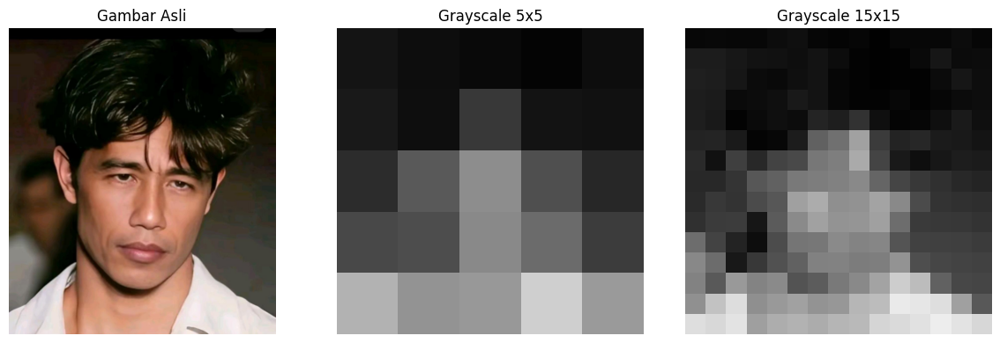

Array grayscale 5x5:
[[ 20  13   9   4  13]
 [ 25  14  57  19  17]
 [ 45  90 141  79  39]
 [ 72  77 137 107  61]
 [178 147 152 207 154]]


In [5]:
# Demo: Mengubah gambar user menjadi citra grayscale berukuran kecil
# Target tugas: menampilkan citra grayscale 5x5, lalu versi 15x15 agar wajah masih lebih terlihat.

img_user = cv2.imread(user_img_path)
if img_user is None:
    raise FileNotFoundError(f"Gambar tidak ditemukan: {user_img_path}")

img_user_rgb = cv2.cvtColor(img_user, cv2.COLOR_BGR2RGB)
img_user_gray = cv2.cvtColor(img_user, cv2.COLOR_BGR2GRAY)

# Resize grayscale menjadi 5x5 dan 15x15
numpy_img_1ch = cv2.resize(img_user_gray, (5, 5), interpolation=cv2.INTER_AREA)
gray_15x15 = cv2.resize(img_user_gray, (15, 15), interpolation=cv2.INTER_AREA)

fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(img_user_rgb)
axs[0].set_title('Gambar Asli')
axs[0].axis('off')

axs[1].imshow(numpy_img_1ch, cmap='gray', vmin=0, vmax=255, interpolation='nearest')
axs[1].set_title('Grayscale 5x5')
axs[1].axis('off')

axs[2].imshow(gray_15x15, cmap='gray', vmin=0, vmax=255, interpolation='nearest')
axs[2].set_title('Grayscale 15x15')
axs[2].axis('off')

plt.tight_layout()
plt.show()

print('Array grayscale 5x5:')
print(numpy_img_1ch)


**💭 Refleksi**
- Kenapa kita perlu `cmap='gray'` saat menampilkan gambar?
- Apa maksud dari `dtype=np.uint8`?

> Coba hilangkan argumen cmap='gray' dan lihat hasilnya!

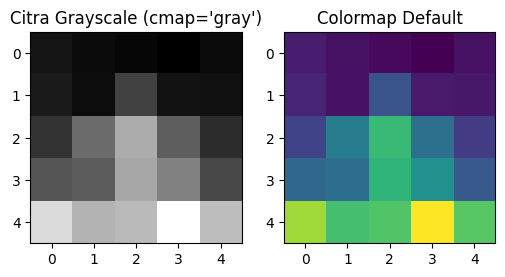

In [6]:
fig, axs = plt.subplots(1, 2, figsize=(6,3))
axs[0].imshow(numpy_img_1ch, cmap='gray')
axs[0].set_title("Citra Grayscale (cmap='gray')")
axs[1].imshow(numpy_img_1ch)
axs[1].set_title("Colormap Default")
plt.show()

Channel Merah: 
[[  0   0 255   0 255]
 [  0   0 255   0   0]
 [255 255 255 255 255]
 [  0   0 255   0   0]
 [  0   0 255   0   0]]
Channel Hijau: 
[[255 255   0 255 255]
 [255 255   0 255 255]
 [  0   0   0   0   0]
 [255 255   0 255 255]
 [255 255   0 255 255]]
Channel Biru: 
[[  0   0   0   0 255]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0   0   0   0]]


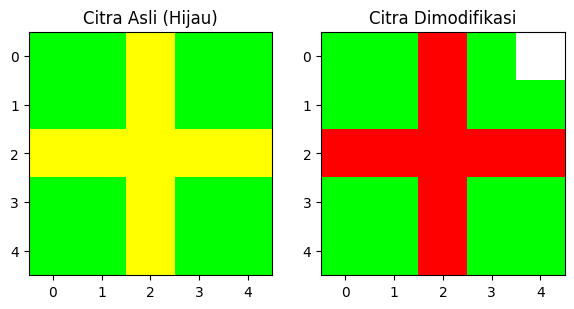

In [7]:
# Demo: Modifikasi piksel pada citra RGB
numpy_img_rgb = np.zeros((5, 5, 3), dtype=np.uint8)

# Set background hijau
numpy_img_rgb[:, :] = [0, 255, 0]

# Set kuning ke tengah citra
numpy_img_rgb[2, :] = [255, 255, 0]
numpy_img_rgb[:, 2] = [255, 255, 0]

# Salin untuk modifikasi
numpy_img_rgb_modified = numpy_img_rgb.copy()

# Buat plus merah di baris & kolom ke-2
numpy_img_rgb_modified[2, :] = [255, 0, 0]   
numpy_img_rgb_modified[:, 2] = [255, 0, 0]  

# Tambahkan titik putih di koordinat (0,4)
numpy_img_rgb_modified[0, 4] = [255, 255, 255]

# Tampilkan channel numeriknya
print(f"Channel Merah: \n{numpy_img_rgb_modified[:, :, 0]}")
print(f"Channel Hijau: \n{numpy_img_rgb_modified[:, :, 1]}")
print(f"Channel Biru: \n{numpy_img_rgb_modified[:, :, 2]}")

# Plot berdampingan
fig, axs = plt.subplots(1, 2, figsize=(6, 3))

axs[0].imshow(numpy_img_rgb)  # asli hijau
axs[0].set_title("Citra Asli (Hijau)")

axs[1].imshow(numpy_img_rgb_modified) 
axs[1].set_title("Citra Dimodifikasi")

plt.tight_layout()
plt.show()

## **Operasi Dasar Citra**

Pada sesi ini, kita akan melakukan muat gambar, menampilkan, *resizing, cropping,* konversi warna, dan memisahkan channel warna.

### **Hands-On: 1. *Load* Gambar**

Muat gambar dengan `cv2.imread()` dan tampilkan dengan `matplotlib`. Langkah-langkahnya:

1. **Import Library**: Pastikan `cv2` dan `os` sudah di-import.
2. **Path Gambar**: Gunakan `os.path.join` untuk path yang kompatibel di semua OS.
3. **Load Gambar**: Pakai `cv2.imread(path)`, hasilnya array numpy.
4. **Tampilkan**: Gunakan `cv2.imshow` atau `matplotlib`.

> **Tips**: `os.path.join` bikin path lebih aman dan fleksibel di berbagai sistem operasi.


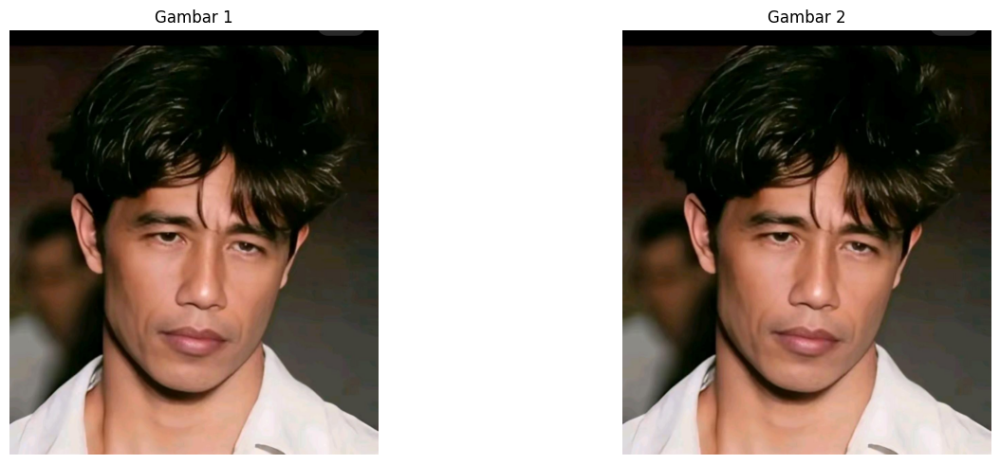

In [8]:
# Path gambar
img_path = user_img_path
img2_path = user_img_path

# Baca gambar
img = cv2.imread(img_path)
img2 = cv2.imread(img2_path)

# Konversi BGR → RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Plot berdampingan
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(img_rgb)
axs[0].set_title('Gambar 1')
axs[0].axis('off')

axs[1].imshow(img2_rgb)
axs[1].set_title('Gambar 2')
axs[1].axis('off')

plt.tight_layout()
plt.show()

> **Pertanyaan:** Mengapa kita harus melakukan `cv2.cvtColor cv2.COLOR_BGR2RGB`?

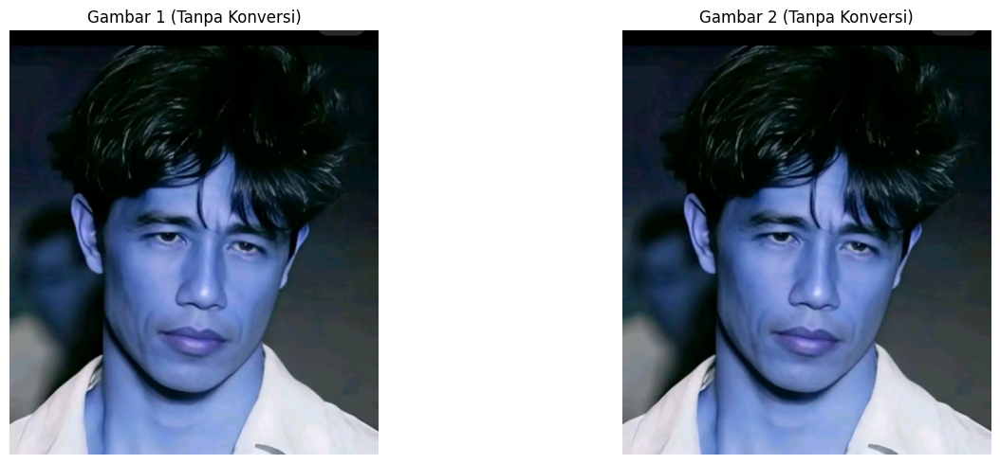

In [9]:
# Load gambar original tanpa cvtColor
img_bgr = cv2.imread(img_path)
img2_bgr = cv2.imread(img2_path)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(img_bgr)
axs[0].set_title('Gambar 1 (Tanpa Konversi)')
axs[0].axis('off')

axs[1].imshow(img2_bgr)
axs[1].set_title('Gambar 2 (Tanpa Konversi)')
axs[1].axis('off')

plt.tight_layout()
plt.show()

In [10]:
# Menyimpan gambar
# Tentukan folder output
output_folder = os.path.dirname(img_path)

# Simpan gambar dalam berbagai format
cv2.imwrite(os.path.join(output_folder, 'gambar_output.jpg'), img_bgr)
cv2.imwrite(os.path.join(output_folder, 'gambar_output.png'), img_bgr)

# Mengontrol kualitas JPEG (0-100)
cv2.imwrite(os.path.join(output_folder, 'gambar_kualitas_tinggi.jpg'), img_bgr, [cv2.IMWRITE_JPEG_QUALITY, 95])
cv2.imwrite(os.path.join(output_folder, 'gambar_kualitas_rendah.jpg'), img_bgr, [cv2.IMWRITE_JPEG_QUALITY, 30])

True

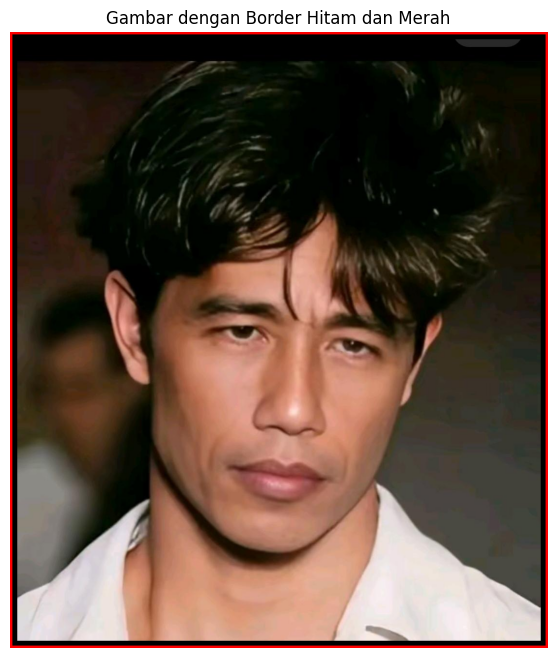

In [11]:
# Materi di kelas: Menambahkan border hitam 10px dan border merah 5px pada gambar1
border_black = 10
border_red = 5

# Dimensi gambar asli
height, width, channels = img2_rgb.shape

# Membuat array baru untuk gambar dengan border hitam
img_with_black_border = np.zeros((height + 2 * border_black, width + 2 * border_black, channels), dtype=np.uint8)
img_with_black_border[border_black:-border_black, border_black:-border_black] = img2_rgb

# Membuat array baru untuk gambar dengan border merah
img_with_red_border = np.zeros((height + 2 * (border_black + border_red), width + 2 * (border_black + border_red), channels), dtype=np.uint8)
img_with_red_border[:, :] = [255, 0, 0]  # Warna merah
img_with_red_border[border_red:-border_red, border_red:-border_red] = img_with_black_border

# Plot hasil
plt.figure(figsize=(8, 8))
plt.imshow(img_with_red_border)
plt.title("Gambar dengan Border Hitam dan Merah")
plt.axis("off")
plt.show()

Shape img2_rgb: (1243, 1080, 3)


(np.float64(-0.5), np.float64(1079.5), np.float64(1242.5), np.float64(-0.5))

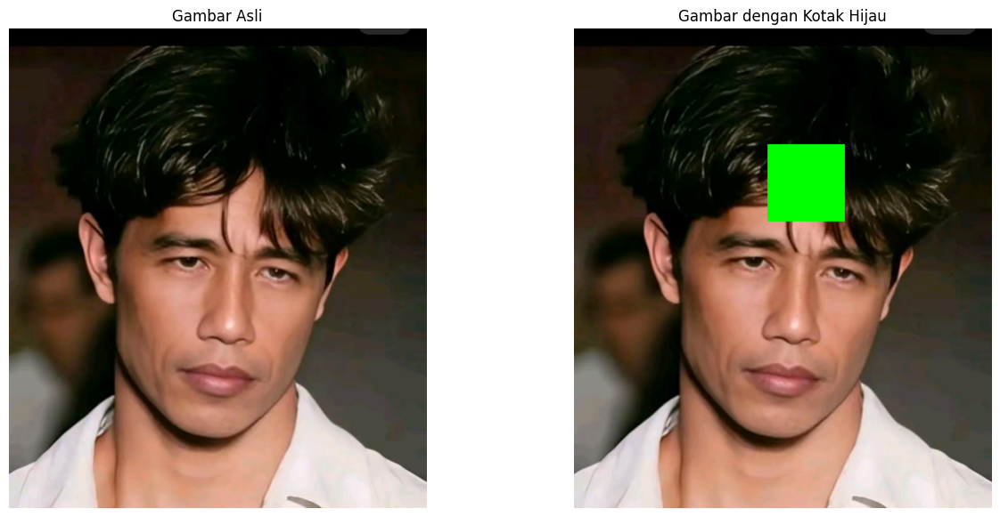

In [12]:
# Materi di kelas: Mencoba memanipulasi warna di koordinat tertentu dan juga menampilkan tanpa matplotlib
from IPython.display import display

# Tampilkan shape gambar
print("Shape img2_rgb:", img2_rgb.shape)

# Koordinat untuk kotak hijau
x1, y1 = 500, 300  # Koordinat kiri atas
x2, y2 = 700, 500  # Koordinat kanan bawah

# Salin gambar untuk manipulasi
img2_rgb_green_box = img2_rgb.copy()

# Ubah warna menjadi hijau di area tertentu
img2_rgb_green_box[y1:y2, x1:x2] = [0, 255, 0]  # Warna hijau (R=0, G=255, B=0)

# Plot gambar asli dan hasil manipulasi
fig, axs = plt.subplots(1, 2, figsize=(15, 7))

# Gambar asli
axs[0].imshow(img2_rgb)
axs[0].set_title("Gambar Asli")
axs[0].axis("off")

# Gambar dengan kotak hijau
axs[1].imshow(img2_rgb_green_box)
axs[1].set_title("Gambar dengan Kotak Hijau")
axs[1].axis("off")

📌 **Cheatsheet OpenCV Dasar**

**Membaca Gambar (`cv2.imread`)**
- **IMREAD_COLOR** → default, format BGR  
- **IMREAD_GRAYSCALE** → hitam putih  
- **IMREAD_UNCHANGED** → asli (misal RGBA)  

**Menyimpan Gambar (`cv2.imwrite`)**
- Simpan ke `.jpg`, `.png`, dll  
- **IMWRITE_JPEG_QUALITY** → kontrol kualitas (0–100)  
- **IMWRITE_PNG_COMPRESSION** → kontrol kompresi (0–9)  

**Menampilkan Gambar (`cv2.imshow`)**
- Membuka jendela gambar  
- Gunakan `waitKey` untuk pause & `destroyAllWindows` untuk menutup  

**Informasi Gambar**
- `.shape` → ukuran (rows, cols, channels)  

**Operasi Dasar**
- **Resize (`cv2.resize`)** → ubah ukuran / skala gambar  
- **Color Conversion (`cv2.cvtColor`)** → ubah BGR ↔ RGB ↔ Grayscale  


### **Hands-On: 2. *Resize* (Mengubah Ukuran Gambar)**

*Resize* adalah proses **mengubah dimensi gambar** sesuai kebutuhan. Proses ini sering dilakukan untuk:

- Mengurangi ukuran file gambar  
- Menyesuaikan dengan resolusi layar atau halaman web  
- Normalisasi ukuran input untuk model pembelajaran mesin  

**Cara Kerja:**
- Fungsi utama: `cv2.resize()`
- Parameter utama: `(width, height)` dalam bentuk tuple
- Pemilihan **metode interpolasi** berpengaruh pada kualitas hasil:
  - `cv2.INTER_LINEAR` → default, baik untuk memperbesar
  - `cv2.INTER_AREA` → terbaik untuk memperkecil
  - `cv2.INTER_CUBIC` dan `cv2.INTER_LANCZOS4` → kualitas tinggi, lebih halus untuk memperbesar


Shape img2_rgb: (1243, 1080, 3)
Tinggi gambar: 1243 piksel
Lebar gambar: 1080 piksel
Jumlah channel: 3 (RGB)


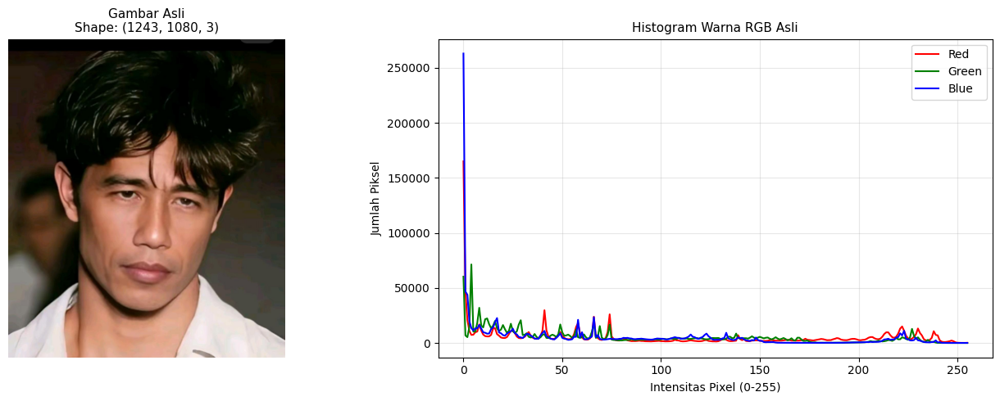

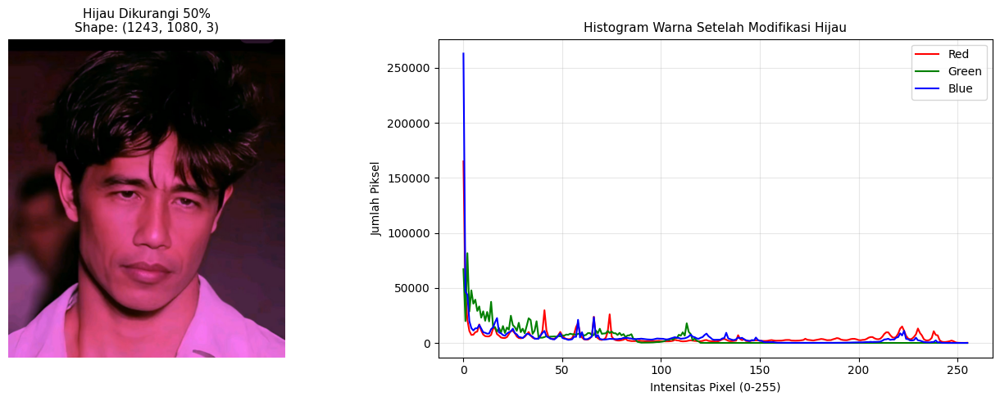


=== Penjelasan cv2.calcHist ===
cv2.calcHist([gambar], [channel], mask, [bins], [range])
- [gambar]: gambar input dalam list
- [channel]: channel yang ingin dihitung (0=R, 1=G, 2=B)
- mask: None berarti semua piksel dihitung
- [bins]: jumlah interval histogram (256 untuk 0-255)
- [range]: rentang nilai piksel [0,256)


In [13]:
# Mengecek shape dari gambar
print("Shape img2_rgb:", img2_rgb.shape)  # (tinggi, lebar, channel)
print("Tinggi gambar:", img2_rgb.shape[0], "piksel")
print("Lebar gambar:", img2_rgb.shape[1], "piksel")
print("Jumlah channel:", img2_rgb.shape[2], "(RGB)")

# Tampilkan gambar + histogram dalam 1 layout
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

# Gambar asli
axs[0].imshow(img2_rgb)
axs[0].set_title(f"Gambar Asli\nShape: {img2_rgb.shape}", fontsize=11)
axs[0].axis('off')

# Histogram RGB asli
colors = ('r','g','b')
labels = ('Red','Green','Blue')
for i, (col, label) in enumerate(zip(colors, labels)):
    hist = cv2.calcHist([img2_rgb], [i], None, [256], [0,256])
    axs[1].plot(hist, color=col, label=label)

axs[1].set_title("Histogram Warna RGB Asli", fontsize=11)
axs[1].set_xlabel("Intensitas Pixel (0-255)")
axs[1].set_ylabel("Jumlah Piksel")
axs[1].legend()
axs[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Modifikasi: Kurangi intensitas warna hijau (G) menjadi setengah
img2_mod = img2_rgb.copy()
img2_mod[:,:,1] = (img2_mod[:,:,1] * 0.5).astype(np.uint8)

# Tampilkan gambar hasil modifikasi
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

# Gambar hasil modifikasi
axs[0].imshow(img2_mod)
axs[0].set_title("Hijau Dikurangi 50%\nShape: {}".format(img2_mod.shape), fontsize=11)
axs[0].axis('off')

# Histogram setelah modifikasi
for i, (col, label) in enumerate(zip(colors, labels)):
    hist = cv2.calcHist([img2_mod], [i], None, [256], [0,256])
    axs[1].plot(hist, color=col, label=label)

axs[1].set_title("Histogram Warna Setelah Modifikasi Hijau", fontsize=11)
axs[1].set_xlabel("Intensitas Pixel (0-255)")
axs[1].set_ylabel("Jumlah Piksel")
axs[1].legend()
axs[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Penjelasan calcHist
print("\n=== Penjelasan cv2.calcHist ===")
print("cv2.calcHist([gambar], [channel], mask, [bins], [range])")
print("- [gambar]: gambar input dalam list")
print("- [channel]: channel yang ingin dihitung (0=R, 1=G, 2=B)")
print("- mask: None berarti semua piksel dihitung")
print("- [bins]: jumlah interval histogram (256 untuk 0-255)")
print("- [range]: rentang nilai piksel [0,256)")


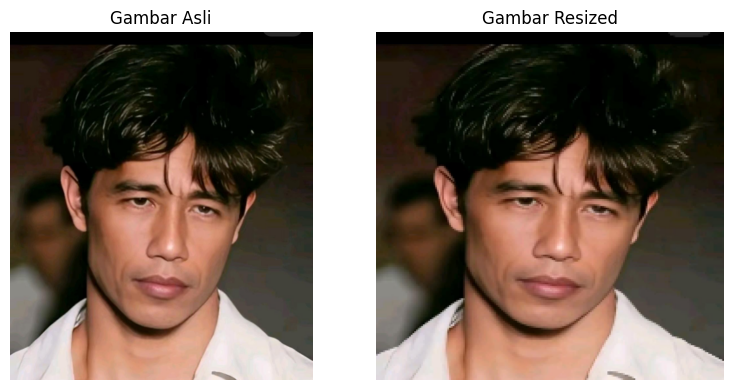

In [14]:
# Melakukan perubahan ukuran pada gambar (resizing)
img_resized = cv2.resize(img, (200, 200))
img_resized_rgb = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)

# Plot hasil
fig, axs = plt.subplots(1, 2, figsize=(8, 4))

# Original
axs[0].imshow(img_rgb)
axs[0].set_title("Gambar Asli")
axs[0].axis("off")

# Cropped
axs[1].imshow(img_resized_rgb)
axs[1].set_title("Gambar Resized")
axs[1].axis("off")

plt.tight_layout()
plt.show()

### **Hands-On: 3. *Crop* (Memotong Gambar)**
*Crop* adalah proses memotong bagian tertentu dari gambar, seperti memperbesar objek tertentu atau menghilangkan latar belakang yang tidak diperlukan.

**Cara Kerja:**
- Gambar direpresentasikan sebagai array numpy dengan format `[height, width, channels]`.
- *Crop* dilakukan dengan slicing array numpy:
  - `cropped_image = image[y1:y2, x1:x2]`
  - `y1`, `y2` adalah batas vertikal, dan `x1`, `x2` adalah batas horizontal.


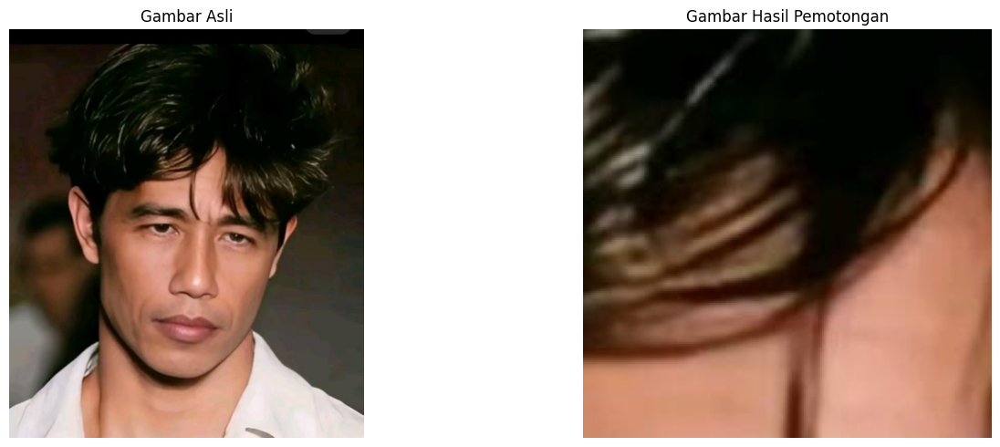

In [15]:
# Melakukan pemotongan
img_cropped_original = img[300:500, 450:650]

# Plot gambar
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Original no Crop
axs[0].imshow(img_rgb)
axs[0].set_title('Gambar Asli')
axs[0].axis('off')

# Original cropped image
axs[1].imshow(cv2.cvtColor(img_cropped_original, cv2.COLOR_BGR2RGB))
axs[1].set_title('Gambar Hasil Pemotongan')
axs[1].axis('off')

plt.tight_layout()
plt.show()


**Latihan**
Di bawah ini, kita akan coba untuk memotong gambar menjadi setengah tingginya.

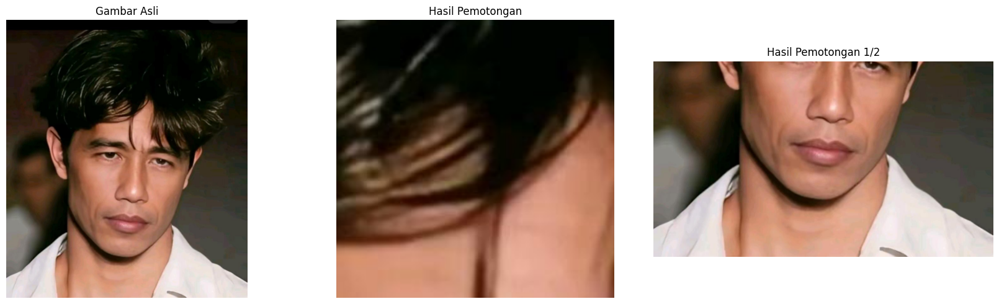

In [16]:
img_cropped_modification = img[img.shape[0]//2:, :]

# Plot 
fig, axs = plt.subplots(1, 3, figsize=(17, 5))

# Original no Crop
axs[0].imshow(img_rgb)
axs[0].set_title('Gambar Asli')
axs[0].axis('off')

# Original cropped image
axs[1].imshow(cv2.cvtColor(img_cropped_original, cv2.COLOR_BGR2RGB))
axs[1].set_title('Hasil Pemotongan')
axs[1].axis('off')

# Original cropped image modif
axs[2].imshow(cv2.cvtColor(img_cropped_modification, cv2.COLOR_BGR2RGB))
axs[2].set_title('Hasil Pemotongan 1/2')
axs[2].axis('off')

plt.tight_layout()
plt.show()

### **Hands-On: 4. *Flip* (Membalik Gambar)**

*Flip* adalah proses membalik gambar secara horizontal, vertikal, atau keduanya. Proses ini sering digunakan untuk augmentasi data atau untuk mencerminkan gambar.

**Cara Kerja:**
- Gambar direpresentasikan sebagai array numpy dengan format `[height, width, channels]`.
- *Flip* dilakukan menggunakan fungsi `cv2.flip()`:
    - `cv2.flip(image, 0)` → Membalik gambar secara vertikal.
    - `cv2.flip(image, 1)` → Membalik gambar secara horizontal.
    - `cv2.flip(image, -1)` → Membalik gambar secara horizontal dan vertikal.

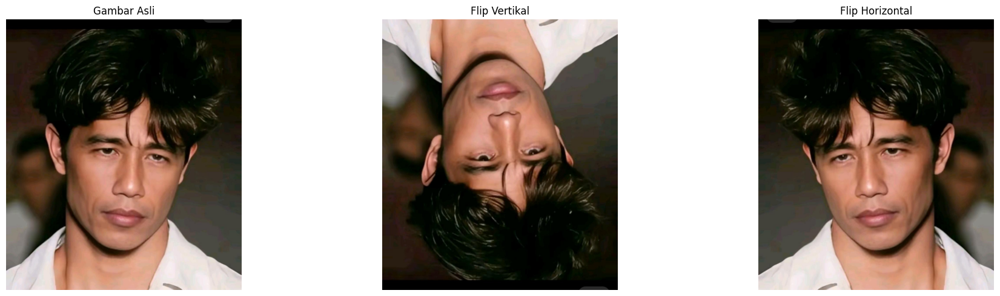

In [17]:
# Membalik gambar secara vertikal, horizontal, dan keduanya
img_flip_vertical = cv2.flip(img2_rgb, 0)  # Membalik vertikal
img_flip_horizontal = cv2.flip(img2_rgb, 1)  # Membalik horizontal

# Plot hasil
fig, axs = plt.subplots(1, 3, figsize=(20, 5))

# Gambar asli
axs[0].imshow(img2_rgb)
axs[0].set_title("Gambar Asli")
axs[0].axis('off')

# Flip vertikal
axs[1].imshow(img_flip_vertical)
axs[1].set_title("Flip Vertikal")
axs[1].axis('off')

# Flip horizontal
axs[2].imshow(img_flip_horizontal)
axs[2].set_title("Flip Horizontal")
axs[2].axis('off')

plt.tight_layout()
plt.show()

### **Hands-On: 5. Konversi Antar Ruang Warna**

Pada sesi ini, kita akan melakukan konversi antara ruang warna (RGB ke Grayscale/HSV).

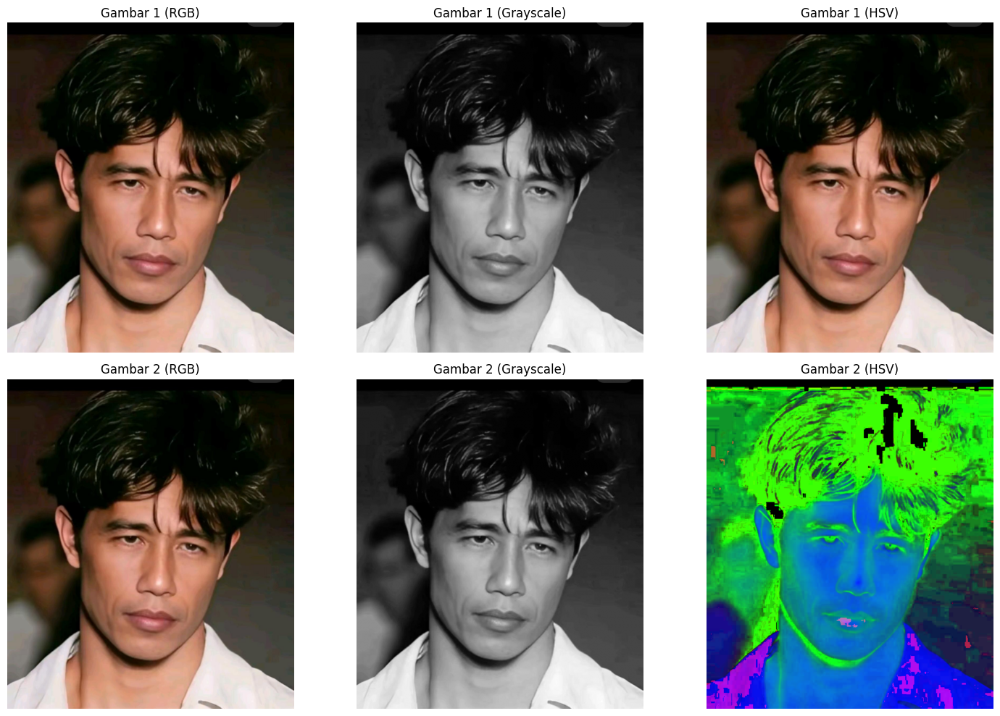

In [18]:
# Konversi RGB ke Grayscale dan HSV untuk img
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Konversi RGB ke Grayscale dan HSV untuk img2
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
img2_hsv = cv2.cvtColor(img2, cv2.COLOR_BGR2HSV)

# Plot hasil konversi
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Gambar 1
axs[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title("Gambar 1 (RGB)")
axs[0, 0].axis('off')

axs[0, 1].imshow(img_gray, cmap='gray')
axs[0, 1].set_title("Gambar 1 (Grayscale)")
axs[0, 1].axis('off')

axs[0, 2].imshow(cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB))
axs[0, 2].set_title("Gambar 1 (HSV)")
axs[0, 2].axis('off')

# Gambar 2
axs[1, 0].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
axs[1, 0].set_title("Gambar 2 (RGB)")
axs[1, 0].axis('off')

axs[1, 1].imshow(img2_gray, cmap='gray')
axs[1, 1].set_title("Gambar 2 (Grayscale)")
axs[1, 1].axis('off')

axs[1, 2].imshow(img2_hsv)
axs[1, 2].set_title("Gambar 2 (HSV)")
axs[1, 2].axis('off')

plt.tight_layout()
plt.show()

### **Hands-On: 6. Memisahkan dan menampilkan channel warna.**

Pada sesi ini, kita akan memisahkan dan menampilkan channel warna.

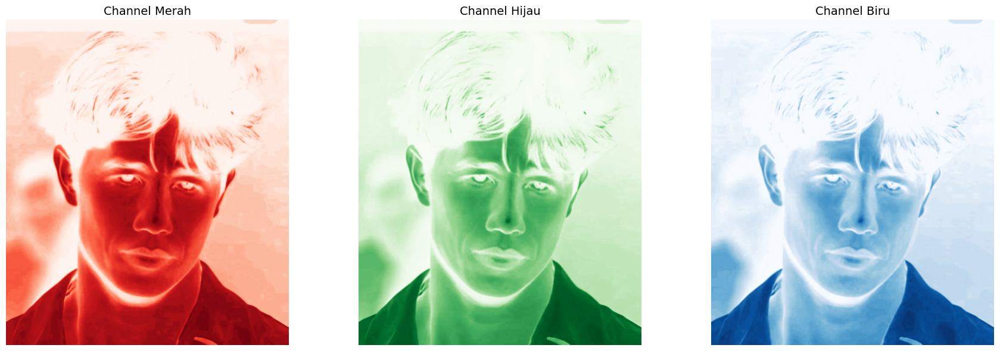

In [19]:
# Pisahkan channel warna
red_channel = img2_rgb[:, :, 0]
green_channel = img2_rgb[:, :, 1]
blue_channel = img2_rgb[:, :, 2]

# Tampilkan channel warna
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Channel Merah
axs[0].imshow(red_channel, cmap='Reds')
axs[0].set_title("Channel Merah", fontsize=14)
axs[0].axis('off')

# Channel Hijau
axs[1].imshow(green_channel, cmap='Greens')
axs[1].set_title("Channel Hijau", fontsize=14)
axs[1].axis('off')

# Channel Biru
axs[2].imshow(blue_channel, cmap='Blues')
axs[2].set_title("Channel Biru", fontsize=14)
axs[2].axis('off')

plt.tight_layout()
plt.show()

**Latihan**

Mencoba memodifikasi gambar HSV kemudian mengembalikannya dengan RGB

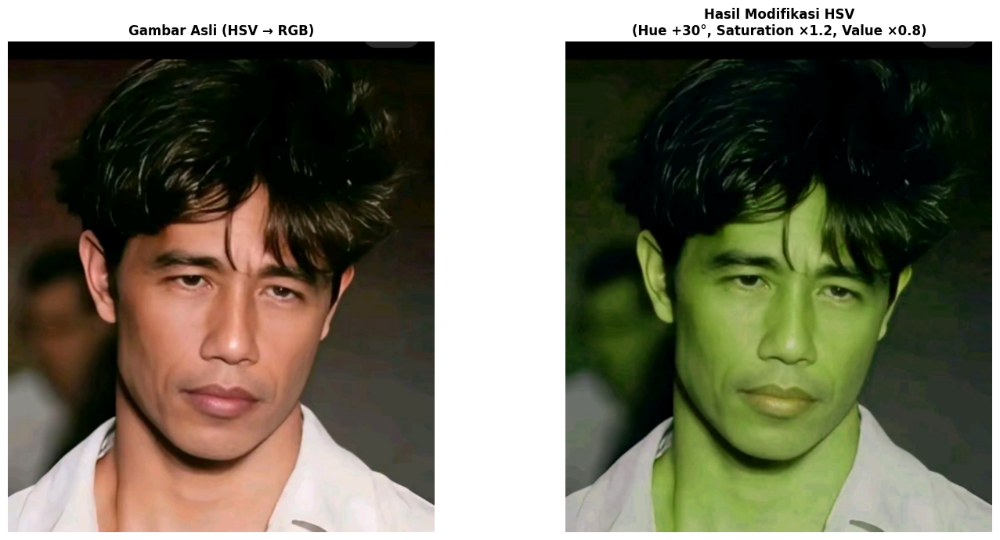

In [20]:
# Salin gambar HSV untuk dimodifikasi
img_hsv_modified = img2_hsv.copy().astype(np.float32)

# Modifikasi nilai H, S, dan V
img_hsv_modified[:, :, 0] = (img_hsv_modified[:, :, 0] + 30) % 180        # Hue digeser 30 derajat
img_hsv_modified[:, :, 1] = np.clip(img_hsv_modified[:, :, 1] * 1.2, 0, 255)  # Saturation diperkuat 20%
img_hsv_modified[:, :, 2] = np.clip(img_hsv_modified[:, :, 2] * 0.8, 0, 255)  # Value diredupkan 20%

img_hsv_modified = img_hsv_modified.astype(np.uint8)

# Konversi ke RGB 
img_rgb_original = cv2.cvtColor(img2_hsv, cv2.COLOR_HSV2RGB)
img_rgb_modified = cv2.cvtColor(img_hsv_modified, cv2.COLOR_HSV2RGB)

# Plot gambar asli dan hasil modifikasi
fig, axs = plt.subplots(1, 2, figsize=(15, 7))

# Gambar asli
axs[0].imshow(img_rgb_original)
axs[0].set_title("Gambar Asli (HSV → RGB)", fontsize=12, fontweight='bold')
axs[0].axis('off')

# Gambar hasil modifikasi
axs[1].imshow(img_rgb_modified)
axs[1].set_title("Hasil Modifikasi HSV\n(Hue +30°, Saturation ×1.2, Value ×0.8)", fontsize=12, fontweight='bold')
axs[1].axis('off')

plt.tight_layout()
plt.show()


## **Transformasi Geometris**

Transformasi geometris meliputi translasi (menggeser), rotasi (memutar), dan scaling (mengubah ukuran).

- **Translasi:** Menggeser posisi gambar.
- **Rotasi:** Memutar gambar pada sudut tertentu.
- **Scaling:** Mengubah ukuran gambar.

Semua transformasi ini dapat direpresentasikan dengan matriks transformasi.

### **Hands-On: Manipulasi Piksel dan Dimensi Gambar**

Gambar digital adalah kumpulan piksel dengan nilai warna **RGB** (Red, Green, Blue) dalam rentang **0–255**.  
Kenapa 0–255? Karena format **8-bit per channel** memungkinkan 256 nilai unik (2⁸).  
- **0** = intensitas terendah (hitam).  
- **255** = intensitas tertinggi (putih).  

Setiap gambar memiliki atribut `.shape` yang menunjukkan dimensi: `(tinggi, lebar, channel)`.  
Contoh: `(1024, 1536, 3)` berarti gambar berwarna dengan 1024 piksel tinggi, 1536 piksel lebar, dan 3 channel warna.  

Mari kita eksplorasi lebih jauh dengan memanipulasi posisi dan orientasi piksel!


Shape img2_rgb: (1243, 1080, 3)
Tinggi gambar: 1243 piksel
Lebar gambar: 1080 piksel
Jumlah channel: 3 (RGB)
Isi dari row5_column5_img1:
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


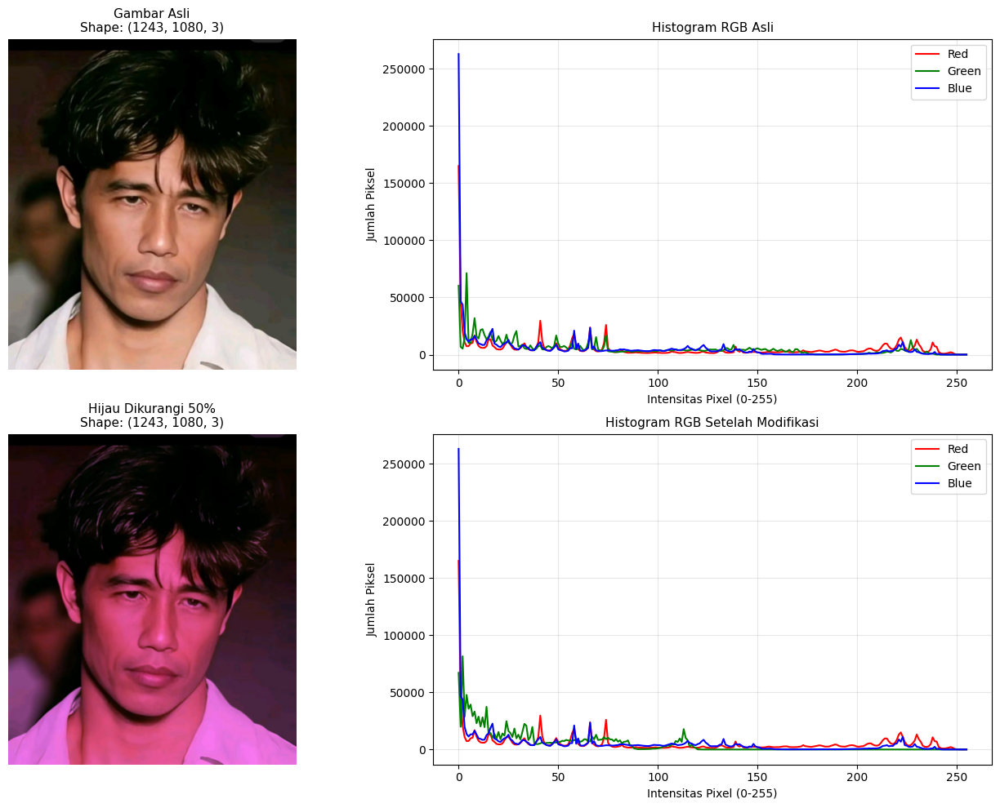


=== Penjelasan cv2.calcHist ===
cv2.calcHist([gambar], [channel], mask, [bins], [range])
- [gambar]: gambar input dalam list
- [channel]: channel yang ingin dihitung (0=R, 1=G, 2=B)
- mask: None berarti semua piksel dihitung
- [bins]: jumlah interval histogram (256 untuk 0-255)
- [range]: rentang nilai piksel [0,256)


In [21]:
# Mengecek shape dari gambar
print("Shape img2_rgb:", img2_rgb.shape)
print("Tinggi gambar:", img2_rgb.shape[0], "piksel")
print("Lebar gambar:", img2_rgb.shape[1], "piksel")
print("Jumlah channel:", img2_rgb.shape[2], "(RGB)")
row5_column5 = img2_rgb[0:5, 0:5]
print(f"Isi dari row5_column5_img1:\n{row5_column5}")

# Modifikasi: Kurangi intensitas warna hijau (G) menjadi setengah
img2_mod = img2_rgb.copy()
img2_mod[:,:,1] = (img2_mod[:,:,1] * 0.5).astype(np.uint8)

# Buat layout 2x2
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

colors = ('r','g','b')
labels = ('Red','Green','Blue')

# Gambar Asli
axs[0,0].imshow(img2_rgb)
axs[0,0].set_title(f"Gambar Asli\nShape: {img2_rgb.shape}", fontsize=11)
axs[0,0].axis('off')

# Histogram Asli
for i, (col, label) in enumerate(zip(colors, labels)):
    hist = cv2.calcHist([img2_rgb], [i], None, [256], [0,256])
    axs[0,1].plot(hist, color=col, label=label)
axs[0,1].set_title("Histogram RGB Asli", fontsize=11)
axs[0,1].set_xlabel("Intensitas Pixel (0-255)")
axs[0,1].set_ylabel("Jumlah Piksel")
axs[0,1].legend()
axs[0,1].grid(True, alpha=0.3)

# Gambar Modifikasi
axs[1,0].imshow(img2_mod)
axs[1,0].set_title(f"Hijau Dikurangi 50%\nShape: {img2_mod.shape}", fontsize=11)
axs[1,0].axis('off')

# Histogram Modifikasi
for i, (col, label) in enumerate(zip(colors, labels)):
    hist = cv2.calcHist([img2_mod], [i], None, [256], [0,256])
    axs[1,1].plot(hist, color=col, label=label)
axs[1,1].set_title("Histogram RGB Setelah Modifikasi", fontsize=11)
axs[1,1].set_xlabel("Intensitas Pixel (0-255)")
axs[1,1].set_ylabel("Jumlah Piksel")
axs[1,1].legend()
axs[1,1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Penjelasan calcHist
print("\n=== Penjelasan cv2.calcHist ===")
print("cv2.calcHist([gambar], [channel], mask, [bins], [range])")
print("- [gambar]: gambar input dalam list")
print("- [channel]: channel yang ingin dihitung (0=R, 1=G, 2=B)")
print("- mask: None berarti semua piksel dihitung")
print("- [bins]: jumlah interval histogram (256 untuk 0-255)")
print("- [range]: rentang nilai piksel [0,256)")


### **Hands-On: Transformasi Posisi dan Orientasi Piksel**

Transformasi pada citra berarti **mengubah posisi, arah, atau ukuran piksel** menggunakan operasi matematis berbasis matriks.

#### **1. Translasi (Perpindahan)**

Menggeser seluruh piksel sejauh nilai tertentu pada sumbu x dan y.

➡ Tidak mengubah warna piksel, hanya posisinya.

➡ Area yang keluar dari batas gambar hilang, dan bagian kosong diisi warna latar.

#### **2. Rotasi (Perputaran)**

Memutar seluruh citra terhadap titik pusat.

➡ Mengubah orientasi gambar tanpa mengubah nilai warna.

➡ Dapat menimbulkan area kosong atau potongan di tepi gambar.

#### **3. Scaling (Penskalaan)**

Mengubah ukuran gambar dengan faktor `(s_x, s_y)`.

➡ Saat diperbesar, piksel lama direplikasi → detail menurun.

➡ Saat diperkecil, beberapa piksel digabung → sebagian data visual hilang.

➡ Scaling mempengaruhi **ketajaman dan jumlah informasi** dalam citra.

#### **4. Kombinasi Transformasi**

Beberapa transformasi dapat digabung secara berurutan.

➡ Urutan operasi berpengaruh pada hasil akhir.

➡ Secara matematis direpresentasikan melalui **perkalian matriks transformasi**.

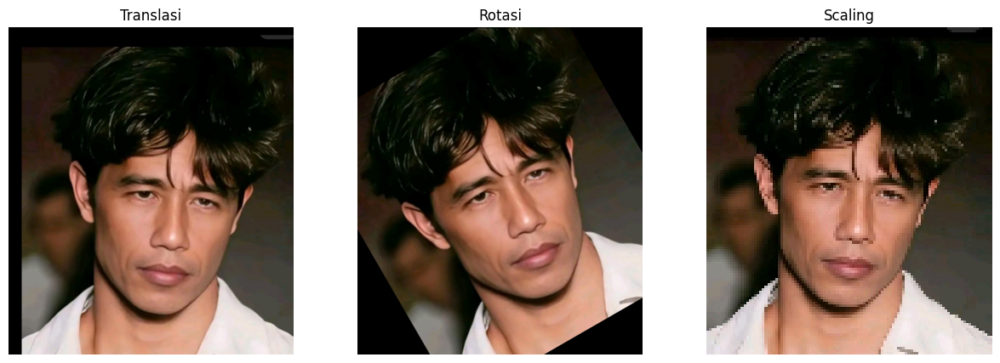

In [22]:
# Demo transformasi: translasi, rotasi, scaling
rows, cols = img_rgb.shape[:2]

# Translasi
M_trans = np.float32([[1, 0, 50], [0, 1, 30]])  # Geser 50px kanan, 30px bawah
img_trans = cv2.warpAffine(img_rgb, M_trans, (cols, rows))

# Rotasi
M_rot = cv2.getRotationMatrix2D((cols/2, rows/2), 30, 1)  # Rotasi 30 derajat
img_rot = cv2.warpAffine(img_rgb, M_rot, (cols, rows))

# Scaling
img_scale = cv2.resize(img_rgb, None, fx=0.1, fy=0.1)

# Tampilkan hasil
fig, axs = plt.subplots(1,3, figsize=(15,5))
axs[0].imshow(img_trans); axs[0].set_title('Translasi')
axs[1].imshow(img_rot); axs[1].set_title('Rotasi')
axs[2].imshow(img_scale); axs[2].set_title('Scaling')
for ax in axs: ax.axis('off')
plt.show()

## **Transformasi & Anotasi**

Pada sesi ini, kita akan memutar gambar 45 derajat tanpa terpotong, menggeser objek, dan menambahkan anotasi visual.

### **Hands-On: Memutar Gambar Sebesar 45 Derajat Tanpa Memotong**

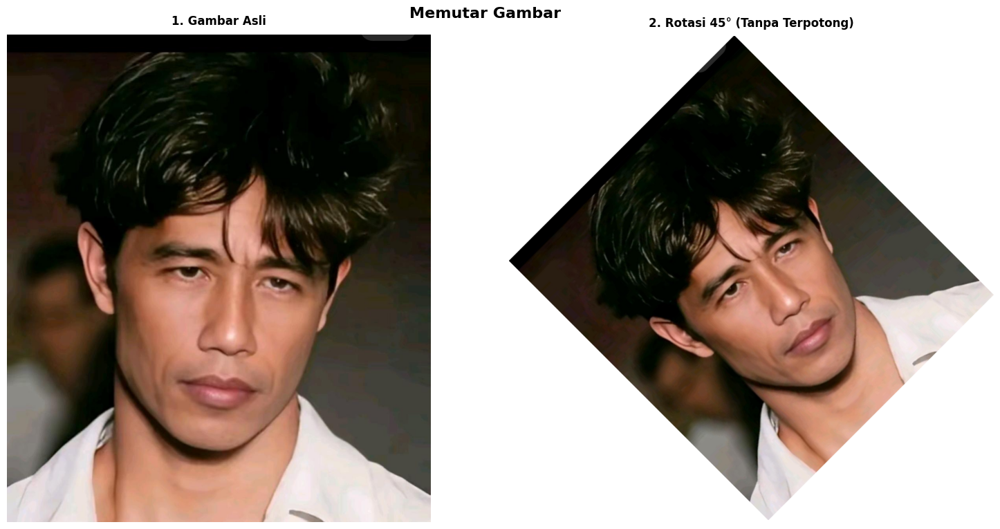

• Rotasi: 45° dengan canvas baru 1642x1642 px


In [23]:
rows, cols = img2_rgb.shape[:2] 

# Original Image 
img_original = img2_rgb.copy()

# Rotasi 45° TANPA TERPOTONG
angle = 45
M = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1) 

# Hitung dimensi canvas baru
cos = np.abs(M[0, 0]) 
sin = np.abs(M[0, 1]) 
new_width = int((rows * sin) + (cols * cos)) 
new_height = int((rows * cos) + (cols * sin)) 

# Sesuaikan translasi agar tetap di tengah canvas baru
M[0, 2] += (new_width / 2) - cols/2 
M[1, 2] += (new_height / 2) - rows/2 

# Rotasi dengan background putih
img_rotated = cv2.warpAffine(img2_rgb, M, (new_width, new_height), 
                            borderValue=(255, 255, 255))


# PLOT 2x3 Layout 
fig, axes = plt.subplots(1, 2, figsize=(15, 8))
fig.suptitle('Memutar Gambar', 
             fontsize=16, fontweight='bold', y=0.95)

# Baris pertama
axes[0].imshow(img_original) 
axes[0].set_title('1. Gambar Asli', fontsize=12, fontweight='bold', pad=10) 
axes[0].axis('off') 

axes[1].imshow(img_rotated) 
axes[1].set_title('2. Rotasi 45° (Tanpa Terpotong)', fontsize=12, fontweight='bold', pad=10) 
axes[1].axis('off') 

# Penyesuaian layout
plt.tight_layout()
plt.subplots_adjust(top=0.90, hspace=0.15, wspace=0.1)
plt.show()

# Informasi Parameter 
print(f"• Rotasi: {angle}° dengan canvas baru {new_width}x{new_height} px")

### **Hands-On: Menggeser Posisi Objek di dalam Gambar**

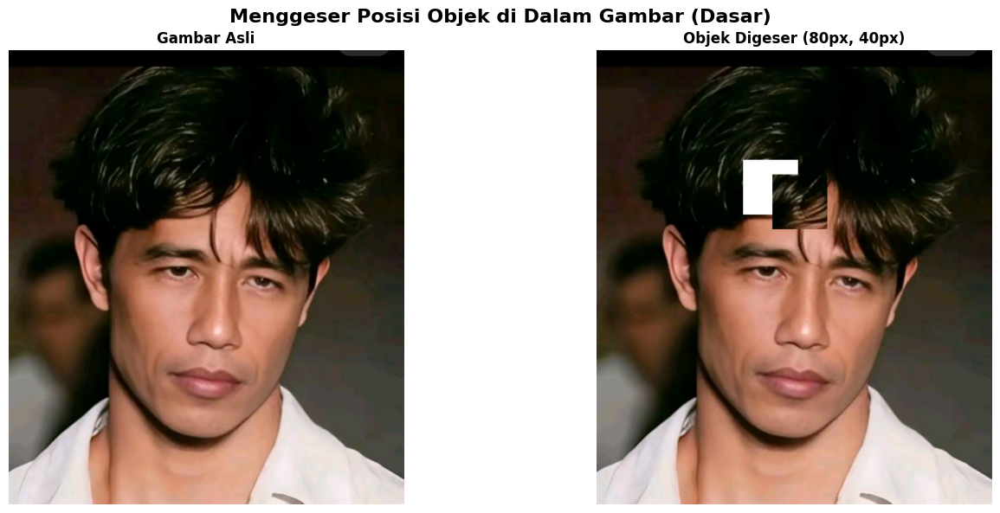

Objek awal: (y=300:450, x=400:550)
Digeser ke: (y=340:490, x=480:630)


In [24]:
# Tentukan area objek (misalnya kotak tengah)
obj = img2_rgb[300:450, 400:550].copy()
bg_obj = img2_rgb.copy()

# Hapus area lama (diganti putih)
bg_obj[300:450, 400:550] = 255

# Geser posisi objek
tx, ty = 80, 40  # geser ke kanan 80px, ke bawah 40px
bg_obj[300+ty:450+ty, 400+tx:550+tx] = obj

# Plot hasil
fig, axs = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Menggeser Posisi Objek di Dalam Gambar (Dasar)', fontsize=16, fontweight='bold')

axs[0].imshow(img_original)
axs[0].set_title('Gambar Asli', fontweight='bold')
axs[0].axis('off')

axs[1].imshow(bg_obj)
axs[1].set_title(f'Objek Digeser ({tx}px, {ty}px)', fontweight='bold')
axs[1].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

print(f"Objek awal: (y=300:450, x=400:550)")
print(f"Digeser ke: (y={300+ty}:{450+ty}, x={400+tx}:{550+tx})")

### **Hands-On: Pengenalan Fungsi Menggambar**

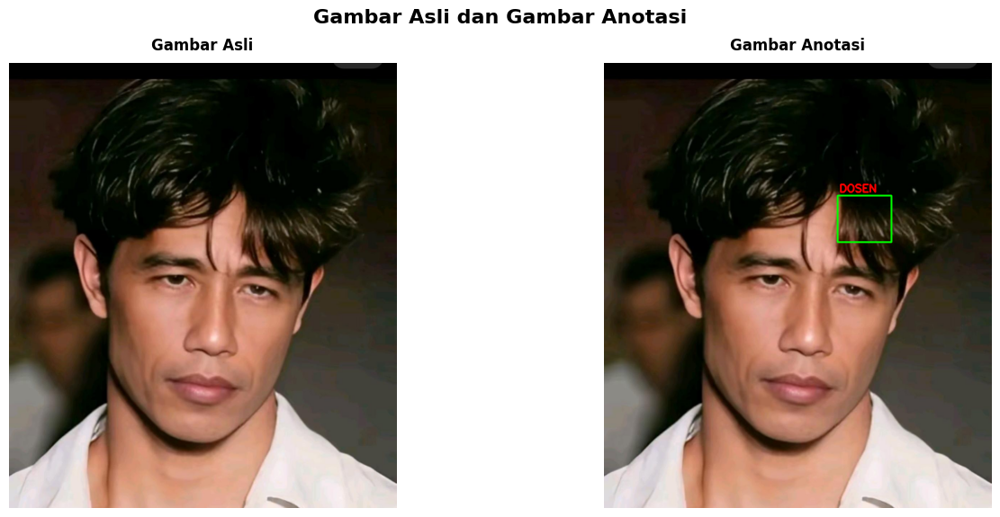

• Rectangle: koordinat (650,370) ke (800,500) - hijau, tebal 4px
• Text: 'DOSEN' pada (655,360) - merah, ukuran 1.0


In [25]:
# Anotasi (Rectangle & Text)
img_annotated = img2_rgb.copy() 
cv2.rectangle(img_annotated, (650, 370), (800, 500), (0, 255, 0), 4)  # Hijau tebal
cv2.putText(img_annotated, 'DOSEN', (655, 360), cv2.FONT_HERSHEY_SIMPLEX,  
            1.0, (255, 0, 0), 3)  # Merah tebal
shift_x = 500
shift_y = 500
# Anotasi pada hasil Translasi
img_final = img_annotated.copy()
cv2.rectangle(img_final, (650+shift_x, 370+shift_y), (800+shift_x, 500+shift_y), 
              (0, 255, 0), 4)
cv2.putText(img_final, 'TRANSFORMED', (655+shift_x, 360+shift_y), 
            cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 3)

# PLOT 1x2 Layout 
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle('Gambar Asli dan Gambar Anotasi', fontsize=16, fontweight='bold', y=0.95)

# Original Image
axes[0].imshow(img_original)
axes[0].set_title('Gambar Asli', fontsize=12, fontweight='bold', pad=10)
axes[0].axis('off')

# Annotated Image
axes[1].imshow(img_annotated)
axes[1].set_title('Gambar Anotasi', fontsize=12, fontweight='bold', pad=10)
axes[1].axis('off')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85, wspace=0.3)
plt.show()

print(f"• Rectangle: koordinat (650,370) ke (800,500) - hijau, tebal 4px")
print(f"• Text: 'DOSEN' pada (655,360) - merah, ukuran 1.0")

**Penjelasan**
* OpenCV menggunakan fungsi `cv2.getRotationMatrix2D()` untuk membuat matriks rotasi 2D berdasarkan pusat, sudut, dan skala.
* Fungsi `cv2.warpAffine()` digunakan untuk menerapkan transformasi (rotasi, translasi, kombinasi) ke gambar dengan parameter matriks transformasi dan ukuran canvas baru.
* Translasi dibuat dengan matriks manual `np.float32([[1, 0, shift_x], [0, 1, shift_y]])` untuk menggeser posisi gambar.
* Fungsi `cv2.rectangle()` digunakan untuk menggambar kotak pada gambar dengan menentukan koordinat sudut, warna, dan ketebalan garis.
* Fungsi `cv2.putText()` digunakan untuk menambahkan teks pada gambar dengan menentukan posisi, jenis font, ukuran, warna, dan ketebalan huruf.
